In [308]:
import pandas as pd
pd.set_option('display.max_colwidth', 100)
import warnings
import numpy as np
import re
import skimage.io
from scipy.io import loadmat
from scipy.optimize import curve_fit, minimize
from scipy.interpolate import Rbf, RBFInterpolator, RegularGridInterpolator
from scipy.stats import ttest_1samp,ttest_ind,tukey_hsd,f_oneway
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os
from glob import glob
from statannotations.Annotator import Annotator
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
matplotlib.rcParams.update({'font.size': 18}) #change font size
savePath="C:\\Users\\Xiaofan\\Google Drive\\Stanford\\HIRK Lab\\Biofilm project\\communitiesPaper\\latex\\figures\\subpanelPdfs"

In [2]:
import scipy
pd.__version__

'1.5.3'

In [2]:
def readTiff(tiffFile,numFrames=18,imSize=256):
    img=skimage.io.imread(tiffFile)
    return np.reshape(img,[numFrames,int(img.shape[0]/numFrames),imSize,imSize,3]) 

def imagesc(img,quantileLims=(0.05,0.95),lims=None,ax=None,**kwargs):
    if lims is None:
        vmin=np.quantile(img,quantileLims[0],axis=(0,1))
        vmax=np.quantile(img,quantileLims[1],axis=(0,1))
    else:
        vmin=lims[0]
        vmax=lims[1]
    if ax is None:
        return plt.imshow((img-vmin)/(vmax-vmin),**kwargs)
#         return plt.imshow(img,vmin=vmin,vmax=vmax,**kwargs)
    else:
        return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
#         return ax.imshow(img,vmin=vmin,vmax=vmax,**kwargs)

def logisticFuncOld(x,a,c,x0):
    return a/(1+np.exp((x-x0)))+c

def fitX0Old(y,x=None,bounds=None):
    if x is None:
        x=range(len(y))
    if bounds is None:
        bounds=([0,0,min(x)],[np.max(y),np.max(y),max(x)])
    params,_=curve_fit(f=logisticFuncOld,
          xdata=x,ydata=y,
          method='trf',bounds=bounds)
    return params

def logisticFunc(x,a,b,c,x0):
    return a/(1+np.exp((x-x0)/b))+c

def fitX0(y,x=None,bounds=None):
    if x is None:
        x=range(len(y))
    if bounds is None:
        bounds=([0,0,0,min(x)],[np.max(y),max(x)-min(x),np.max(y),max(x)])
    params,_=curve_fit(f=logisticFunc,
          xdata=x,ydata=y,
          method='trf',bounds=bounds)
    return params

def fitSlice(imgZsum,lim1,lim2,frame,channel,xlims=None,umPerPixel=850/256):
    if channel==1:
        imgSlice=imgZsum[frame,lim1:lim2,:,channel]
    elif channel==0:
        imgSlice=imgZsum[frame,:,lim1:lim2,channel].T
    else:
        return None
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    xlims[0]=np.max([0,xlims[0]])
    xlims[1]=np.min([imgSlice.shape[1],xlims[1]])
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
    return params

def getLinePlotDf(imgSlice,time,xlims=None,umPerPixel=850/256):
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
#    yFit=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1])
    yFit=logisticFunc(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1])
    df1=pd.DataFrame({'x':x,'y':(y-ymin)/(ymax-ymin)})
    df1['type']='data'
    df2=pd.DataFrame({'x':x,'y':(yFit-ymin)/(ymax-ymin)})
    df2['type']='fit'
    df=pd.concat([df1,df2])
    df['time']=time
    return params,df

def getMeanFluorescence(img,rep,xlims=None,ylims=None,boxSize=50):
    imgSize=img.shape[-2]
    if len(img.shape)==5:
        frame0=np.squeeze(img[0,:,:,:,:])
    else:
        frame0=img
    if xlims is None and ylims is None:
        redBoundary=fitX0(np.sum(frame0[:,:,:,0],axis=(0,2)))[-1]
        greenBoundary=fitX0(np.sum(frame0[:,:,:,1],axis=(0,1)))[-1]
        xlims=np.round([(greenBoundary-boxSize)/2,
                        (greenBoundary+boxSize)/2,
                        (greenBoundary+imgSize-boxSize)/2,
                        (greenBoundary+imgSize+boxSize)/2]).astype(int)
        ylims=np.round([(redBoundary-boxSize)/2,
                        (redBoundary+boxSize)/2,
                        (redBoundary+imgSize-boxSize)/2,
                        (redBoundary+imgSize+boxSize)/2]).astype(int)
    elif ylims is None:
        ylims=xlims
    df=pd.DataFrame([np.mean(frame0[:,ylims[0]:ylims[1],xlims[0]:xlims[1],:],axis=(0,1,2)),
                     np.mean(frame0[:,ylims[0]:ylims[1],xlims[2]:xlims[3],:],axis=(0,1,2)),
                     np.mean(frame0[:,ylims[2]:ylims[3],xlims[0]:xlims[1],:],axis=(0,1,2)),
                     np.mean(frame0[:,ylims[2]:ylims[3],xlims[2]:xlims[3],:],axis=(0,1,2))]) 
    df.columns=['RFP','GFP','Hoescht']
    df.index=['GR','R','G','N']
    df=df.unstack().reset_index().rename(columns={'level_0':'channel','level_1':'region',0:'mean fluorescence (AU)'})
    df['rep']=rep
    
    return df[['channel','region','rep','mean fluorescence (AU)']]

def getZMeans(img,rep,xlims=None,ylims=None,boxSize=50,imgSizeUm=850):
    imgSize=img.shape[-2]
    umPerPixel=imgSizeUm/imgSize

    if len(img.shape)==5:
        frame0=np.squeeze(img[0,:,:,:,:])
    else:
        frame0=img
    if xlims is None and ylims is None:
        redBoundary=fitX0(np.sum(frame0[:,:,:,0],axis=(0,2)))[-1]
        greenBoundary=fitX0(np.sum(frame0[:,:,:,1],axis=(0,1)))[-1]
        xlims=np.round([(greenBoundary-boxSize)/2,
                        (greenBoundary+boxSize)/2]).astype(int)
        ylims=np.round([(redBoundary-boxSize)/2,
                        (redBoundary+boxSize)/2]).astype(int)
    elif ylims is None:
        ylims=xlims
    df=pd.DataFrame(np.mean(frame0[:,ylims[0]:ylims[1],xlims[0]:xlims[1],:],axis=(1,2)),columns=['RFP','GFP','Hoescht']).stack().reset_index().rename(columns={'level_0':'z-height (μm)','level_1':'channel',0:'mean fluorescence (AU)'})
    df['z-height (μm)']=df['z-height (μm)']*umPerPixel
    df['rep']=rep
    
    return df[['channel','rep','z-height (μm)','mean fluorescence (AU)']]

def getDiffMeanFluorescence(img,rep,xlims=None,ylims=None,boxSize=50):
    imgSize=img.shape[-2]
    if len(img.shape)==5:
        frame0=np.squeeze(img[0,:,:,:,:])
    else:
        frame0=img
    if xlims is None and ylims is None:
        horzBoundary=fitX0(np.max(np.sum(frame0[:,:,:,0],axis=(0,2)))-np.sum(frame0[:,:,:,0],axis=(0,2)))[-1]
        vertBoundary=fitX0(np.sum(frame0[:,:,:,0],axis=(0,1)))[-1]
        xlims=np.round([(vertBoundary-boxSize)/2,
                        (vertBoundary+boxSize)/2,
                        (vertBoundary+imgSize-boxSize)/2,
                        (vertBoundary+imgSize+boxSize)/2]).astype(int)
        ylims=np.round([(horzBoundary-boxSize)/2,
                        (horzBoundary+boxSize)/2,
                        (horzBoundary+imgSize-boxSize)/2,
                        (horzBoundary+imgSize+boxSize)/2]).astype(int)
    elif ylims is None:
        ylims=xlims
    df=pd.DataFrame([np.mean(frame0[:,ylims[2]:ylims[3],xlims[0]:xlims[1],:],axis=(0,1,2)),
                     np.mean(frame0[:,ylims[2]:ylims[3],xlims[2]:xlims[3],:],axis=(0,1,2)),
                     np.mean(frame0[:,ylims[0]:ylims[1],xlims[0]:xlims[1],:],axis=(0,1,2))]) 
    df.columns=['RFP','GFP','Hoescht']
    df.index=['RB','B','N']
    df=df.unstack().reset_index().rename(columns={'level_0':'channel','level_1':'region',0:'mean fluorescence (AU)'})
    df['rep']=rep
    
    return df[['channel','region','rep','mean fluorescence (AU)']]

In [483]:
tiffDf.groupby('expt').filename.count()



expt
250standalone_ampGrad     27
250standalone_kanGrad     27
J4K5standalone_ampGrad    27
J4K5standalone_kanGrad    27
J4K5succ250_ampGrad       27
J4K5succ250_kanGrad       27
Name: filename, dtype: int64

In [3]:
tiffDf=pd.DataFrame(glob('C:\\Users\\Xiaofan/Desktop\\confocal data\\timelapseProcessed\\*\\shifted\\*.tif*'),columns=['filename'])
tiffDf['expt']=[os.path.normpath(filename).split(os.sep)[-3].rsplit('with',1)[0].rstrip('_|37') for filename in tiffDf.filename]
tiffDf['pos']=[int(os.path.basename(filename).split('.')[0].split('_p')[-1]) for filename in tiffDf.filename]

conds=['pbs',
      '0x',
      '1x',
      '3x',
      '10x',
      '30x',
      '100x',
      '300x',
      '1000x']
reps=[1,2,3]
condRepDf=pd.MultiIndex.from_product([conds,reps]).to_frame().reset_index()[[0,1]].reset_index().rename(columns={'index':'pos',0:'cond',1:'rep'})

tiffDf=tiffDf.merge(condRepDf,on='pos').sort_values(by='filename').reset_index(drop=True)
print(tiffDf.expt.unique())
tiffDf.head()

['250standalone_ampGrad' '250standalone_kanGrad' 'J4K5standalone_ampGrad'
 'J4K5standalone_kanGrad' 'J4K5succ250_ampGrad' 'J4K5succ250_kanGrad']


,filename,expt,pos,cond,rep
0,C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_t...,250standalone_ampGrad,0,pbs,1
1,C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_t...,250standalone_ampGrad,1,pbs,2
2,C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_t...,250standalone_ampGrad,2,pbs,3
3,C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_t...,250standalone_ampGrad,3,0x,1
4,C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_t...,250standalone_ampGrad,4,0x,2


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(18, 46, 256, 256, 3)


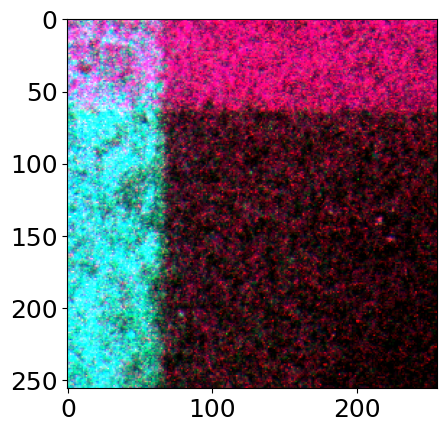

In [5]:
expts=['J4K5succ250_kanGrad']
reps=[1]
conds=['pbs']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
print(img.shape)
plt.figure()
imagesc(np.mean(img[0,:,:,:,:],axis=0))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(18, 46, 256, 256, 3)


C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


array([1.55139101e+07, 7.40114953e+00, 8.40358482e+06, 8.71453406e+01])

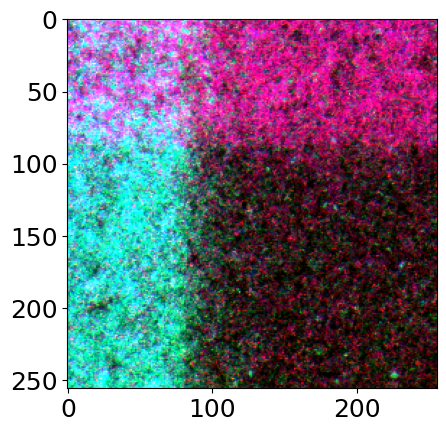

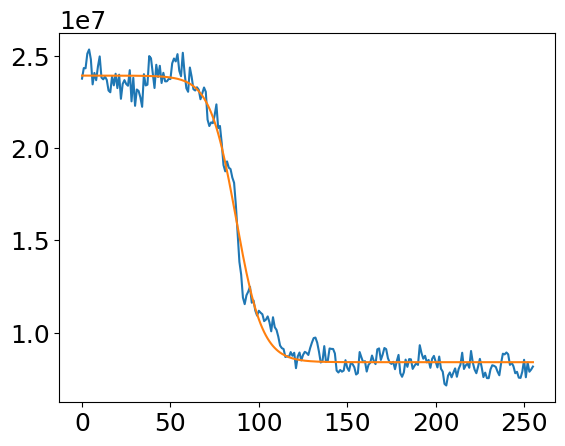

In [6]:


expts=['J4K5succ250_ampGrad']
reps=[1]
conds=['pbs']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
print(img.shape)
plt.figure()
imagesc(np.mean(img[0,:,:,:,:],axis=0))

plt.figure()
params=fitX0(np.sum(img[0,:,:,:,0],axis=(0,2)))
sns.lineplot(range(256),np.sum(img[0,:,:,:,0],axis=(0,2)))
sns.lineplot(range(256),np.asarray([logisticFunc(x,*params) for x in range(256)]))


params

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

R_RFP vs. G_RFP: t-test paired samples, P_val:2.369e-03 t=2.051e+01
GR_GFP vs. R_GFP: t-test paired samples, P_val:1.449e-02 t=8.217e+00
R_GFP vs. G_GFP: t-test paired samples, P_val:4.159e-03 t=-1.546e+01
G_GFP vs. N_GFP: t-test paired samples, P_val:4.710e-03 t=1.452e+01
GR_RFP vs. G_RFP: t-test paired samples, P_val:5.810e-04 t=4.147e+01
R_RFP vs. N_RFP: t-test paired samples, P_val:1.791e-04 t=7.472e+01
GR_RFP vs. N_RFP: t-test paired samples, P_val:3.433e-03 t=1.702e+01
GR_GFP vs. N_GFP: t-test paired samples, P_val:1.508e-02 t=8.051e+00


,channel,region,rep,mean fluorescence (AU)
0,RFP,GR,J4K5succ250_kanGrad1,1623.584252
1,RFP,R,J4K5succ250_kanGrad1,1864.607435
2,RFP,G,J4K5succ250_kanGrad1,649.914539
3,RFP,N,J4K5succ250_kanGrad1,568.250565
4,GFP,GR,J4K5succ250_kanGrad1,3117.413026


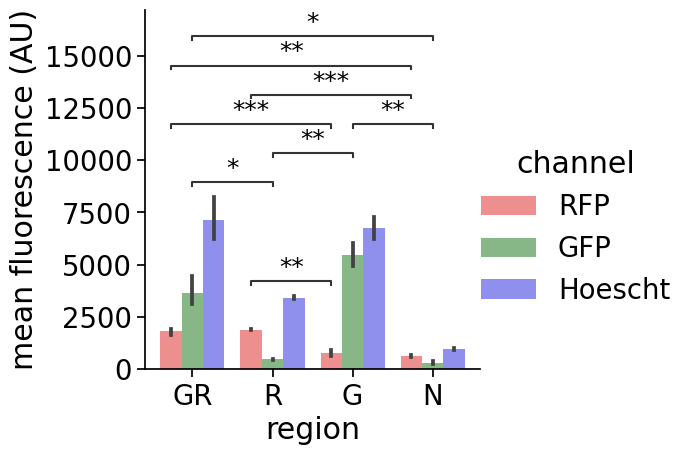

In [7]:
expts=['J4K5succ250_kanGrad']
reps=[1,2,3]
conds=['pbs']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
#img=readTiff(subsetFiles[0])
#print(img.shape)
##skimage.io.imsave('C:\\Users\\Xiaofan\\Desktop\\temp\\test.tif',np.squeeze(img[0,:,:,:,:]))

initFluoDf=pd.concat([getMeanFluorescence(readTiff(filename),rep) for filename,rep in zip(tiffDfSubset.filename,tiffDfSubset.expt+tiffDfSubset.rep.astype(str))])
with sns.plotting_context("notebook",font_scale=1.8):
    g=sns.catplot(x='region',y='mean fluorescence (AU)',hue='channel',data=initFluoDf,
           kind='bar',palette=['red','green','blue'],alpha=0.5,aspect=1.1,height=5)
    
annot = Annotator(g.ax, [(("GR", "RFP"), ("G", "RFP")),
                        (("GR", "RFP"), ("N", "RFP")),
                        (("R", "RFP"), ("G", "RFP")),
                        (("R", "RFP"), ("N", "RFP")),
                        (("GR", "GFP"), ("R", "GFP")),
                        (("GR", "GFP"), ("N", "GFP")),
                        (("G", "GFP"), ("R", "GFP")),
                        (("G", "GFP"), ("N", "GFP")),
                        ], 
                  data=initFluoDf, x='region', y='mean fluorescence (AU)',hue='channel')
annot.configure(test='t-test_paired', text_format='star', loc='inside', verbose=2)
annot.apply_and_annotate()

g.savefig(os.path.join(savePath,'successionRegionFluorescence.pdf'))
initFluoDf.head()

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

GFP_G vs. GFP_N: t-test paired samples, P_val:4.710e-03 t=1.452e+01
RFP_R vs. RFP_G: t-test paired samples, P_val:2.369e-03 t=2.051e+01
GFP_GR vs. GFP_R: t-test paired samples, P_val:1.449e-02 t=8.217e+00
GFP_R vs. GFP_G: t-test paired samples, P_val:4.159e-03 t=-1.546e+01
RFP_R vs. RFP_N: t-test paired samples, P_val:1.791e-04 t=7.472e+01
RFP_GR vs. RFP_G: t-test paired samples, P_val:5.810e-04 t=4.147e+01
RFP_GR vs. RFP_N: t-test paired samples, P_val:3.433e-03 t=1.702e+01
GFP_GR vs. GFP_N: t-test paired samples, P_val:1.508e-02 t=8.051e+00


,channel,region,rep,mean fluorescence (AU)
0,RFP,GR,J4K5succ250_kanGrad1,1623.584252
1,RFP,R,J4K5succ250_kanGrad1,1864.607435
2,RFP,G,J4K5succ250_kanGrad1,649.914539
3,RFP,N,J4K5succ250_kanGrad1,568.250565
4,GFP,GR,J4K5succ250_kanGrad1,3117.413026


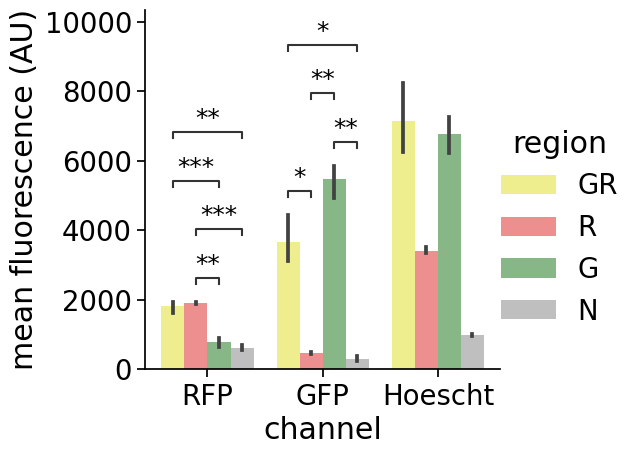

In [12]:
expts=['J4K5succ250_kanGrad']
reps=[1,2,3]
conds=['pbs']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
#img=readTiff(subsetFiles[0])
#print(img.shape)
##skimage.io.imsave('C:\\Users\\Xiaofan\\Desktop\\temp\\test.tif',np.squeeze(img[0,:,:,:,:]))

initFluoDf=pd.concat([getMeanFluorescence(readTiff(filename),rep) for filename,rep in zip(tiffDfSubset.filename,tiffDfSubset.expt+tiffDfSubset.rep.astype(str))])
with sns.plotting_context("notebook",font_scale=1.8):
    g=sns.catplot(x='channel',y='mean fluorescence (AU)',hue='region',data=initFluoDf,
           kind='bar',palette=['yellow','red','green','grey'],alpha=0.5,aspect=1.1,height=5)
    
annot = Annotator(g.ax, [(('RFP', 'GR'), ('RFP', 'G')),
                         (('RFP', 'GR'), ('RFP', 'N')),
                         (('RFP', 'R'), ('RFP', 'G')),
                         (('RFP', 'R'), ('RFP', 'N')),
                         (('GFP', 'GR'), ('GFP', 'R')),
                         (('GFP', 'GR'), ('GFP', 'N')),
                         (('GFP', 'G'), ('GFP', 'R')),
                         (('GFP', 'G'), ('GFP', 'N'))], 
                  data=initFluoDf, x='channel', y='mean fluorescence (AU)',hue='region')
annot.configure(test='t-test_paired', text_format='star', loc='inside', verbose=2)
annot.apply_and_annotate()

initFluoDf.head()

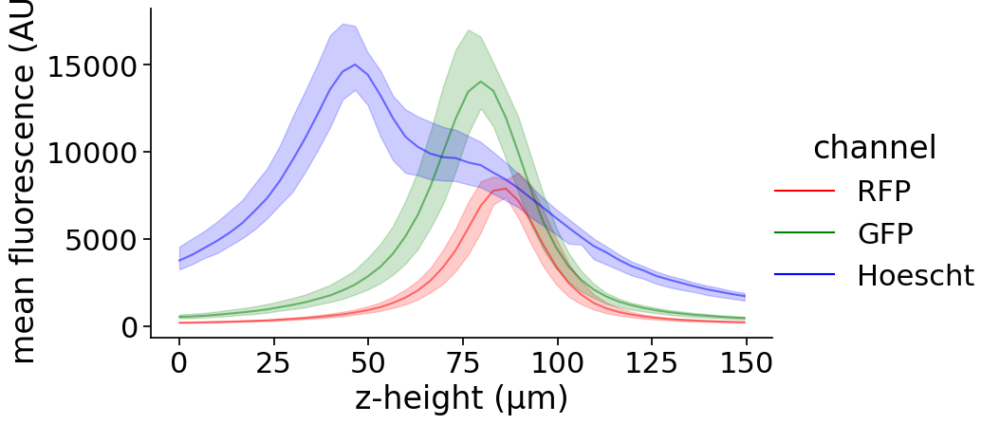

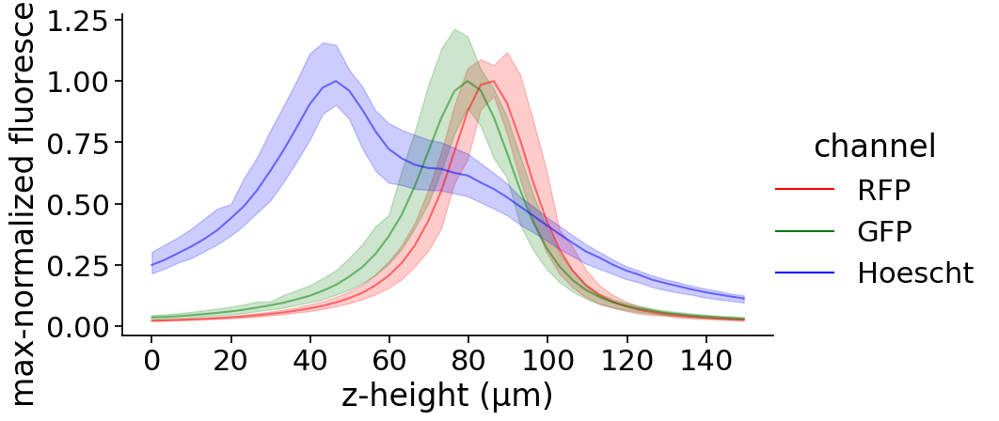

In [25]:
expts=['J4K5succ250_kanGrad']
reps=[1,2,3]
conds=['pbs']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
imgSizeUm=850
boxSize=50

initZMeansDf=pd.concat([getZMeans(readTiff(filename),rep) for filename,rep in zip(tiffDfSubset.filename,tiffDfSubset.rep.astype(int))]).reset_index(drop=True)
fluoMaxes=initZMeansDf.groupby(['channel','z-height (μm)'])['mean fluorescence (AU)'].mean().unstack().T.max().reset_index().rename(columns={0:'maxFluo'})
initZMeansDf=initZMeansDf.merge(fluoMaxes,how='left',on='channel')
initZMeansDf['max-normalized fluorescence'] = initZMeansDf['mean fluorescence (AU)']/initZMeansDf['maxFluo']

with sns.plotting_context("notebook",font_scale=2):
    g=sns.relplot(y='mean fluorescence (AU)',x='z-height (μm)',hue='channel',data=initZMeansDf,aspect=1.8,
                 palette=['red','green','blue'],alpha=0.5,kind='line')
g.savefig(os.path.join(savePath,'successionZFluorescence.pdf'))

with sns.plotting_context("notebook",font_scale=2):
    g=sns.relplot(y='max-normalized fluorescence',x='z-height (μm)',hue='channel',data=initZMeansDf,aspect=1.8,
                 palette=['red','green','blue'],alpha=0.5,kind='line')
g.savefig(os.path.join(savePath,'successionZFluorescence_maxNorm.pdf'))


In [9]:
diffTiffDf=pd.DataFrame(glob('C:\\Users\\Xiaofan/Desktop\\confocal data\\294diffAnalysis\\ctls\\*.tif*'),columns=['filename'])
diffTiffDf['cond']=[os.path.basename(filename).split('.')[0][:-1] for filename in diffTiffDf.filename]
diffTiffDf['rep']=[int(os.path.basename(filename).split('.')[0][-1]) for filename in diffTiffDf.filename]

diffTiffDf.head()

,filename,cond,rep
0,C:\Users\Xiaofan/Desktop\confocal data\294diffAnalysis\ctls\+ahl+illum1.tif,+ahl+illum,1
1,C:\Users\Xiaofan/Desktop\confocal data\294diffAnalysis\ctls\+ahl+illum2.tif,+ahl+illum,2
2,C:\Users\Xiaofan/Desktop\confocal data\294diffAnalysis\ctls\+ahl+illum3.tif,+ahl+illum,3
3,C:\Users\Xiaofan/Desktop\confocal data\294diffAnalysis\ctls\+ahl-illum1.tif,+ahl-illum,1
4,C:\Users\Xiaofan/Desktop\confocal data\294diffAnalysis\ctls\+ahl-illum2.tif,+ahl-illum,2


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

RB_RFP vs. B_RFP: t-test paired samples, P_val:2.238e-02 t=6.571e+00
B_Hoescht vs. N_Hoescht: t-test paired samples, P_val:2.043e-03 t=2.209e+01
RB_RFP vs. N_RFP: t-test paired samples, P_val:7.052e-03 t=1.185e+01
RB_Hoescht vs. N_Hoescht: t-test paired samples, P_val:1.240e-03 t=2.837e+01


,channel,region,rep,mean fluorescence (AU)
0,RFP,RB,1,2759.515687
1,RFP,B,1,1437.770461
2,RFP,N,1,307.179643
6,Hoescht,RB,1,3403.822139
7,Hoescht,B,1,3078.217565


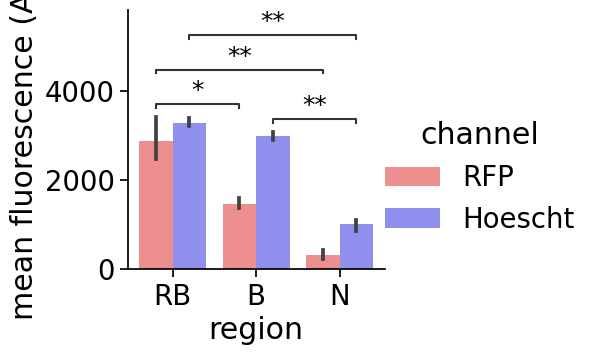

In [10]:
reps=[1,2,3]
conds=['+ahl+illum']
diffTiffDfSubset=diffTiffDf.loc[diffTiffDf.rep.isin(reps)&diffTiffDf.cond.isin(conds),:]

diffFluoDf=pd.concat([getDiffMeanFluorescence(readTiff(filename,numFrames=1,imSize=512),rep) for filename,rep in zip(diffTiffDfSubset.filename,diffTiffDfSubset.rep)])
diffFluoDf=diffFluoDf.loc[diffFluoDf.channel!='GFP',:]
with sns.plotting_context("notebook",font_scale=1.8):
    g=sns.catplot(x='region',y='mean fluorescence (AU)',hue='channel',data=diffFluoDf,
           kind='bar',palette=['red','blue'],alpha=0.5,
                 aspect=1.2,height=4)

annot = Annotator(g.ax, [(("RB", "RFP"), ("B", "RFP")),
                        (("RB", "RFP"), ("N", "RFP")),
                        (("RB", "Hoescht"), ("N", "Hoescht")),
                        (("B", "Hoescht"), ("N", "Hoescht")),
                        ], 
                  data=diffFluoDf, x='region', y='mean fluorescence (AU)',hue='channel')
annot.configure(test='t-test_paired', text_format='star', loc='inside', verbose=2)
annot.apply_and_annotate()
g.savefig(os.path.join(savePath,'differentiationRegionFluorescence.pdf'))
diffFluoDf.head()

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/

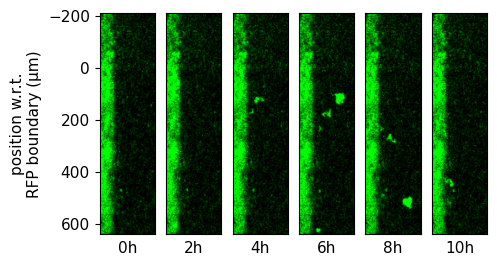

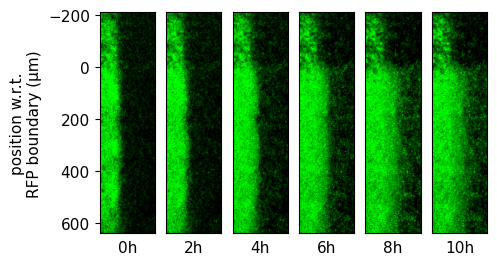

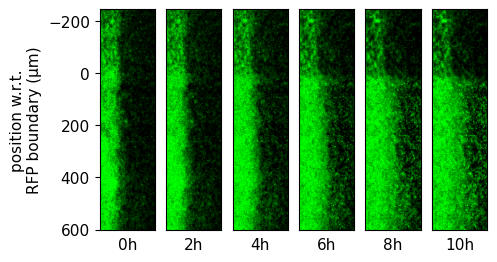

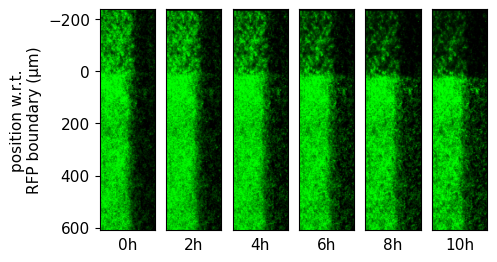

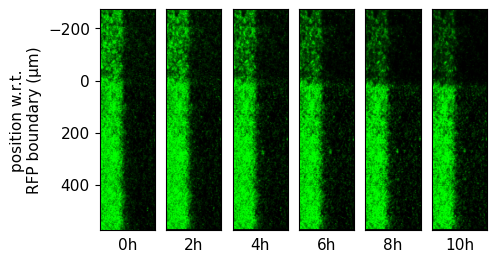

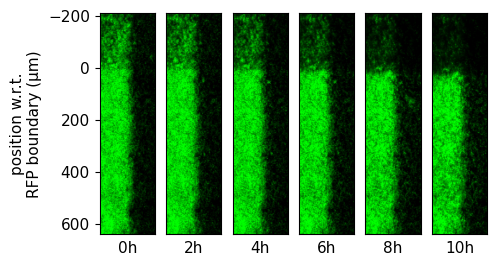

In [15]:
expts=['J4K5succ250_kanGrad']
reps=[1]
conds=['pbs','0x','1x','3x','10x','100x']
numFrames=6
ylims=[0,256]
xlims=[45,135]
numPixels=256
imSize=850

umPerPixel=imSize/numPixels

for cond in conds:
    tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin([cond]),:]
    img=readTiff(tiffDfSubset.filename.values[0])
    imgZsum=np.mean(img,axis=1)
    redBoundary=fitX0(np.sum(imgZsum[0,:,:,0],axis=1))[-1]
    fig,ax=plt.subplots(1,numFrames,figsize=(5,5),gridspec_kw={'wspace':0.2})
    for frame in range(numFrames):
        greenSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
        greenSlice[:,:,[0,2]]=0
        imagesc(greenSlice,ax=ax[frame],aspect=4,extent=[0,850,umPerPixel*(numPixels-1-redBoundary),umPerPixel*(-redBoundary)])
        if frame>-0:
            ax[frame].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
        else:
            ax[frame].set(xticklabels="",xticks=[],ylabel="position rel. RFP biofilm boundary (μm)")
            ax[frame].set_ylabel("position w.r.t.\nRFP boundary (μm)",fontsize=11)

            ax[frame].tick_params(axis='both', which='major', labelsize=11)
        ax[frame].set_xlabel(f"{2*frame}h",rotation=0,position=(.5,0),labelpad=5,fontsize=11)
        if cond=='0x':
            plt.savefig(os.path.join(savePath,'growthImageExample.pdf'))


In [9]:
redSlice.shape

(90, 256, 3)

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_8860\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/

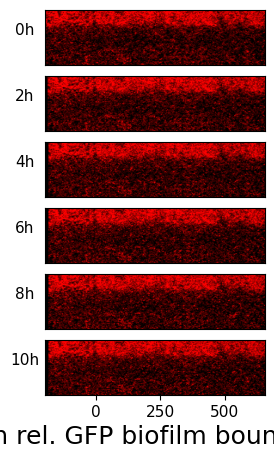

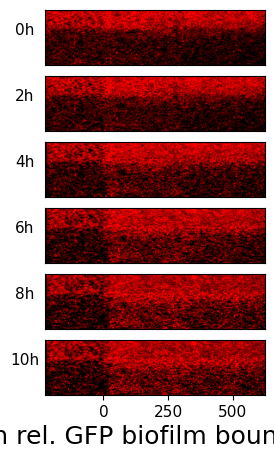

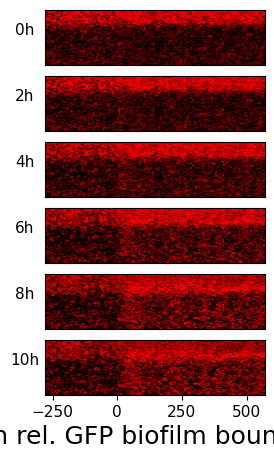

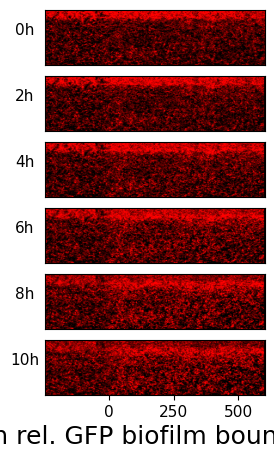

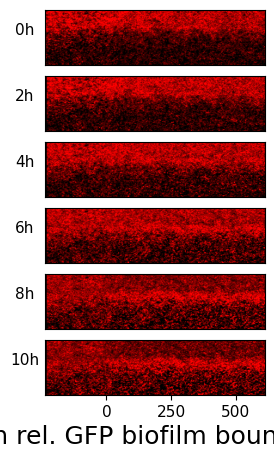

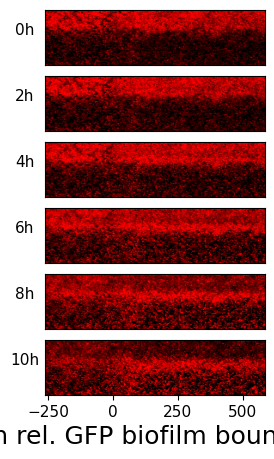

In [13]:
expts=['J4K5succ250_kanGrad']
reps=[3]
conds=['pbs','0x','1x','3x','10x','100x']
numFrames=6
xlims=[0,256]
ylims=[45,135]
numPixels=256
imSize=850

umPerPixel=imSize/numPixels

for cond in conds:
    tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin([cond]),:]
    img=readTiff(tiffDfSubset.filename.values[0])
    imgZsum=np.mean(img,axis=1)
    greenBoundary=fitX0(np.sum(imgZsum[0,:,:,1],axis=0))[-1]
    fig,ax=plt.subplots(numFrames,1,figsize=(5,5),gridspec_kw={'wspace':0.2})
    for frame in range(numFrames):
        redSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
        redSlice[:,:,[1,2]]=0
        imagesc(redSlice,ax=ax[frame],aspect=.25,extent=[umPerPixel*(-greenBoundary),umPerPixel*(numPixels-1-greenBoundary),0,850])
        if frame<numFrames-1:
            ax[frame].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
        else:
            ax[frame].set(yticklabels="",yticks=[],xlabel="position rel. GFP biofilm boundary (μm)")
            ax[frame].set_ylabel("position w.r.t.\nGFP boundary (μm)",fontsize=11)

            ax[frame].tick_params(axis='both', which='major', labelsize=11)
        ax[frame].set_ylabel(f"{2*frame}h",rotation=0,position=(.05,0.5),labelpad=15,fontsize=11)
        if cond=='0x':
            plt.savefig(os.path.join(savePath,'growthImageExampleRFP.pdf'))


array([0.9169827 , 0.91698012, 0.91697723, 0.91697399, 0.91697035,
       0.91696627, 0.91696169, 0.91695655, 0.91695078, 0.9169443 ,
       0.91693704, 0.91692889, 0.91691974, 0.91690947, 0.91689795,
       0.91688503, 0.91687052, 0.91685425, 0.91683598, 0.91681549,
       0.91679249, 0.91676668, 0.91673773, 0.91670523, 0.91666878,
       0.91662787, 0.91658197, 0.91653046, 0.91647268, 0.91640784,
       0.91633509, 0.91625348, 0.91616191, 0.91605918, 0.91594392,
       0.91581463, 0.9156696 , 0.9155069 , 0.91532441, 0.91511972,
       0.91489015, 0.9146327 , 0.91434398, 0.91402025, 0.91365728,
       0.91325035, 0.91279421, 0.91228297, 0.91171006, 0.91106814,
       0.91034903, 0.90954363, 0.90864179, 0.90763222, 0.9065024 ,
       0.9052384 , 0.90382482, 0.90224461, 0.90047892, 0.89850701,
       0.89630604, 0.893851  , 0.89111448, 0.88806666, 0.88467512,
       0.88090481, 0.87671803, 0.87207441, 0.86693107, 0.86124271,
       0.85496198, 0.84803983, 0.84042608, 0.8320701 , 0.82292

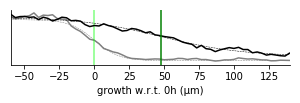

In [11]:
expts=['J4K5succ250_kanGrad']
reps=[1]
conds=['0x']
numFrames=6
ylims=[150,180]
#ylims=[15,45]
xlims=[60,120]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
fig,ax=plt.subplots(1,1,figsize=(5,1),gridspec_kw={'hspace':0.2})
for frame in [0,5]:
    greenSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
    greenSlice[:,:,[0,2]]=0
    x=umPerPixel*np.arange(*xlims)
    y=np.sum(greenSlice[:,:,1],axis=0)
    params=fitX0(x=x,y=y)
    
    
    greenSlice=imgZsum[frame,ylims[0]:ylims[1],:,:]
    greenSlice[:,:,[0,2]]=0
    x=umPerPixel*np.arange(256)
    y=np.sum(greenSlice[:,:,1],axis=0)
    x=x[y>0]
    y=y[y>0]
    params=fitX0(x=x,y=y)
    
    if frame==0:
        initX0=params[-1]
#    yFit=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1])
    yFit=logisticFunc(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1])
    ymin=np.min(y)
    ymax=np.max(y)
    y=(y-ymin)/(ymax-ymin)
    yFit=(yFit-ymin)/(ymax-ymin)
    if frame==0:

        sns.lineplot(x=x-initX0,y=y,ax=ax,color="grey")
        sns.lineplot(x=x-initX0,y=yFit,ax=ax,color="grey",linewidth=0.5)
        sns.despine()
        ax.axvline(x=params[-1]-initX0,color=[0,1,0],alpha=0.5)
        ax.lines[1].set_linestyle("--")
    else:
        sns.lineplot(x=x-initX0,y=y,ax=ax,color="black")
        sns.lineplot(x=x-initX0,y=yFit,ax=ax,color="black",linewidth=0.5)
        sns.despine()
        ax.axvline(x=params[-1]-initX0,color='green')
        ax.lines[4].set_linestyle("--")
    ax.set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(xlims)-initX0)
    ax.set(xlabel="growth w.r.t. 0h (μm)")
yFit

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or

,x,y,type,time,xShift
0,0.000000,0.688922,data,0h,-258.962699
1,3.320312,0.717197,data,0h,-255.642387
2,6.640625,0.745374,data,0h,-252.322074
3,9.960938,0.758459,data,0h,-249.001762
4,13.281250,0.784634,data,0h,-245.681449


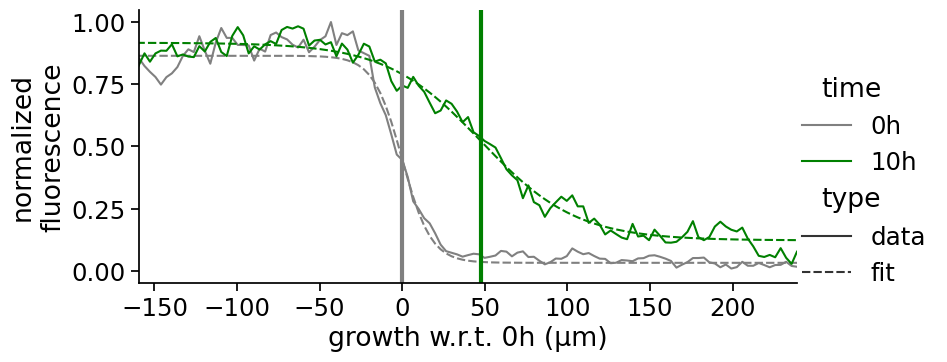

In [182]:
expts=['J4K5succ250_kanGrad']
reps=[1]
conds=['0x']
numFrames=6
ylims=[150,180]
#ylims=[15,45]
xlims=[30,150]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
linePlotDf=pd.DataFrame([])
for frame in [0,5]:
#     greenSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
#     greenSlice[:,:,[0,2]]=0
    greenSlice=imgZsum[frame,ylims[0]:ylims[1],:,:]
    greenSlice[:,:,[0,2]]=0

    params,newLinePlotDf=getLinePlotDf(greenSlice[:,:,1],time=f"{2*frame}h")
    linePlotDf=pd.concat([linePlotDf,newLinePlotDf]).reset_index(drop=True)
    if frame==0:
        initX0=params[-1]
linePlotDf['xShift']=linePlotDf['x']-initX0

with sns.plotting_context("notebook",font_scale=1.6):
    g=sns.relplot(kind='line',x='xShift',y='y',data=linePlotDf,hue='time',style='type',palette=['grey','green'],aspect=2,height=4)
    g.ax.set_xlabel("growth w.r.t. 0h (μm)")
    g.ax.set_ylabel("normalized\nfluorescence")
    g.ax.set_xlim(umPerPixel*np.asarray(xlims)-initX0)
    g.ax.axvline(x=params[-1]-initX0,color='green',lw=3)
    g.ax.axvline(x=0,color='grey',lw=3)
    g.savefig(os.path.join(savePath,'growthLogisticFitExample.pdf'))

# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

linePlotDf.head()
# sns.lineplot(x=x-initX0,y=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1]),ax=ax[frame*2+1],color="green",alpha=0.5)
# sns.despine()
# ax[frame*2+1].axvline(x=params[-1]-initX0,color='green')
# ax[frame*2+1].lines[1].set_linestyle("--")
# ax[frame*2].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
# ax[frame*2].set_ylabel(f"{2*frame}h",rotation=0,position=(0,-.5),labelpad=20)
# ax[frame*2+1].set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(xlims)-initX0)
# if frame!=numFrames-1:
#     ax[frame*2+1].set(xticklabels="")
# else:
#     ax[frame*2+1].set(xlabel="shift from 0h (μm)")

In [40]:
linePlotDf

,x,y,type,time,xShift
0,0.000000,0.688922,data,0h,-258.962699
1,3.320312,0.717197,data,0h,-255.642387
2,6.640625,0.745374,data,0h,-252.322074
3,9.960938,0.758459,data,0h,-249.001762
4,13.281250,0.784634,data,0h,-245.681449
5,16.601562,0.819873,data,0h,-242.361137
6,19.921875,0.833031,data,0h,-239.040824
7,23.242188,0.808048,data,0h,-235.720512
8,26.562500,0.796119,data,0h,-232.400199
9,29.882812,0.781400,data,0h,-229.079887


,x,y,type,time,xShift
0,0.000000,0.649633,data,0h,-236.495517
1,3.320312,0.629058,data,0h,-233.175204
2,6.640625,0.754789,data,0h,-229.854892
3,9.960938,0.866081,data,0h,-226.534579
4,13.281250,0.737470,data,0h,-223.214267


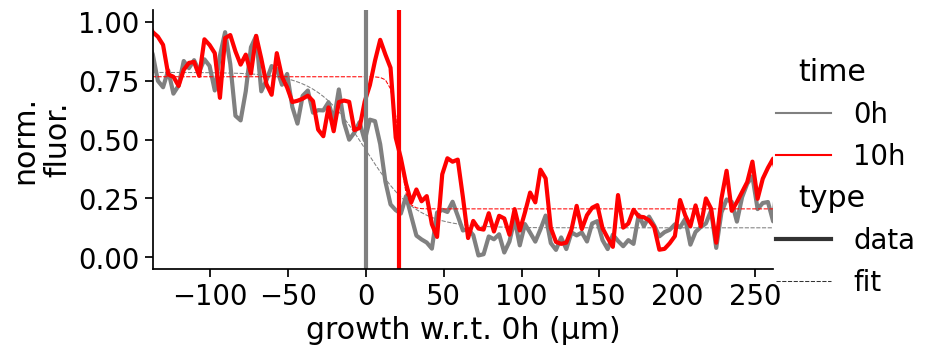

In [14]:
expts=['J4K5succ250_kanGrad']
reps=[3]
conds=['0x']
numFrames=6
xlims=[175,200]
xlims=[15,40]
ylims=[30,150]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
linePlotDf=pd.DataFrame([])
for frame in [0,5]:
    redSlice=imgZsum[frame,:,xlims[0]:xlims[1],:]
    redSlice[:,:,[1,2]]=0

    params,newLinePlotDf=getLinePlotDf(redSlice[:,:,0].T,time=f"{2*frame}h")
    linePlotDf=pd.concat([linePlotDf,newLinePlotDf]).reset_index(drop=True)
    if frame==0:
        initX0=params[-1]
linePlotDf['xShift']=linePlotDf['x']-initX0

with sns.plotting_context("notebook",font_scale=1.8):
    g=sns.relplot(kind='line',x='xShift',y='y',data=linePlotDf,hue='time',size='type',style='type',palette=['grey','red'],aspect=2,height=4)
    g.ax.set_xlabel("growth w.r.t. 0h (μm)")
    g.ax.set_ylabel("norm.\nfluor.")
    g.ax.set_xlim(umPerPixel*np.asarray(ylims)-initX0)
    g.ax.axvline(x=params[-1]-initX0,color='red',lw=3)
    g.ax.axvline(x=0,color='grey',lw=3)
    g.savefig(os.path.join(savePath,'growthLogisticFitExampleRFP.pdf'))

# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)

linePlotDf.head()
# sns.lineplot(x=x-initX0,y=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1]),ax=ax[frame*2+1],color="green",alpha=0.5)
# sns.despine()
# ax[frame*2+1].axvline(x=params[-1]-initX0,color='green')
# ax[frame*2+1].lines[1].set_linestyle("--")
# ax[frame*2].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
# ax[frame*2].set_ylabel(f"{2*frame}h",rotation=0,position=(0,-.5),labelpad=20)
# ax[frame*2+1].set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(xlims)-initX0)
# if frame!=numFrames-1:
#     ax[frame*2+1].set(xticklabels="")
# else:
#     ax[frame*2+1].set(xlabel="shift from 0h (μm)")

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for 

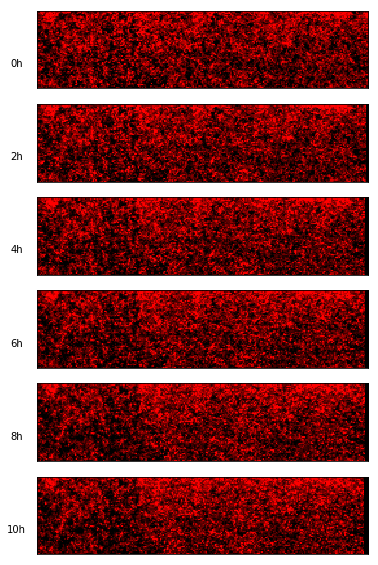

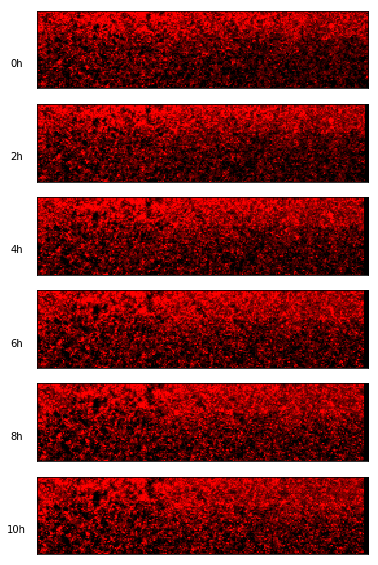

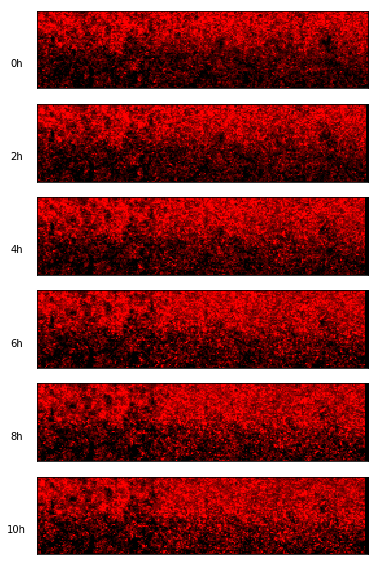

In [6]:
expts=['J4K5succ250_ampGrad']
reps=[1,2,3]
conds=['0x']
numFrames=6
xlims=[0,256]
ylims=[75,135]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
for filename in tiffDfSubset.filename:
    img=readTiff(filename)
    imgZsum=np.mean(img,axis=1)
    imgZsum.shape
    fig,ax=plt.subplots(numFrames,1,figsize=(10,10),gridspec_kw={'hspace':0.2})
    for frame in range(numFrames):
        redSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
        redSlice[:,:,[1,2]]=0
        imagesc(redSlice,ax=ax[frame],aspect=1)

        ax[frame].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
        ax[frame].set_ylabel(f"{2*frame}h",rotation=0,position=(0,.25),labelpad=20)


C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vm

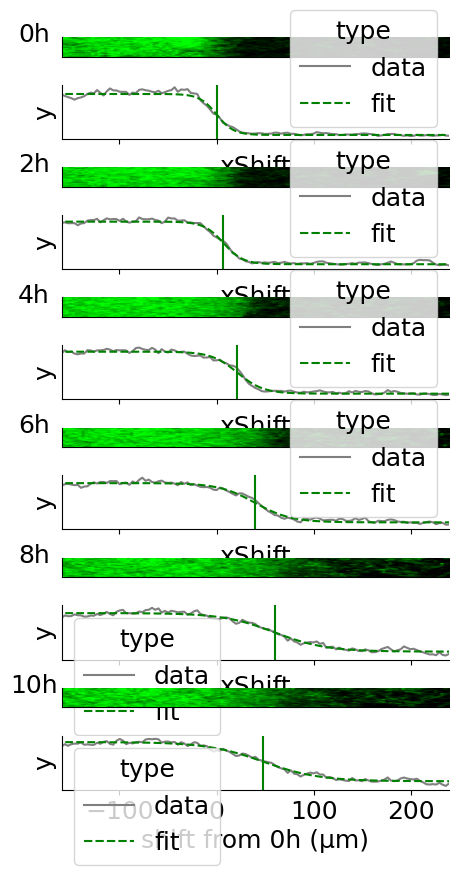

In [16]:

expts=['J4K5succ250_kanGrad']
reps=[1]
conds=['0x']
numFrames=6
ylims=[150,180]
#ylims=[15,45]
xlims=[30,150]
#xlims=[0,255]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
fig,ax=plt.subplots(numFrames*2,1,figsize=(5,10),gridspec_kw={'hspace':0.2})
for frame in range(numFrames):
#     greenSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
#     greenSlice[:,:,[0,2]]=0
#     imagesc(greenSlice,ax=ax[frame*2],aspect=.2)
#     x=umPerPixel*np.arange(*xlims)
#     y=np.sum(greenSlice[:,:,1],axis=0)
#     params=fitX0(x=x,y=y)
    greenSlice=imgZsum[frame,ylims[0]:ylims[1],:,:]
    greenSlice[:,:,[0,2]]=0
    imagesc(greenSlice[:,xlims[0]:xlims[1],:],ax=ax[frame*2],aspect=.2)

    params,linePlotDf=getLinePlotDf(greenSlice[:,:,1],time=f"{2*frame}h")
    if frame==0:
        initX0=params[-1]
    linePlotDf['xShift']=linePlotDf['x']-initX0

#     sns.lineplot(x=x-initX0,y=y,ax=ax[frame*2+1],color="black")
#    sns.lineplot(x=x-initX0,y=logisticFunc(x=x,a=params[0],c=params[1],x0=params[2]),ax=ax[frame*2+1],color="green",alpha=0.5)
#     sns.lineplot(x=x-initX0,y=logisticFunc2(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1]),ax=ax[frame*2+1],color="green",alpha=0.5)
    sns.lineplot(x='xShift',y='y',data=linePlotDf.reset_index(drop=True),hue='type',style='type',palette=['grey','green'],ax=ax[frame*2+1])
    sns.despine()
    ax[frame*2+1].axvline(x=params[-1]-initX0,color='green')
    ax[frame*2+1].lines[1].set_linestyle("--")
    ax[frame*2].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
    ax[frame*2].set_ylabel(f"{2*frame}h",rotation=0,position=(0,-.5),labelpad=20)
    ax[frame*2+1].set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(xlims)-initX0)
    if frame!=numFrames-1:
        ax[frame*2+1].set(xticklabels="")
    else:
        ax[frame*2+1].set(xlabel="shift from 0h (μm)")

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vm

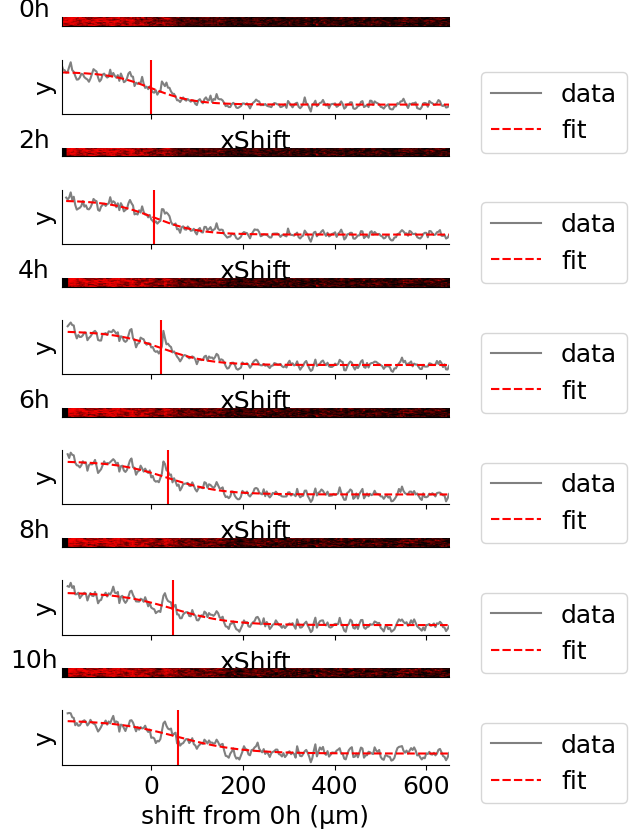

In [17]:
def fitX0(y,x=None,bounds=None):
    if x is None:
        x=range(len(y))
    if bounds is None:
        bounds=([0,0,0,min(x)],[np.max(y),max(x)-min(x),np.max(y),max(x)])
    params,_=curve_fit(f=logisticFunc,
          xdata=x,ydata=y,
          method='trf',bounds=bounds,loss='soft_l1',max_nfev=1e5)
    return params

def getLinePlotDf(imgSlice,time,xlims=None,umPerPixel=850/256):
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
#    yFit=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1])
    yFit=logisticFunc(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1])
    df1=pd.DataFrame({'x':x,'y':(y-ymin)/(ymax-ymin)})
    df1['type']='data'
    df2=pd.DataFrame({'x':x,'y':(yFit-ymin)/(ymax-ymin)})
    df2['type']='fit'
    df=pd.concat([df1,df2])
    df['time']=time
    return params,df

expts=['J4K5succ250_ampGrad']
reps=[1]
conds=['0x']
numFrames=6
xlims=[22, 51]
# xlims=[17, 46]
#ylims=[15,45]
ylims=[60,120]
ylims=[15,120]
ylims=[0,255]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
fig,ax=plt.subplots(numFrames*2,1,figsize=(5,10),gridspec_kw={'hspace':0.2})
for frame in range(numFrames):

    redSlice=imgZsum[frame,:,xlims[0]:xlims[1],:]
    redSlice[:,:,[1,2]]=0
    imagesc(np.transpose(redSlice[ylims[0]:ylims[1],:,:],(1,0,2)),ax=ax[frame*2],aspect=.2)

    params,linePlotDf=getLinePlotDf(redSlice[:,:,0].T,time=f"{2*frame}h")
    if frame==0:
        initX0=params[-1]
    linePlotDf['xShift']=linePlotDf['x']-initX0

#     sns.lineplot(x=x-initX0,y=y,ax=ax[frame*2+1],color="black")
#    sns.lineplot(x=x-initX0,y=logisticFunc(x=x,a=params[0],c=params[1],x0=params[2]),ax=ax[frame*2+1],color="green",alpha=0.5)
#     sns.lineplot(x=x-initX0,y=logisticFunc2(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1]),ax=ax[frame*2+1],color="green",alpha=0.5)
    sns.lineplot(x='xShift',y='y',data=linePlotDf.reset_index(drop=True),hue='type',style='type',palette=['grey','red'],ax=ax[frame*2+1])
    sns.despine()
    ax[frame*2+1].axvline(x=params[-1]-initX0,color='red')
    ax[frame*2+1].lines[1].set_linestyle("--")
    ax[frame*2+1].legend(bbox_to_anchor=(1.05, 1))
    ax[frame*2].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
    ax[frame*2].set_ylabel(f"{2*frame}h",rotation=0,position=(0,-.5),labelpad=20)
    ax[frame*2+1].set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(ylims)-initX0)
    if frame!=numFrames-1:
        ax[frame*2+1].set(xticklabels="")
    else:
        ax[frame*2+1].set(xlabel="shift from 0h (μm)")

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:16: RuntimeWarning: invalid value encountered in divide
  return ax.imshow((img-vm

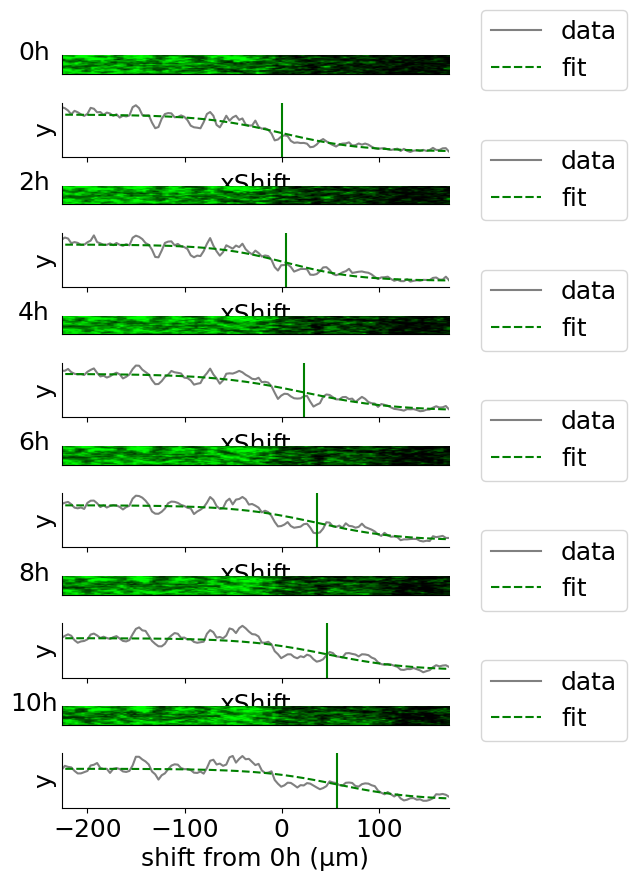

In [18]:
def fitX0(y,x=None,bounds=None):
    if x is None:
        x=range(len(y))
    if bounds is None:
        bounds=([0,0,0,min(x)],[np.max(y),max(x)-min(x),np.max(y),max(x)])
    params,_=curve_fit(f=logisticFunc,
          xdata=x,ydata=y,
          method='trf',bounds=bounds,loss='soft_l1',max_nfev=1e5)
    return params

def getLinePlotDf(imgSlice,time,xlims=None,umPerPixel=850/256):
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
#    yFit=logisticFunc(x=x,a=params[0],c=params[1],x0=params[-1])
    yFit=logisticFunc(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1])
    df1=pd.DataFrame({'x':x,'y':(y-ymin)/(ymax-ymin)})
    df1['type']='data'
    df2=pd.DataFrame({'x':x,'y':(yFit-ymin)/(ymax-ymin)})
    df2['type']='fit'
    df=pd.concat([df1,df2])
    df['time']=time
    return params,df



expts=['J4K5succ250_ampGrad']
reps=[3]
conds=['1x']
numFrames=6
ylims=[47,76]
#ylims=[15,45]
xlims=[0,255]
xlims=[60,120]
xlims=[30,150]
umPerPixel=850/256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
imgZsum=np.mean(img,axis=1)
imgZsum.shape
fig,ax=plt.subplots(numFrames*2,1,figsize=(5,10),gridspec_kw={'hspace':0.2})
prevX0=None
for frame in range(numFrames):
#     greenSlice=imgZsum[frame,ylims[0]:ylims[1],xlims[0]:xlims[1],:]
#     greenSlice[:,:,[0,2]]=0
#     imagesc(greenSlice,ax=ax[frame*2],aspect=.2)
#     x=umPerPixel*np.arange(*xlims)
#     y=np.sum(greenSlice[:,:,1],axis=0)
#     params=fitX0(x=x,y=y)
    greenSlice=imgZsum[frame,ylims[0]:ylims[1],:,:]
    greenSlice[:,:,[0,2]]=0
    imagesc(greenSlice[:,xlims[0]:xlims[1],:],ax=ax[frame*2],aspect=.2)
    if prevX0 is not None:
        lim1=int(np.round(prevX0/umPerPixel-30))
        lim2=int(np.round(prevX0/umPerPixel+30))
        params,linePlotDf=getLinePlotDf(greenSlice[:,:,1],time=f"{2*frame}h",xlims=[lim1,lim2])
    else:
        params,linePlotDf=getLinePlotDf(greenSlice[:,:,1],time=f"{2*frame}h")
    if frame==0:
        initX0=params[-1]
#     prevX0=params[-1]
    linePlotDf['xShift']=linePlotDf['x']-initX0

#     sns.lineplot(x=x-initX0,y=y,ax=ax[frame*2+1],color="black")
#    sns.lineplot(x=x-initX0,y=logisticFunc(x=x,a=params[0],c=params[1],x0=params[2]),ax=ax[frame*2+1],color="green",alpha=0.5)
#     sns.lineplot(x=x-initX0,y=logisticFunc2(x=x,a=params[0],b=params[1],c=params[2],x0=params[-1]),ax=ax[frame*2+1],color="green",alpha=0.5)
    sns.lineplot(x='xShift',y='y',data=linePlotDf.reset_index(drop=True),hue='type',style='type',palette=['grey','green'],ax=ax[frame*2+1])
    sns.despine()
    ax[frame*2+1].axvline(x=params[-1]-initX0,color='green')
    ax[frame*2+1].lines[1].set_linestyle("--")
    ax[frame*2+1].legend(bbox_to_anchor=(1.05, 1))
    ax[frame*2].set(xticklabels="",yticklabels="",xticks=[],yticks=[])
    ax[frame*2].set_ylabel(f"{2*frame}h",rotation=0,position=(0,-.5),labelpad=20)
    ax[frame*2+1].set(yticklabels="",yticks=[],xlim=umPerPixel*np.asarray(xlims)-initX0)
    if frame!=numFrames-1:
        ax[frame*2+1].set(xticklabels="")
    else:
        ax[frame*2+1].set(xlabel="shift from 0h (μm)")

In [72]:
df[(df.cond=='1x')&(df['time (h)']==8)&(df['position (μm)']==-100)]

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL)
132,J4K5succ250_ampGrad,1x,1,8,-100,50-79,44-73,311.413657,306.258839,7.728531,10.403892,0.1,NaN
168,J4K5succ250_ampGrad,1x,2,8,-100,44-73,39-68,317.523820,274.021550,21.175624,6.213872,0.1,NaN
204,J4K5succ250_ampGrad,1x,3,8,-100,53-82,47-76,368.048662,303.819145,47.730739,9.252167,0.1,NaN


In [42]:
df[(df.cond=='0x')&(df['time (h)']==8)&(df['position (μm)']==-150)]

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL)
52,J4K5succ250_ampGrad,0x,1,8,-150,22-51,14-43,295.916893,239.203922,22.588234,31.471814,0.0,NaN
130,J4K5succ250_ampGrad,0x,2,8,-150,42-71,27-56,376.532566,299.856462,18.737174,10.835230,0.0,NaN
208,J4K5succ250_ampGrad,0x,3,8,-150,31-60,44-73,321.563696,356.747930,11.865475,13.142011,0.0,NaN


In [56]:
expts=['J4K5succ250_kanGrad','J4K5succ250_ampGrad']
# expts=['J4K5succ250_ampGrad']
# expts=['J4K5succ250_kanGrad']
expts=['J4K5succ250_ampGrad']

reps=[1,2,3]
conds=['0x','1x','3x','10x','30x','100x']

numFrames=6
umPerPixel=850/256

slicePosList=np.arange(-100,500,100) #positions in microns to take slice relative to init X0 boundary
# slicePosList=np.asarray([-100,0,400]) #positions in microns to take slice relative to init X0 boundary
sliceWidth=100 #width of each slice to take in microns, 100um~30pixels in 256x256 images

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
df=pd.DataFrame([])
for row in tiffDfSubset.iterrows():
    img=readTiff(row[1].filename)
    expt=row[1].expt
    cond=row[1].cond
    rep=row[1].rep
    imgZsum=np.mean(img,axis=1)

    frameNum=0
    channel=0

    redInitX0=fitX0(np.sum(imgZsum[0,:,:,0],axis=1))[-1]
    greenInitX0=fitX0(np.sum(imgZsum[0,:,:,1],axis=0))[-1]
    greenSlicePosListInPixels=list(zip(np.ceil(redInitX0+(slicePosList-sliceWidth/2)/umPerPixel).astype(int),
                                       np.floor(redInitX0+(slicePosList+sliceWidth/2)/umPerPixel).astype(int)))
    redSlicePosListInPixels=list(zip(np.ceil(greenInitX0+(slicePosList-sliceWidth/2)/umPerPixel).astype(int),
                                     np.floor(greenInitX0+(slicePosList+sliceWidth/2)/umPerPixel).astype(int)))
#     print(rep,redSlicePosListInPixels)
    for frameNum in range(numFrames):
        if frameNum==0:
            newDf=pd.DataFrame({'expt':expt,
                                'cond':cond,
                                'rep':rep,
                                'time (h)':2*frameNum,
                                'position (μm)':slicePosList,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in redSlicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in greenSlicePosListInPixels],
                                'greenX0':[fitSlice(imgZsum,ylim1,ylim2,frameNum,channel=1)[-1] for ylim1,ylim2 in greenSlicePosListInPixels],
                                'redX0':[fitSlice(imgZsum,xlim1,xlim2,frameNum,channel=0)[-1] for xlim1,xlim2 in redSlicePosListInPixels]})
            initGreenX0=newDf.greenX0
            initRedX0=newDf.redX0

            newDf['GFP shift (μm)']=0
            newDf['RFP shift (μm)']=0
            df=pd.concat([df,newDf])
        else:
#             greenLims1=int(np.round(prevGreenX0s/umPerPixel-30))
#             greenLims2=int(np.round(prevGreenX0s/umPerPixel+30))
#             redLims1=int(np.round(prevRedX0s/umPerPixel-30))
#             redLims2=int(np.round(prevRedX0s/umPerPixel+30))
            newDf=pd.DataFrame({'expt':expt,
                                'cond':cond,
                                'rep':rep,
                                'time (h)':2*frameNum,
                                'position (μm)':slicePosList,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in redSlicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in greenSlicePosListInPixels],
                                'greenX0':[fitSlice(imgZsum,ylim1,ylim2,frameNum,channel=1)[-1] for ylim1,ylim2 in greenSlicePosListInPixels],
                                'redX0':[fitSlice(imgZsum,xlim1,xlim2,frameNum,channel=0)[-1] for xlim1,xlim2 in redSlicePosListInPixels]})
            newDf['GFP shift (μm)']=newDf.greenX0-initGreenX0
            newDf['RFP shift (μm)']=newDf.redX0-initRedX0
            df=pd.concat([df,newDf])
df=df.reset_index(drop=True)
ampCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in df.cond.unique()])],
                     [0]+list(np.power(10,np.arange(-1,1.5,.5)))))
kanCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in df.cond.unique()])],
                     [0]+list(0.5*np.power(10,np.arange(-1,1.5,.5)))))
df['[Ampicillin] (mg/mL)']=df.cond.map(ampCondDict)
df['[Kanamycin] (mg/mL)']=df.cond.map(kanCondDict)
df.loc[df.expt.str.contains('kanGrad'),'[Ampicillin] (mg/mL)']=np.nan
df.loc[df.expt.str.contains('ampGrad'),'[Kanamycin] (mg/mL)']=np.nan
df.head()

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL)
0,J4K5succ250_ampGrad,0x,1,0,-100,37-66,29-58,272.981328,229.596404,0.0,0.0,0.0,NaN
1,J4K5succ250_ampGrad,0x,1,0,0,67-96,59-88,272.754590,250.516855,0.0,0.0,0.0,NaN
2,J4K5succ250_ampGrad,0x,1,0,100,97-126,89-118,271.419604,246.894661,0.0,0.0,0.0,NaN
3,J4K5succ250_ampGrad,0x,1,0,200,127-157,119-148,271.323591,235.737449,0.0,0.0,0.0,NaN
4,J4K5succ250_ampGrad,0x,1,0,300,158-187,149-179,272.719314,247.359082,0.0,0.0,0.0,NaN


In [56]:

expts=['J4K5succ250_kanGrad']
expts=['J4K5succ250_ampGrad']
expts=['J4K5succ250_kanGrad']
expts=['J4K5succ250_kanGrad','J4K5succ250_ampGrad']

reps=[1,2,3]
conds=['0x','1x','3x','10x','30x','100x']
# conds=['0x','1x','3x','10x','30x','100x','300x','1000x']

numFrames=6
umPerPixel=850/256

slicePosList=np.arange(-150,500,50) #positions in microns to take slice relative to init X0 boundary
# slicePosList=np.asarray([-100,0,400]) #positions in microns to take slice relative to init X0 boundary
sliceWidth=80 #width of each slice to take in microns, 80um~24pixels in 256x256 images
halfSliceLengthInPixels=256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
df=pd.DataFrame([])
for row in tiffDfSubset.iterrows():
    img=readTiff(row[1].filename)
    expt=row[1].expt
    cond=row[1].cond
    rep=row[1].rep
    imgZsum=np.mean(img,axis=1)

    frameNum=0
    channel=0

    redInitX0=fitX0(np.sum(imgZsum[0,:,:,0],axis=1))[-1]
    greenInitX0=fitX0(np.sum(imgZsum[0,:,:,1],axis=0))[-1]
    greenSlicePosListInPixels=list(zip(np.ceil(redInitX0+(slicePosList-sliceWidth/2)/umPerPixel).astype(int),
                                       np.floor(redInitX0+(slicePosList+sliceWidth/2)/umPerPixel).astype(int)))
    redSlicePosListInPixels=list(zip(np.ceil(greenInitX0+(slicePosList-sliceWidth/2)/umPerPixel).astype(int),
                                     np.floor(greenInitX0+(slicePosList+sliceWidth/2)/umPerPixel).astype(int)))
#     print(rep,redSlicePosListInPixels)
    prevGreenX0=None
    prevRedX0=None
    for frameNum in range(numFrames):
        if frameNum==0:
            newDf=pd.DataFrame({'expt':expt,
                                'cond':cond,
                                'rep':rep,
                                'time (h)':2*frameNum,
                                'position (μm)':slicePosList,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in redSlicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in greenSlicePosListInPixels],
                                'greenX0':[fitSlice(imgZsum,ylim1,ylim2,frameNum,channel=1)[-1] for ylim1,ylim2 in greenSlicePosListInPixels],
                                'redX0':[fitSlice(imgZsum,xlim1,xlim2,frameNum,channel=0)[-1] for xlim1,xlim2 in redSlicePosListInPixels]})
            initGreenX0=newDf.greenX0
            initRedX0=newDf.redX0
            newDf['GFP shift (μm)']=0
            newDf['RFP shift (μm)']=0
            df=pd.concat([df,newDf])
        else:
            newDf=pd.DataFrame({'expt':expt,
                                'cond':cond,
                                'rep':rep,
                                'time (h)':2*frameNum,
                                'position (μm)':slicePosList,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in redSlicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in greenSlicePosListInPixels],
                                'greenX0':[fitSlice(imgZsum,ylim1,ylim2,frameNum,channel=1,xlims=[int(np.round(prevX0/umPerPixel-halfSliceLengthInPixels)),int(np.round(prevX0/umPerPixel+halfSliceLengthInPixels))])[-1] for (ylim1,ylim2),prevX0 in zip(greenSlicePosListInPixels,prevGreenX0)],
                                'redX0':[fitSlice(imgZsum,xlim1,xlim2,frameNum,channel=0,xlims=[int(np.round(prevX0/umPerPixel-halfSliceLengthInPixels)),int(np.round(prevX0/umPerPixel+halfSliceLengthInPixels))])[-1] for (xlim1,xlim2),prevX0 in zip(redSlicePosListInPixels,prevRedX0)]})
            newDf['GFP shift (μm)']=newDf.greenX0-initGreenX0
            newDf['RFP shift (μm)']=newDf.redX0-initRedX0
            df=pd.concat([df,newDf])
        prevGreenX0=newDf.greenX0
        prevRedX0=newDf.redX0

df=df.reset_index(drop=True)
ampCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in df.cond.unique()])],
                     [0]+list(np.power(10,np.arange(-1,1.5,.5)))))
kanCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in df.cond.unique()])],
                     [0]+list(0.5*np.power(10,np.arange(-1,1.5,.5)))))
df['[Ampicillin] (mg/mL)']=df.cond.map(ampCondDict)
df['[Kanamycin] (mg/mL)']=df.cond.map(kanCondDict)
df.loc[df.expt.str.contains('kanGrad'),'[Ampicillin] (mg/mL)']=np.nan
df.loc[df.expt.str.contains('ampGrad'),'[Kanamycin] (mg/mL)']=np.nan
df.head()

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:33: RuntimeWarning: overflow encountered in exp
  return a/(1+np.exp((x-x0)/b))+c


KeyboardInterrupt: 

In [128]:
df.to_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/df.csv',index=False)

In [4]:
df=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/df.csv')
df.head()

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL)
0,J4K5succ250_ampGrad,0x,1,0,-150,25-48,17-40,272.399955,203.942488,0.0,0.0,0.0,NaN
1,J4K5succ250_ampGrad,0x,1,0,-100,40-63,32-55,274.871785,233.285372,0.0,0.0,0.0,NaN
2,J4K5succ250_ampGrad,0x,1,0,-50,55-78,47-70,272.168635,233.673312,0.0,0.0,0.0,NaN
3,J4K5succ250_ampGrad,0x,1,0,0,70-93,62-85,271.855968,256.421133,0.0,0.0,0.0,NaN
4,J4K5succ250_ampGrad,0x,1,0,50,85-108,77-100,273.929695,246.545603,0.0,0.0,0.0,NaN


In [31]:
timetotest=8

outerDf=df.loc[(df.cond=='0x')&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerDf.mean(),
           outerDf.std()]))
print(ttest_1samp(outerDf['GFP shift (μm)'],0))
print(ttest_1samp(outerDf['RFP shift (μm)'],0))


innerDf=df.loc[(df.cond=='0x')&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerDf.mean(),
           innerDf.std()]))
print(ttest_ind(innerDf['GFP shift (μm)'],outerDf['GFP shift (μm)']))
print(ttest_ind(innerDf['RFP shift (μm)'],outerDf['RFP shift (μm)']))

innerAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerAmp1Df.mean(),
           innerAmp1Df.std()]))

outerAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp1Df.mean(),
           outerAmp1Df.std()]))

boundaryAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryAmp1Df.mean(),
           boundaryAmp1Df.std()]))

print(ttest_ind(outerAmp1Df['RFP shift (μm)'],outerDf['RFP shift (μm)']))
print(ttest_ind(outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(ttest_ind(innerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(f_oneway(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(tukey_hsd(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))

tukey_hsd(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']).pvalue

GFP shift (μm)    39.059666
RFP shift (μm)    34.156466
GFP shift (μm)     4.789313
RFP shift (μm)     7.753993
dtype: float64
TtestResult(statistic=14.125892370501305, pvalue=0.004974144678830547, df=2)
TtestResult(statistic=7.629712253669501, pvalue=0.01674809403191769, df=2)
GFP shift (μm)    17.005350
RFP shift (μm)    17.086080
GFP shift (μm)     4.315326
RFP shift (μm)     7.899531
dtype: float64
TtestResult(statistic=-5.925414614548588, pvalue=0.004064490221417573, df=4.0)
TtestResult(statistic=-2.6710871896937802, pvalue=0.0557428775636403, df=4.0)
GFP shift (μm)    10.873870
RFP shift (μm)     6.392999
GFP shift (μm)     6.619959
RFP shift (μm)     3.942484
dtype: float64
GFP shift (μm)    32.971293
RFP shift (μm)     2.659237
GFP shift (μm)     1.364838
RFP shift (μm)     9.088014
dtype: float64
GFP shift (μm)    23.244636
RFP shift (μm)    19.027810
GFP shift (μm)     5.115566
RFP shift (μm)     1.015976
dtype: float64
TtestResult(statistic=-4.566632259022937, pvalue=0.01028

array([[1.        , 0.71931537, 0.08004896],
       [0.71931537, 1.        , 0.03016608],
       [0.08004896, 0.03016608, 1.        ]])

In [55]:
outerDf=df.loc[(df.cond=='0x')&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerDf.mean(),
           outerDf.std()]).round(1))
print(ttest_1samp(outerDf['GFP shift (μm)'],0))
print(ttest_1samp(outerDf['RFP shift (μm)'],0))

boundaryDf=df.loc[(df.cond=='0x')&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryDf.mean(),
           boundaryDf.std()]).round(1))
print(ttest_1samp(boundaryDf['GFP shift (μm)'],0))
print(ttest_1samp(boundaryDf['RFP shift (μm)'],0))


innerDf=df.loc[(df.cond=='0x')&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerDf.mean(),
           innerDf.std()]).round(1))
print(ttest_ind(innerDf['GFP shift (μm)'],outerDf['GFP shift (μm)']))
print(ttest_ind(innerDf['RFP shift (μm)'],outerDf['RFP shift (μm)']))

print(ttest_ind(outerDf['RFP shift (μm)'],boundaryDf['RFP shift (μm)']))
print(f_oneway(innerDf['RFP shift (μm)'],boundaryDf['RFP shift (μm)'],outerDf['RFP shift (μm)']))
print(tukey_hsd(innerDf['RFP shift (μm)'],boundaryDf['RFP shift (μm)'],outerDf['RFP shift (μm)']))

GFP shift (μm)    40.9
RFP shift (μm)    37.5
GFP shift (μm)     3.9
RFP shift (μm)     6.2
dtype: float64
TtestResult(statistic=25.886493997009115, pvalue=1.6070107708572777e-06, df=5)
TtestResult(statistic=14.837191448211236, pvalue=2.515575311892605e-05, df=5)
GFP shift (μm)    19.8
RFP shift (μm)    37.9
GFP shift (μm)     1.9
RFP shift (μm)     6.5
dtype: float64
TtestResult(statistic=25.73685513545033, pvalue=1.6539682716970109e-06, df=5)
TtestResult(statistic=14.247124309585713, pvalue=3.0691116017990735e-05, df=5)
GFP shift (μm)    17.2
RFP shift (μm)    19.2
GFP shift (μm)     4.7
RFP shift (μm)     8.2
dtype: float64
TtestResult(statistic=-9.577270236140073, pvalue=2.3581839063822147e-06, df=10.0)
TtestResult(statistic=-4.359487963443712, pvalue=0.0014222910117545366, df=10.0)
TtestResult(statistic=-0.10027751297065426, pvalue=0.9221059405534049, df=10.0)
F_onewayResult(statistic=13.845382165102153, pvalue=0.0003919042423286191)
Tukey's HSD Pairwise Group Comparisons (95.0% C

In [50]:
innerAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerAmp1Df.mean(),
           innerAmp1Df.std()]).round(1))

outerAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp1Df.mean(),
           outerAmp1Df.std()]).round(1))

boundaryAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryAmp1Df.mean(),
           boundaryAmp1Df.std()]).round(1))

print(ttest_ind(outerAmp1Df['RFP shift (μm)'],outerDf['RFP shift (μm)']))
print(ttest_ind(outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(ttest_ind(innerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(f_oneway(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))
print(tukey_hsd(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']))

tukey_hsd(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']).pvalue

GFP shift (μm)    12.3
RFP shift (μm)     6.9
GFP shift (μm)     5.9
RFP shift (μm)     4.5
dtype: float64
GFP shift (μm)    38.6
RFP shift (μm)     4.0
GFP shift (μm)     7.1
RFP shift (μm)     8.8
dtype: float64
GFP shift (μm)    26.2
RFP shift (μm)    20.7
GFP shift (μm)     5.5
RFP shift (μm)     3.6
dtype: float64
TtestResult(statistic=-7.626632785466586, pvalue=1.785170988218198e-05, df=10.0)
TtestResult(statistic=-4.301698683017837, pvalue=0.0015572733926181726, df=10.0)
TtestResult(statistic=-5.849881331844516, pvalue=0.00016163523899870603, df=10.0)
F_onewayResult(statistic=12.952598555288416, pvalue=0.000539940332737269)
Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1)      2.882     0.696    -6.238    12.002
 (0 - 2)    -13.833     0.004   -22.953    -4.713
 (1 - 0)     -2.882     0.696   -12.002     6.238
 (1 - 2)    -16.715     0.001   -25.835    -7.595
 (2 - 0)     13.833     0.004     4.713    

array([[1.00000000e+00, 6.96203481e-01, 3.52734773e-03],
       [6.96203481e-01, 1.00000000e+00, 6.95825779e-04],
       [3.52734773e-03, 6.95825779e-04, 1.00000000e+00]])

In [52]:
innerAmp0p1Df=df.loc[(df['[Ampicillin] (mg/mL)']==0.1)&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerAmp0p1Df.mean(),
           innerAmp0p1Df.std()]).round(1))

outerAmp0p1Df=df.loc[(df['[Ampicillin] (mg/mL)']==0.1)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp0p1Df.mean(),
           outerAmp0p1Df.std()]).round(1))

boundaryAmp0p1Df=df.loc[(df['[Ampicillin] (mg/mL)']==0.1)&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryAmp0p1Df.mean(),
           boundaryAmp0p1Df.std()]).round(1))

innerAmp3Df=df.loc[(df['[Ampicillin] (mg/mL)']==np.sqrt(10))&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerAmp3Df.mean(),
           innerAmp3Df.std()]).round(1))

outerAmp3Df=df.loc[(df['[Ampicillin] (mg/mL)']==np.sqrt(10))&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp3Df.mean(),
           outerAmp3Df.std()]).round(1))

boundaryAmp3Df=df.loc[(df['[Ampicillin] (mg/mL)']==np.sqrt(10))&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryAmp3Df.mean(),
           boundaryAmp3Df.std()]).round(1))
#######################################################

innerAmp10Df=df.loc[(df['[Ampicillin] (mg/mL)']==10)&
    (df['position (μm)']==-150)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([innerAmp10Df.mean(),
           innerAmp10Df.std()]).round(1))

outerAmp10Df=df.loc[(df['[Ampicillin] (mg/mL)']==10)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp10Df.mean(),
           outerAmp10Df.std()]).round(1))

boundaryAmp10Df=df.loc[(df['[Ampicillin] (mg/mL)']==10)&
    (df['position (μm)']==0)&
    (df['expt']=='J4K5succ250_ampGrad')&
  ((df['time (h)']==8)|(df['time (h)']==10)),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([boundaryAmp10Df.mean(),
           boundaryAmp10Df.std()]).round(1))

print(f_oneway(outerAmp1Df['RFP shift (μm)'],outerDf['RFP shift (μm)'],outerAmp10Df['RFP shift (μm)']))
print(tukey_hsd(outerAmp1Df['RFP shift (μm)'],outerDf['RFP shift (μm)'],outerAmp10Df['RFP shift (μm)']))
print(tukey_hsd(outerAmp1Df['RFP shift (μm)'],outerDf['RFP shift (μm)'],outerAmp10Df['RFP shift (μm)']).pvalue)

print(f_oneway(outerAmp3Df['GFP shift (μm)'],outerDf['GFP shift (μm)'],outerAmp10Df['GFP shift (μm)']))
print(tukey_hsd(outerAmp3Df['GFP shift (μm)'],outerDf['GFP shift (μm)'],outerAmp10Df['GFP shift (μm)']))
print(tukey_hsd(outerAmp3Df['GFP shift (μm)'],outerDf['GFP shift (μm)'],outerAmp10Df['GFP shift (μm)']).pvalue)
print(ttest_ind(boundaryAmp0p1Df['GFP shift (μm)'],boundaryDf['GFP shift (μm)']))


GFP shift (μm)    30.3
RFP shift (μm)     6.0
GFP shift (μm)    11.6
RFP shift (μm)     6.6
dtype: float64
GFP shift (μm)    43.6
RFP shift (μm)    24.4
GFP shift (μm)    13.2
RFP shift (μm)     9.7
dtype: float64
GFP shift (μm)    29.8
RFP shift (μm)    28.0
GFP shift (μm)     5.1
RFP shift (μm)    10.3
dtype: float64
GFP shift (μm)     5.1
RFP shift (μm)    16.5
GFP shift (μm)     4.2
RFP shift (μm)    11.7
dtype: float64
GFP shift (μm)    38.0
RFP shift (μm)    -1.1
GFP shift (μm)    14.3
RFP shift (μm)     6.6
dtype: float64
GFP shift (μm)    14.1
RFP shift (μm)     8.0
GFP shift (μm)     8.4
RFP shift (μm)     8.4
dtype: float64
GFP shift (μm)    5.2
RFP shift (μm)    2.2
GFP shift (μm)    8.8
RFP shift (μm)    8.1
dtype: float64
GFP shift (μm)    1.8
RFP shift (μm)    0.2
GFP shift (μm)    2.7
RFP shift (μm)    2.6
dtype: float64
GFP shift (μm)    2.8
RFP shift (μm)    1.0
GFP shift (μm)    1.9
RFP shift (μm)    4.6
dtype: float64
F_onewayResult(statistic=61.91696141323905, pvalu

(0.0, 10.0)

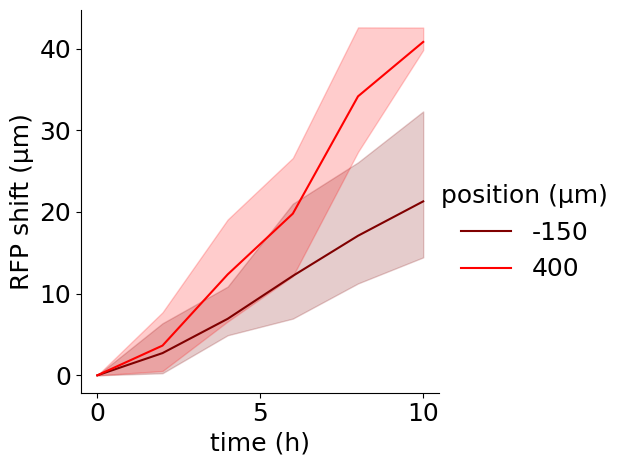

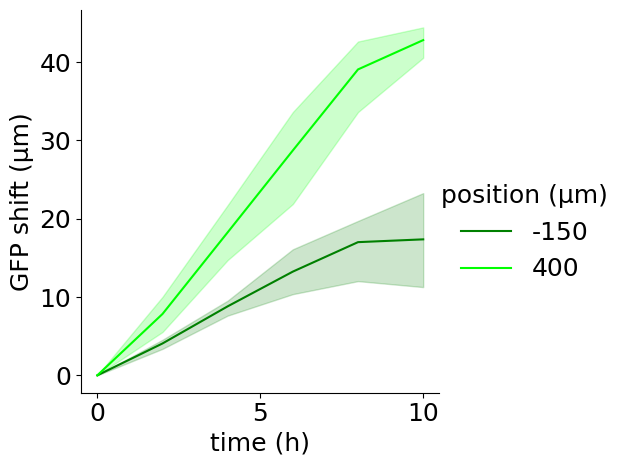

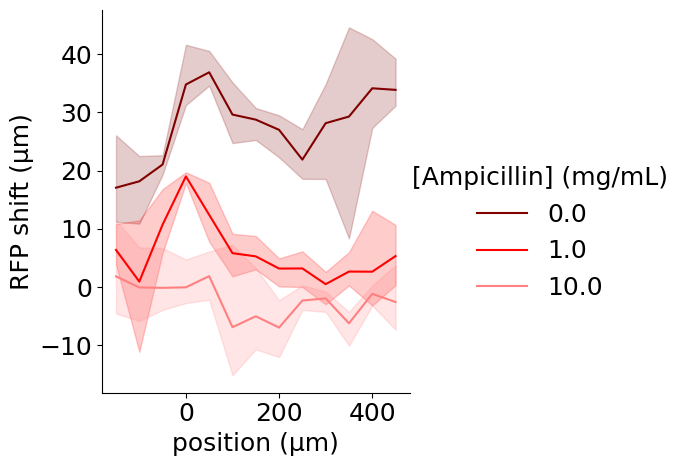

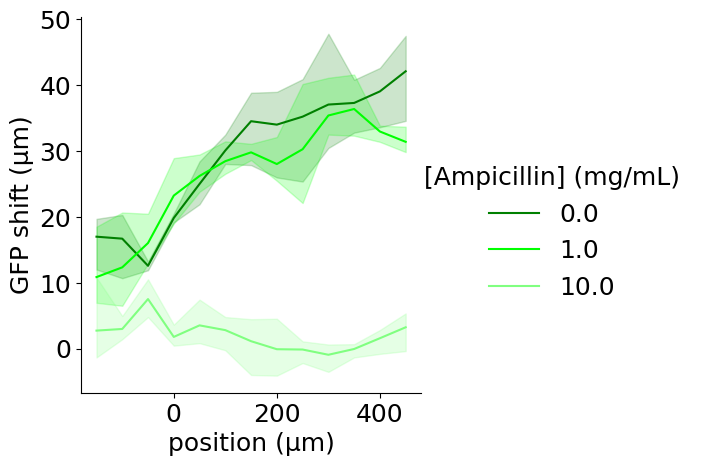

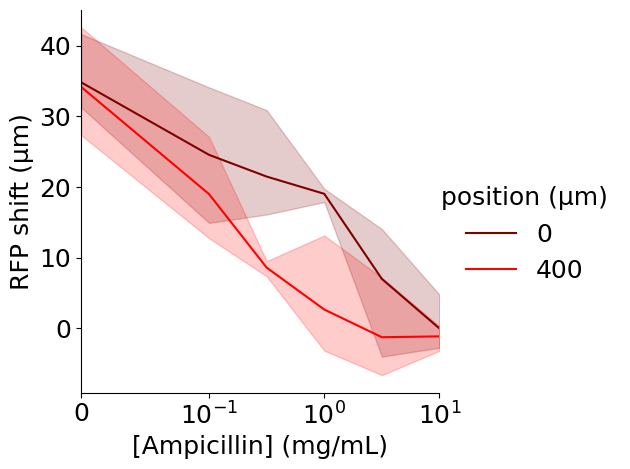

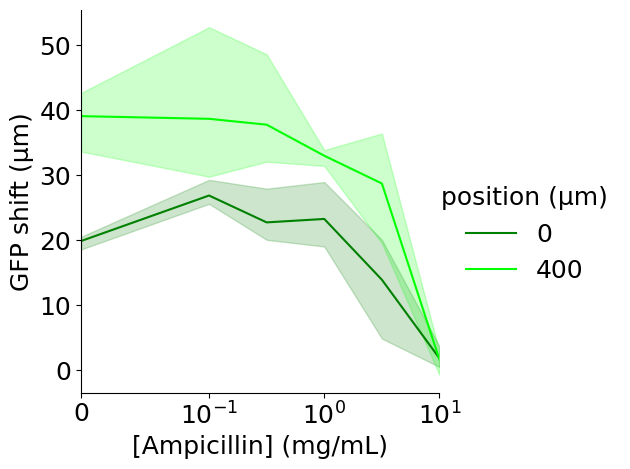

In [149]:
plotPositions=[-150,400]
plotConds=['0x','10x','100x']
expt='J4K5succ250_ampGrad'

gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]

# sns.relplot(x='time',y='redShift',hue='slicePos',data=df[(df.slicePos.isin([-150,0,400]))&(df.expt.isin(['J4K5succ250_ampGrad']))],kind='line')
# df.loc[(df.slicePos.isin([-150,0,400]))&(df.expt.isin(['J4K5succ250_ampGrad'])),['rep','time','slicePos','greenShift']].set_index(['slicePos','time','rep']).unstack()
g=sns.relplot(kind='line',x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
            data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin([expt]))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))
#g.set(ylim=(0, 50))
sns.relplot(kind='line',x='time (h)',y='GFP shift (μm)',hue='position (μm)',palette=gPalette[:len(plotPositions)],
            data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin([expt]))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))

# sns.relplot(kind='line',x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
#             data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin(['J4K5succ250_kanGrad']))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))
# sns.relplot(kind='line',x='time (h)',y='GFP shift (μm)',hue='position (μm)',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
#             data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin(['J4K5succ250_kanGrad']))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))

sns.relplot(kind='line',x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df.cond.isin(plotConds))])
sns.relplot(kind='line',x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df.cond.isin(plotConds))])
plotPositions=[0,400]

sns.relplot(kind='line',x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df['position (μm)'].isin(plotPositions))])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])
sns.relplot(kind='line',x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',palette=gPalette[:len(plotPositions)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df['position (μm)'].isin(plotPositions))])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])


(0.0, 10.0)

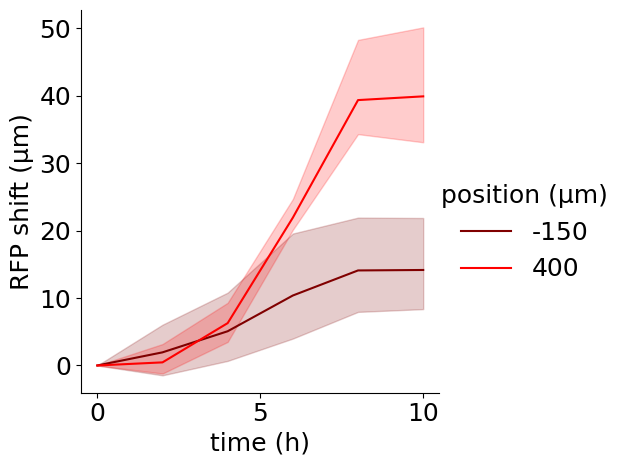

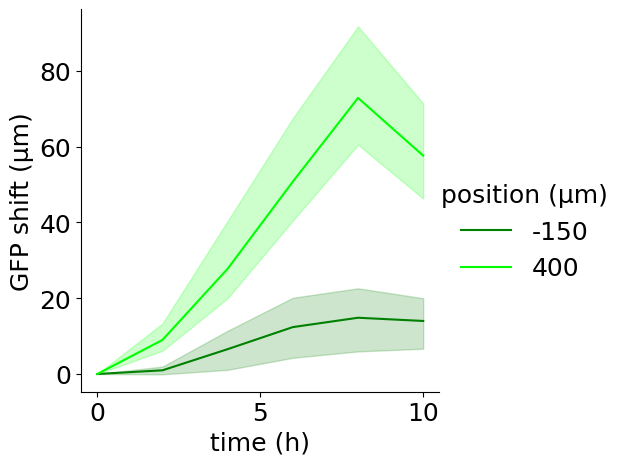

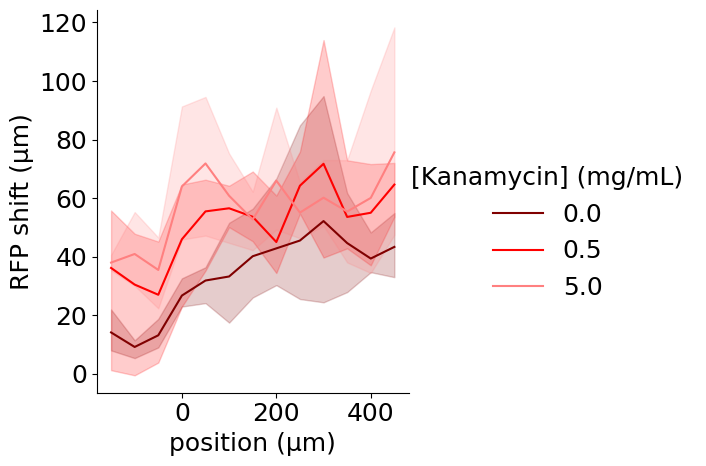

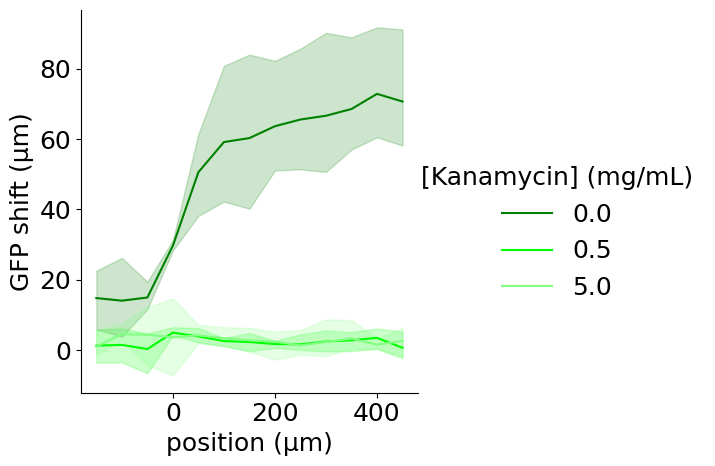

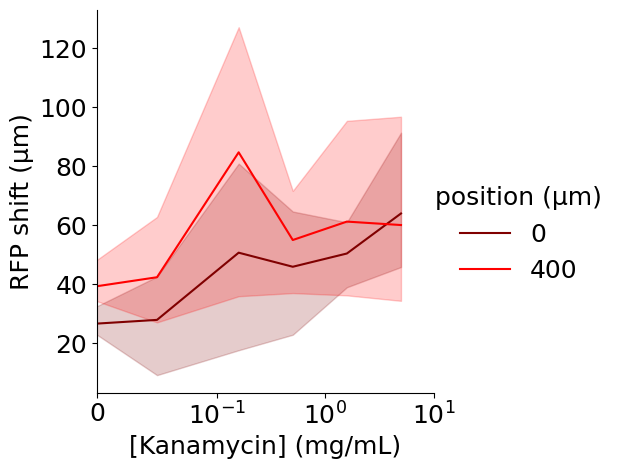

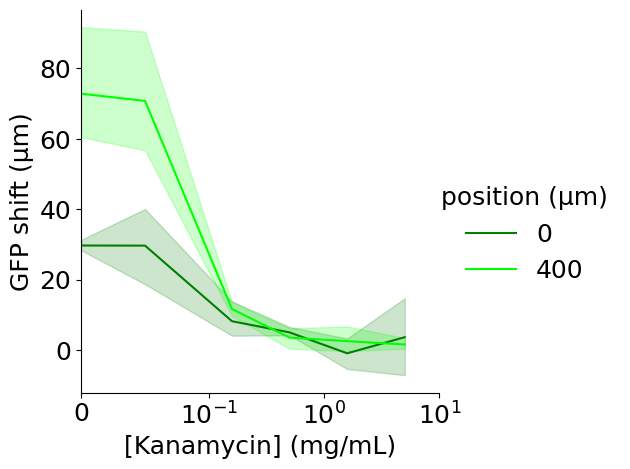

In [151]:
plotPositions=[-150,400]
plotConds=['0x','10x','100x']
expt='J4K5succ250_kanGrad'
conc='[Kanamycin] (mg/mL)'

gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]

# sns.relplot(x='time',y='redShift',hue='slicePos',data=df[(df.slicePos.isin([-150,0,400]))&(df.expt.isin(['J4K5succ250_ampGrad']))],kind='line')
# df.loc[(df.slicePos.isin([-150,0,400]))&(df.expt.isin(['J4K5succ250_ampGrad'])),['rep','time','slicePos','greenShift']].set_index(['slicePos','time','rep']).unstack()
g=sns.relplot(kind='line',x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
            data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin([expt]))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))
#g.set(ylim=(0, 50))
sns.relplot(kind='line',x='time (h)',y='GFP shift (μm)',hue='position (μm)',palette=gPalette[:len(plotPositions)],
            data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin([expt]))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))

# sns.relplot(kind='line',x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
#             data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin(['J4K5succ250_kanGrad']))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))
# sns.relplot(kind='line',x='time (h)',y='GFP shift (μm)',hue='position (μm)',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
#             data=df[(df['position (μm)'].isin(plotPositions))&(df.expt.isin(['J4K5succ250_kanGrad']))&(df.cond.isin(['0x']))].astype({'position (μm)':str}))

sns.relplot(kind='line',x='position (μm)',y='RFP shift (μm)',hue=conc,palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df.cond.isin(plotConds))])
sns.relplot(kind='line',x='position (μm)',y='GFP shift (μm)',hue=conc,palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df.cond.isin(plotConds))])
plotPositions=[0,400]

sns.relplot(kind='line',x=conc,y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df['position (μm)'].isin(plotPositions))])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])
sns.relplot(kind='line',x=conc,y='GFP shift (μm)',hue='position (μm)',palette=gPalette[:len(plotPositions)],
            data=df[(df['time (h)'].isin([8]))&(df.expt.isin([expt]))&(df['position (μm)'].isin(plotPositions))])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])


In [10]:
def fitSimSlice(img,lim1,lim2,channel,xlims=None,umPerPixel=850/64):
    if channel==1:
        imgSlice=img[lim1:lim2,:]
    elif channel==0:
        imgSlice=img[:,lim1:lim2].T
    else:
        return None
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
    return params
def minZero(mat):
    mat[mat<0]=0
    return mat
class biofilmSimulate:
    def __init__(self,
                exptName="simulation",
                xSize=64,
                dt=6,
                simTimeInSeconds=36000,
                simSizeInMicrons=850,
                initAmp=1,#initial ampicillin concentration in mg/mL
                initNutr=2,#initial nutrients in mg/mL
                bmMax=7.5,#carrying capacity of biomass density, in pg/um^2 (dry biomass, 1 cell~0.3pg)
                initDarkBmMean=None,#how much biomass density to initialize unilluminated regions in pg/um^2 (dry biomass, 1 cell~0.3pg)
                initIllumBmMean=3,#how much biomass to initialize illuminated regions in pg/um^2 (dry biomass, 1 cell~0.3pg)
                fractionIllum=0.25,#what fraction of simulation area is illuminated for each strain

                gammaBm=5.6e-6,#death rate of biomass in s^-1
                gammaBla=9.6e-6,#decay rate of betalactamase in s^-1
                gammaAmp=7.4e-6,#inherent decay rate of ampicillin in s^-1 (not mediated by bla)
                 
                D_nutr=600,#diffusivity of nutrients in um^2/s
                D_bm=0.1,#diffusivity of biomass in um^2/s
                D_amp=400,#diffusivity of ampicillin in um^2/s
                D_bla=.1,#diffusivity of betalactamase in um^2/s
                 
                muMax=4.8e-5, #max growth rate in s^-1
                 
                K_nutr=0.004,#nutrient concentration at half max growth rate in mg/mL glucose
                yield_nutr=0.632,#nutrient to biomass conversion yield in (pg/um^2 biomass density)/(mg/mL nutrient)
                K_ampR=0.00094,#hill constant for ampicillin inhibition of red cells
                K_ampG=0.482,#hill constant for ampicillin inhibition of green cells
                h_amp=0.75,#hill coefficient for ampicillin inhibition of red and green cells
                Kd_bla=0.0012,#dissociation constant for beta lactamase degradation rxn of amp in mg/mL
                Kcat_bla=4.2,#catalytic constant for beta lactamase degradation rxn of amp in s^-1
                Kprod_bla=7e-10,#production rate of beta lactamase by green cells in (mg/mL)/(pg/um^2)/s%. Note that in the paper, units are converted to g_bla/s/g_drybiomass. Assuming 2e-9mL/um^2 (2mL in 10cm^2 for 6 well plate) 1(mg/mL)/(pg/um^2)/s=2g_bla/s/g_drybiomass
                Kdif=1e-5,#rate constant of diffusion of ampicillin into biofilm, in s^-1

                ):
        if initDarkBmMean is None:
            initDarkBmMean=initIllumBmMean/100
        warnings.filterwarnings('ignore')
        self.params=locals()
        self.params.pop('self')
        self.params['nSteps']=int(simTimeInSeconds/dt)
        self.params['cond']=f"{int(float('%.1g' % (initAmp*10)))}x"
        self.params['dx']=simSizeInMicrons/xSize
        self.Dmat=-2*np.diag(np.ones(xSize))+np.diag(np.ones(xSize-1),1)+np.diag(np.ones(xSize-1),-1)
        self.Dmat[0,0]=-1
        self.Dmat[-1,-1]=-1
        initBm1d=initDarkBmMean+(initIllumBmMean-initDarkBmMean)*np.exp(-(np.arange(xSize)-xSize*fractionIllum))/(1+np.exp(-(np.arange(xSize)-xSize*fractionIllum)))

        self.Gbm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.Gbm[:,:,0]=np.tile(initBm1d,(xSize,1))
        self.Rbm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.Rbm[:,:,0]=np.tile(initBm1d,(xSize,1)).T
        self.mu_R=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.mu_G=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.ampMedia=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.ampMedia[:,:,0]=initAmp
        self.ampBiofilm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.bla=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.nutr=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32)
        self.nutr[:,:,0]=initNutr
        self.greenCmap=LinearSegmentedColormap.from_list("greenCmap",[[0,0,0],[0,1,0]])
        self.redCmap=LinearSegmentedColormap.from_list("redCmap",[[0,0,0],[1,0,0]])
        warnings.filterwarnings('default')
        
    def simulate(self,nSteps=None):
        warnings.filterwarnings('ignore')
        if nSteps is None:
            nSteps=self.params['nSteps']
        for step in np.arange(nSteps):
            self.mu_R[:,:,step]=self.params['muMax']*np.divide(self.nutr[:,:,step],(self.nutr[:,:,step]+self.params['K_nutr']))*(1-(self.Rbm[:,:,step]+self.Gbm[:,:,step])/self.params['bmMax'])*np.divide(np.power(self.params['K_ampR'],self.params['h_amp']),(np.power(self.ampBiofilm[:,:,step],self.params['h_amp'])+np.power(self.params['K_ampR'],self.params['h_amp'])))
            self.mu_G[:,:,step]=self.params['muMax']*np.divide(self.nutr[:,:,step],(self.nutr[:,:,step]+self.params['K_nutr']))*(1-(self.Rbm[:,:,step]+self.Gbm[:,:,step])/self.params['bmMax'])*np.divide(np.power(self.params['K_ampG'],self.params['h_amp']),(np.power(self.ampBiofilm[:,:,step],self.params['h_amp'])+np.power(self.params['K_ampG'],self.params['h_amp'])))
            self.Rbm[:,:,step+1]=self.Rbm[:,:,step]*(1+self.params['dt']*(self.mu_R[:,:,step]-self.params['gammaBm']))+(self.params['dt']/np.power(self.params['dx'],2))*self.params['D_bm']*(np.matmul(self.Dmat,self.Rbm[:,:,step])+np.matmul(self.Rbm[:,:,step],self.Dmat));
            self.Gbm[:,:,step+1]=self.Gbm[:,:,step]*(1+self.params['dt']*(self.mu_G[:,:,step]-self.params['gammaBm']))+(self.params['dt']/np.power(self.params['dx'],2))*self.params['D_bm']*(np.matmul(self.Dmat,self.Gbm[:,:,step])+np.matmul(self.Gbm[:,:,step],self.Dmat));
            
            self.ampMedia[:,:,step+1]=self.ampMedia[:,:,step]+self.params['dt']*(-self.params['Kdif']*(self.ampMedia[:,:,step]-self.ampBiofilm[:,:,step])-self.params['gammaAmp']*self.ampMedia[:,:,step])
            self.ampMedia[:,:,step+1]=np.mean(self.ampMedia[:,:,step+1]);
            self.ampBiofilm[:,:,step+1]=self.ampBiofilm[:,:,step]+self.params['dt']*(self.params['Kdif']*(self.ampMedia[:,:,step]-self.ampBiofilm[:,:,step])-self.params['Kcat_bla']*self.bla[:,:,step]*np.divide(self.ampBiofilm[:,:,step],(self.params['Kd_bla']+self.ampBiofilm[:,:,step]))-self.params['gammaAmp']*self.ampBiofilm[:,:,step])
            self.bla[:,:,step+1]=self.bla[:,:,step]+(self.params['dt']/np.power(self.params['dx'],2))*self.params['D_bla']*(np.matmul(self.Dmat,self.bla[:,:,step])+np.matmul(self.bla[:,:,step],self.Dmat))+self.params['dt']*(self.params['Kprod_bla']*self.Gbm[:,:,step]-self.params['gammaBla']*self.bla[:,:,step]);
            self.nutr[:,:,step+1]=self.nutr[:,:,step]-(self.params['dt']/self.params['yield_nutr'])*(self.Rbm[:,:,step]*self.mu_R[:,:,step]+self.Gbm[:,:,step]*self.mu_G[:,:,step])
            self.nutr[:,:,step+1]=np.mean(self.nutr[:,:,step+1]);

            self.ampMedia[:,:,step+1]=minZero(self.ampMedia[:,:,step+1]);
            self.ampBiofilm[:,:,step+1]=minZero(self.ampBiofilm[:,:,step+1]);
            self.bla[:,:,step+1]=minZero(self.bla[:,:,step+1]);
            self.nutr[:,:,step+1]=minZero(self.nutr[:,:,step+1]);
            self.Rbm[:,:,step+1]=minZero(self.Rbm[:,:,step+1]);
            self.Gbm[:,:,step+1]=minZero(self.Gbm[:,:,step+1]);
        warnings.filterwarnings('default')
    
    def showPlots(self,steps=None):
        warnings.filterwarnings('ignore')
        if steps is None:
            steps=(np.arange(0,self.params['simTimeInSeconds']+1,7200)/self.params['dt']).astype(int)
        fig,axs=plt.subplots(nrows=len(steps),ncols=8,figsize=(16,2*len(steps)),squeeze=False)
        for ind,step in enumerate(steps):
            imagesc(self.Rbm[:,:,step],ax=axs[ind,0],cmap=self.redCmap,lims=(0,np.max(self.Rbm)))
            imagesc(self.Gbm[:,:,step],ax=axs[ind,1],cmap=self.greenCmap,lims=(0,np.max(self.Gbm)))
            imagesc(self.mu_R[:,:,step],ax=axs[ind,2],cmap=self.redCmap,lims=(0,np.max(self.mu_R)))
            imagesc(self.mu_G[:,:,step],ax=axs[ind,3],cmap=self.greenCmap,lims=(0,np.max(self.mu_G)))
            imagesc(self.bla[:,:,step],ax=axs[ind,4],cmap='gray',lims=(0,np.max(self.bla)))
            imagesc(self.ampMedia[:,:,step],ax=axs[ind,5],cmap='gray',lims=(0,np.max(self.ampMedia)))
            imagesc(self.ampBiofilm[:,:,step],ax=axs[ind,6],cmap='gray',lims=(0,np.max(self.ampBiofilm)))
            imagesc(self.nutr[:,:,step],ax=axs[ind,7],cmap='gray',lims=(0,np.max(self.nutr)))
        axs[0,0].set_title('Rbm',fontdict={'fontsize': 12})
        axs[0,1].set_title('Gbm',fontdict={'fontsize': 12})
        axs[0,2].set_title('mu_R',fontdict={'fontsize': 12})
        axs[0,3].set_title('mu_G',fontdict={'fontsize': 12})
        axs[0,4].set_title('bla',fontdict={'fontsize': 12})
        axs[0,5].set_title('ampMedia',fontdict={'fontsize': 12})
        axs[0,6].set_title('ampBiofilm',fontdict={'fontsize': 12})
        axs[0,7].set_title('nutr',fontdict={'fontsize': 12})
        for axs2 in axs:
            for ax in axs2:
                ax.set_yticklabels([])
                ax.set_xticklabels([])
                ax.set_yticks([])
                ax.set_xticks([])
        warnings.filterwarnings('default')
        
    def getFits(self, steps=None,positions=np.arange(-150,500,50),sliceWidth=80):
        if steps is None:
            steps=(np.arange(0,self.params['simTimeInSeconds']+1,7200)/self.params['dt']).astype(int)
        initBoundary=self.params['simSizeInMicrons']*self.params['fractionIllum']
        slicePosListInPixels=list(zip(np.ceil((initBoundary+positions-sliceWidth/2)/self.params['dx']).astype(int),
                                           np.floor((initBoundary+positions+sliceWidth/2)/self.params['dx']).astype(int)))
        df=pd.DataFrame()
        for step in steps:
            newDf=pd.DataFrame({'expt':self.params['exptName'],
                                'cond':self.params['cond'],
                                'rep':1,
                                'time (h)':int(step*self.params['dt']/3600),
                                'position (μm)':positions,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in slicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in slicePosListInPixels],
                                'greenX0':[fitSimSlice(self.Gbm[:,:,step],lim1,lim2,channel=1)[-1] for lim1,lim2 in slicePosListInPixels],
                                'redX0':[fitSimSlice(self.Rbm[:,:,step],lim1,lim2,channel=0)[-1] for lim1,lim2 in slicePosListInPixels]})
            if step==0:
                initGreenX0=newDf.greenX0
                initRedX0=newDf.redX0
                newDf['GFP shift (μm)']=0
                newDf['RFP shift (μm)']=0
            else:
                newDf['GFP shift (μm)']=newDf.greenX0-initGreenX0
                newDf['RFP shift (μm)']=newDf.redX0-initRedX0
            df=pd.concat([df,newDf])

        df=df.reset_index(drop=True)
        df['[Ampicillin] (mg/mL)']=self.params['initAmp']
        df['[Kanamycin] (mg/mL)']=np.nan
        return df
    
def simAmpGrad(makePlots=True,savePlots=False,saveName=None,includeLegend=False,fontScale=1.8,fullDf=None,**kwargs):
    initAmps=df['[Ampicillin] (mg/mL)'].dropna().unique()
    if fullDf is None:
        fullDf=df[df.expt.str.contains('amp')].copy()
        for initAmp in initAmps:
            testSim=biofilmSimulate(initAmp=initAmp,**kwargs)
            testSim.simulate()
            simDf=testSim.getFits()
            fullDf=pd.concat([fullDf,simDf])
            del testSim
    else:
        pass
    if makePlots:
        with sns.plotting_context("notebook",font_scale=fontScale):

            plotPositions=[-150,400]
            plotConds=['0x','10x','100x']

            gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
            rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]
            if includeLegend:
                fig,axs=plt.subplots(2,3,figsize=(24,8))
            else:
                fig,axs=plt.subplots(2,3,figsize=(12,8))

            plotDf=fullDf[(fullDf.cond=='0x')&(fullDf['position (μm)'].isin(plotPositions))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))
            g=sns.lineplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['cond'].isin(plotConds))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            g=sns.lineplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))


            plotPositions=[0,400]

            plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['position (μm)'].isin(plotPositions))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
            g.set_xscale('symlog', linthresh=0.1)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
            g.set_xscale('symlog', linthresh=0.1)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            titleString='_'.join([f"{key}={value}" for key, value in kwargs.items()])
            fig.suptitle(titleString,fontsize=12)
            fig.tight_layout()
            if savePlots:
                if saveName is None:
                    fig.savefig(os.path.join('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/',f'{titleString}.pdf'))
                else:
                    fig.savefig(saveName)
    return fullDf
def getAmpGradDiffs(fullDf):
    compareDf=fullDf[fullDf.expt=='J4K5succ250_ampGrad'].groupby(['cond','time (h)','position (μm)'])[['GFP shift (μm)','RFP shift (μm)','[Ampicillin] (mg/mL)']].mean().reset_index().merge(fullDf.loc[fullDf.expt=='simulation',['cond','time (h)','position (μm)','GFP shift (μm)','RFP shift (μm)']],on=(['cond','time (h)','position (μm)',]),suffixes=(' - expt',' - sim'))
    diff=np.mean(np.concatenate((np.abs(compareDf['GFP shift (μm) - expt']-compareDf['GFP shift (μm) - sim']),np.abs(compareDf['RFP shift (μm) - expt']-compareDf['RFP shift (μm) - sim']))))
    diff0x=np.mean(np.concatenate((np.abs(compareDf.loc[compareDf.cond=='0x','GFP shift (μm) - expt']-compareDf.loc[compareDf.cond=='0x','GFP shift (μm) - sim']),np.abs(compareDf.loc[compareDf.cond=='0x','RFP shift (μm) - expt']-compareDf.loc[compareDf.cond=='0x','RFP shift (μm) - sim']))))
    return diff, diff0x

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL)
0,ampGradSim,10x,1,0.0,-150,2-7,2-7,212.499999,212.499999,0.000000,0.000000,1
1,ampGradSim,10x,1,0.0,-100,6-11,6-11,212.499999,212.499999,0.000000,0.000000,1
2,ampGradSim,10x,1,0.0,-50,10-15,10-15,212.499999,212.499999,0.000000,0.000000,1
3,ampGradSim,10x,1,0.0,0,13-19,13-19,212.500001,212.500001,0.000000,0.000000,1
4,ampGradSim,10x,1,0.0,50,17-22,17-22,212.499999,212.499999,0.000000,0.000000,1
5,ampGradSim,10x,1,0.0,100,21-26,21-26,212.499999,212.499999,0.000000,0.000000,1
6,ampGradSim,10x,1,0.0,150,25-30,25-30,212.499999,212.499999,0.000000,0.000000,1
7,ampGradSim,10x,1,0.0,200,29-34,29-34,212.499999,212.499999,0.000000,0.000000,1
8,ampGradSim,10x,1,0.0,250,32-37,32-37,212.499999,212.499999,0.000000,0.000000,1
9,ampGradSim,10x,1,0.0,300,36-41,36-41,212.499999,212.499999,0.000000,0.000000,1


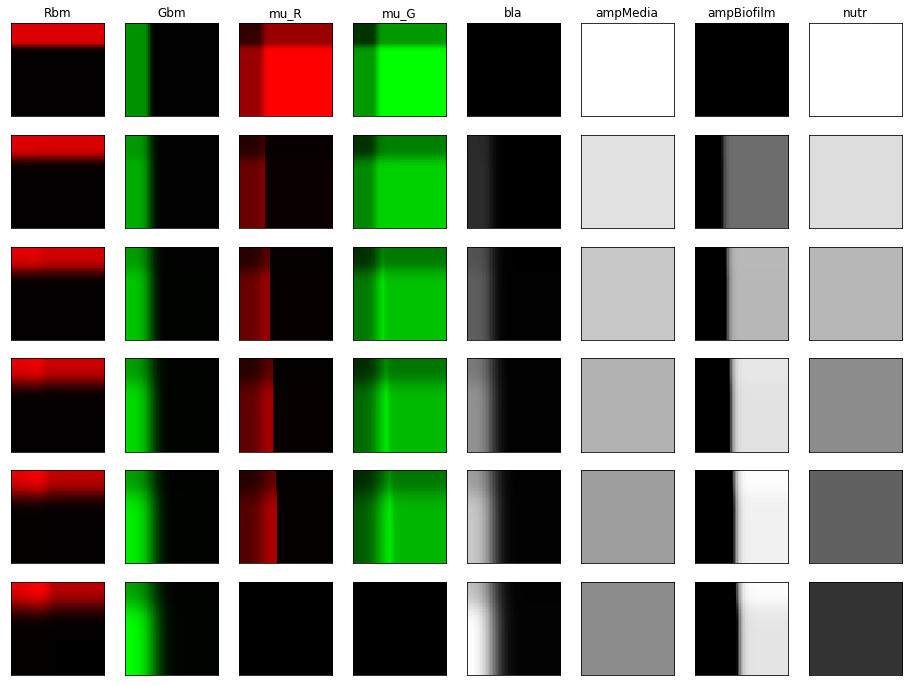

In [123]:
testSim=biofilmSimulate()
testSim.simulate()
testSim.showPlots()
simDf=testSim.getFits()
simDf

In [323]:
np.round(np.linspace(3e-5,1.2e-4,num=11),decimals=6)

array([3.00e-05, 3.90e-05, 4.80e-05, 5.70e-05, 6.60e-05, 7.50e-05,
       8.40e-05, 9.30e-05, 1.02e-04, 1.11e-04, 1.20e-04])

In [283]:
%%capture
# muMaxs=[4.8e-5,9.6e-5,1.8e-4]
# D_bms=[0.05,0.1,0.2]
# bmMax_initIllumBmMeans=[(7.5,3),(5,2),(3,1.2)]

muMaxs=np.round(np.linspace(4.8e-5,1.8e-4,num=6),decimals=6)
D_bms=np.linspace(.05,.2,num=4)
bmMax_initIllumBmMeans=[(bmMax,np.round(bmMax*multFactor,1)) for bmMax in np.arange(2,9) for multFactor in [0.35,.4,0.45]]

# muMaxs=[4.8e-5,9.6e-5]
# D_bms=[0.05]
# bmMax_initIllumBmMeans=[(7.5,3)]

simDiffDf=pd.DataFrame(((muMax,D_bm,bmMax,initIllumBmMean)+getAmpGradDiffs(simAmpGrad(muMax=muMax,D_bm=D_bm,bmMax=bmMax,initIllumBmMean=initIllumBmMean,savePlots=True)) for muMax in muMaxs for D_bm in D_bms for bmMax,initIllumBmMean in bmMax_initIllumBmMeans),
            columns=['muMax','D_bm','bmMax','initIllumBmMean','diff','diff0x'])
simDiffDf.to_csv(os.path.join('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/','simDiffDf.csv'))

In [315]:
simDiffDf.sort_values(by='diff')

,muMax,D_bm,bmMax,initIllumBmMean,diff,diff0x
52,0.000048,0.15,5,2.0,3140.357676,557.640364
55,0.000048,0.15,6,2.4,3170.738529,621.774028
53,0.000048,0.15,5,2.2,3170.832171,521.452222
35,0.000048,0.10,6,2.7,3185.181570,745.566379
32,0.000048,0.10,5,2.2,3214.134305,692.792936
51,0.000048,0.15,5,1.8,3227.956315,615.895243
49,0.000048,0.15,4,1.6,3231.640982,557.025531
56,0.000048,0.15,6,2.7,3234.573260,549.046653
50,0.000048,0.15,4,1.8,3240.242463,517.978553
38,0.000048,0.10,7,3.2,3253.679525,851.605731


In [290]:
simDiffDf.sort_values(by='diff0x')

,muMax,D_bm,bmMax,initIllumBmMean,diff,diff0x
76,0.000048,0.20,6,2.4,4080.354974,512.285171
47,0.000048,0.15,3,1.4,3401.416372,516.153732
50,0.000048,0.15,4,1.8,3240.242463,517.978553
44,0.000048,0.15,2,0.9,3563.165127,518.105333
53,0.000048,0.15,5,2.2,3170.832171,521.452222
77,0.000048,0.20,6,2.7,4512.304740,524.716589
75,0.000048,0.20,6,2.1,3773.369325,528.316516
80,0.000048,0.20,7,3.2,4656.778561,540.676754
91,0.000074,0.05,4,1.6,3326.868463,544.715872
92,0.000074,0.05,4,1.8,3477.381862,548.357745


C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\execution.py:1200: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  t0 = clock()
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\execution.py:1202: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  tp = clock()-t0
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\execution.py:1217: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  t0 = clock()
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\magics\execution.py:1219: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead
  tc = clock

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained unt

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained unt

Wall time: 1h 47min 53s


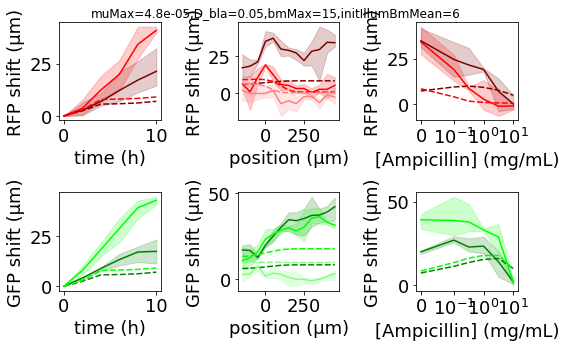

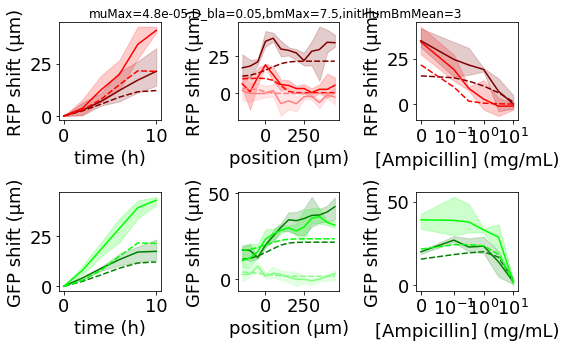

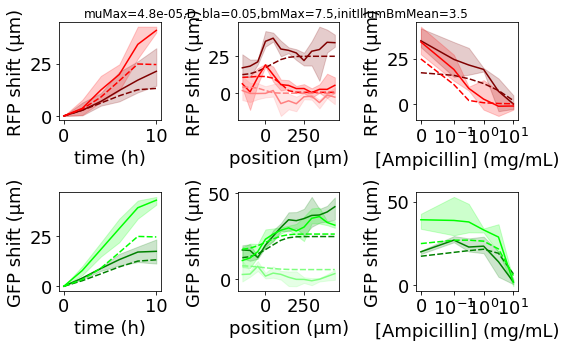

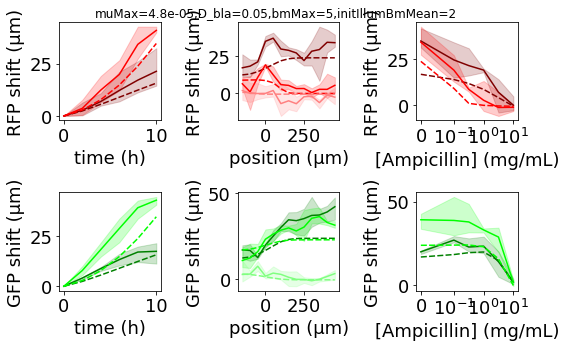

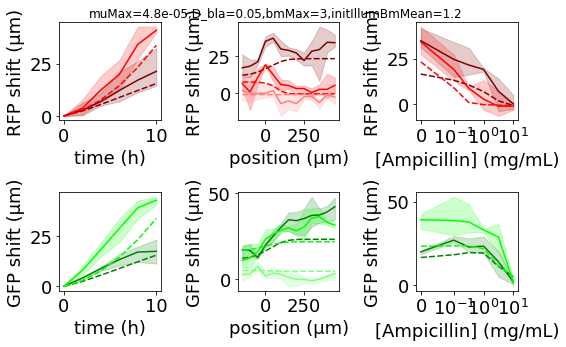

...

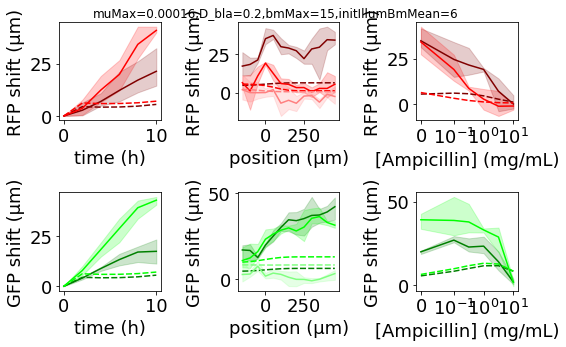

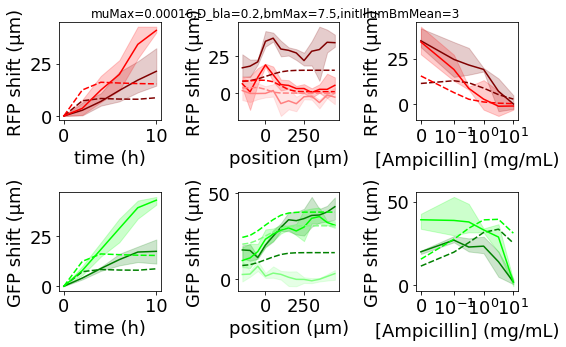

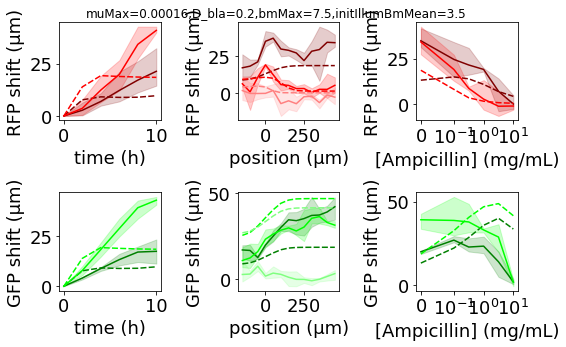

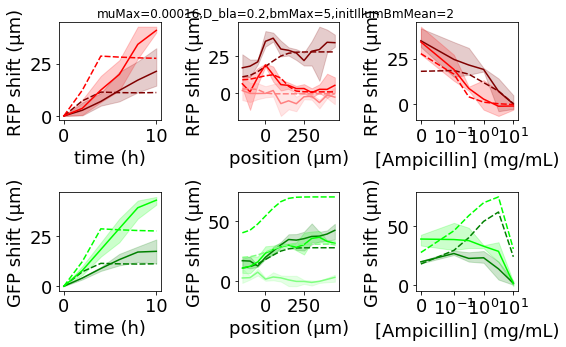

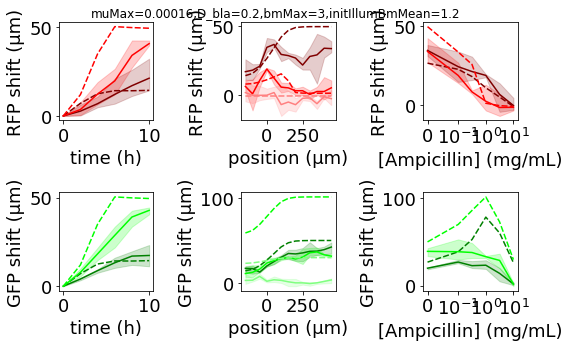

In [174]:
%%time
muMaxs=[4.8e-5,9.6e-5,1.6e-4]
D_bms=[0.05,0.1,0.2]
bmMax_initIllumBmMeans=[(7.5,3),(7.5,3.5),(5,2),(3,1.2)]
for muMax in muMaxs:
    for D_bm in D_bms:
        for bmMax,initIllumBmMean in bmMax_initIllumBmMeans:
            simAmpGrad(muMax=muMax,D_bm=D_bm,bmMax=bmMax,initIllumBmMean=initIllumBmMean)

In [21]:
simDiffDfWynton=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDf.csv')
simDiffDfWynton

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x
0,0.000030,0.500,6.0,2.7,2.200000e-10,0.000100,0.320,17009.179874,2617.830617
1,0.000048,0.250,2.0,0.7,7.000000e-10,0.000001,0.010,7431.627594,775.704743
2,0.000030,0.050,7.0,2.8,7.000000e-09,0.000003,0.100,5844.377820,1726.798553
3,0.000048,0.200,6.0,3.0,7.000000e-09,0.000001,0.320,8449.972956,563.616418
4,0.000048,0.125,3.0,1.4,7.000000e-10,0.000001,0.010,3961.679901,547.941834
5,0.000048,0.100,5.0,2.5,7.000000e-10,0.000001,1.000,4270.453796,595.370467
6,0.000066,0.050,3.0,1.4,7.000000e-10,0.000100,0.100,4209.270661,551.044704
7,0.000048,0.400,7.0,2.4,7.000000e-09,0.000001,0.032,17102.869859,1753.408723
8,0.000066,0.025,3.0,1.5,2.200000e-10,0.000100,0.000,4701.908182,743.963130
9,0.000030,0.300,6.0,3.0,7.000000e-10,0.000100,1.000,6364.442198,758.454607


In [365]:
simDiffDfWynton[(simDiffDfWynton.bmMax==6)&
               (simDiffDfWynton.D_bla==0)&
               (simDiffDfWynton.initIllumBmMean==3)].groupby(['muMax','D_bm'])['diff'].min().unstack()

D_bm,0.025,0.05,0.075,0.1,0.125,0.15,0.2,0.25,0.3,0.4,0.5
muMax,,,,,,,,,,,
0.000030,5909.769368,5446.004393,5041.857121,4652.461434,4282.319703,3926.087099,3681.341321,4325.655041,5565.233344,10660.994177,17128.768378
0.000048,4416.094524,3714.753663,3327.450878,3062.562321,3083.698373,3403.094219,4118.162468,5174.491338,7309.723473,13246.872436,19812.923136
0.000066,3505.983444,3281.489420,3663.083390,4057.034892,4493.872487,4712.048128,5251.736342,6878.439716,9376.891588,15572.529328,22138.718428
0.000084,3645.415455,4205.021583,4826.422707,5433.107800,5710.139378,5975.862519,6859.268842,8602.850758,11231.674528,17360.238273,23903.337746
0.000102,4257.810559,5070.090509,5925.414797,6432.290483,6854.832175,7240.640539,8226.092882,10040.967501,12672.342318,18793.091122,25340.587719
0.000120,4925.296494,5973.610839,6745.991861,7345.579933,7858.838807,8322.168907,9521.747986,11346.055108,13947.245377,19977.767074,26443.161960


D_bm,0.025,0.05,0.075,0.1,0.125,0.15,0.2,0.25,0.3,0.4,0.5
muMax,,,,,,,,,,,
0.000030,1746.977990,1576.731796,1442.177993,1317.645191,1178.769488,1027.132008,718.090700,570.027411,758.454607,1635.760165,2739.714517
0.000048,1223.044641,961.192231,782.003155,642.777628,552.244265,505.420702,563.616418,892.159195,1376.572728,2467.600094,3593.341084
0.000066,970.531925,769.499394,688.375908,657.719933,650.266916,676.514351,821.852167,1191.117627,1696.716414,2782.516839,3892.427737
0.000084,976.981267,873.052139,859.567843,873.993252,901.873974,936.993545,1042.368186,1337.936060,1813.118841,2867.555128,3954.782985
0.000102,1053.708885,991.316053,991.215987,1015.498137,1047.221626,1081.329902,1174.544905,1423.554049,1894.387557,2947.830509,4044.399087
0.000120,1150.603228,1124.038285,1130.598872,1163.612289,1199.540665,1233.453843,1309.440327,1504.106789,1933.398628,2953.329336,4016.197021


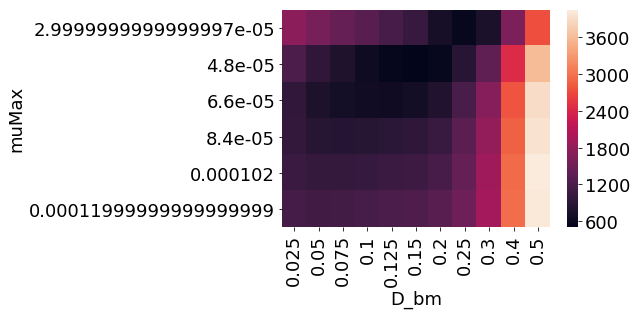

In [366]:
mat=simDiffDfWynton[(simDiffDfWynton.bmMax==6)&
               (simDiffDfWynton.D_bla==0)&
               (simDiffDfWynton.initIllumBmMean==3)].groupby(['muMax','D_bm'])['diff0x'].min().unstack()
sns.heatmap(mat)
mat

Kdif,1e-06,3.2e-06,1e-05,3.2e-05,0.0001
Kprod_bla,,,,,
7.000000e-11,4114.859100,3723.056358,3762.944268,3959.937281,4068.357517
2.200000e-10,4630.653762,3717.589475,3607.498146,3896.018926,4042.685703
7.000000e-10,5197.411449,4406.035074,3437.085821,3536.194658,3874.451945
2.200000e-09,5700.261585,5123.048284,4218.537172,3403.094219,3418.761685
7.000000e-09,6188.419595,5671.397162,5069.435615,4204.249490,3741.829864


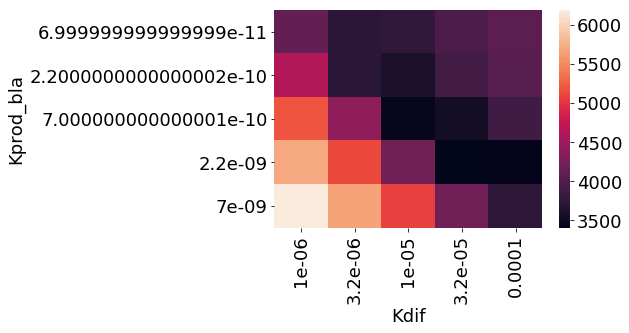

In [354]:
mat=simDiffDfWynton[(simDiffDfWynton.muMax==0.000048) &
               (simDiffDfWynton.D_bm==0.15)&
               (simDiffDfWynton.bmMax==6)&
               (simDiffDfWynton.D_bla==0)&
               (simDiffDfWynton.initIllumBmMean==3)].groupby(['Kprod_bla','Kdif'])['diff'].min().unstack()
sns.heatmap(mat)
mat

In [368]:
simDiffDfWynton2.sort_values(by='diff')

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h
768,0.000048,0.15,6.0,3.0,1.260000e-09,0.000025,0.0,3314.815290,505.420702,726.833720
562,0.000048,0.15,6.0,3.0,1.000000e-09,0.000020,0.0,3316.197813,505.420702,725.391506
786,0.000048,0.15,6.0,3.0,1.000000e-09,0.000025,0.0,3322.256514,505.420702,742.177587
637,0.000048,0.15,6.0,3.0,1.260000e-09,0.000032,0.0,3323.948197,505.420702,740.720720
718,0.000048,0.15,6.0,3.0,7.940000e-10,0.000016,0.0,3325.067238,505.420702,725.057796
724,0.000048,0.15,6.0,3.0,1.580000e-09,0.000032,0.0,3325.395779,505.420702,728.465057
576,0.000048,0.15,6.0,3.0,7.940000e-10,0.000020,0.0,3328.266198,505.420702,745.411306
672,0.000048,0.15,6.0,3.0,1.580000e-09,0.000040,0.0,3334.716435,505.420702,742.073313
595,0.000048,0.15,6.0,3.0,1.260000e-09,0.000020,0.0,3342.442965,505.420702,724.726132
588,0.000048,0.15,6.0,3.0,6.310000e-10,0.000013,0.0,3342.945927,505.420702,729.378083


In [137]:
simDiffDfWynton.sort_values(by='diff0x')

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h
8446,0.000048,0.166,6.0,3.0,1.130000e-09,0.000024,0.0,3586.841379,495.846478,794.347256
8397,0.000046,0.166,6.0,3.0,1.130000e-09,0.000024,0.0,3407.571059,496.269882,747.056147
8336,0.000046,0.174,6.0,3.0,1.130000e-09,0.000024,0.0,3570.426625,496.935960,785.240131
8421,0.000048,0.158,6.0,3.0,1.130000e-09,0.000024,0.0,3434.666884,499.249275,755.478585
8745,0.000048,0.174,6.0,3.0,1.130000e-09,0.000024,0.0,3774.322596,500.741315,848.045654
8036,0.000044,0.174,6.0,3.0,1.130000e-09,0.000024,0.0,3423.848920,503.229604,748.550358
8784,0.000046,0.158,6.0,3.0,1.130000e-09,0.000024,0.0,3277.420397,503.531000,721.721897
8415,0.000048,0.151,6.0,3.0,1.130000e-09,0.000024,0.0,3322.035693,504.603176,730.144816
8283,0.000050,0.166,6.0,3.0,1.130000e-09,0.000024,0.0,3813.856350,505.251819,863.699589
8277,0.000050,0.158,6.0,3.0,1.130000e-09,0.000024,0.0,3639.538852,505.830064,816.053389


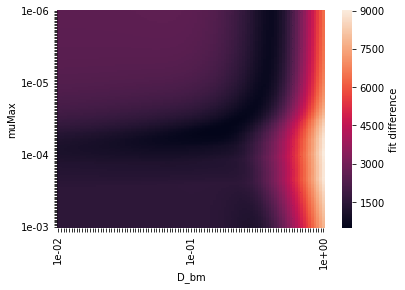

In [17]:
simDiffDfWynton=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDf_Dbm_muMax_search.csv')

mat2=simDiffDfWynton.groupby(['muMax','D_bm'])['diff0x'].min().unstack()
g=sns.heatmap(mat2,xticklabels=True,yticklabels=True,cbar_kws={'label': 'fit difference'})
# g.set_yticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_yticklabels()])
# g.set_xticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_xticklabels()])
g.set_xticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in g.get_xticklabels()])
g.set_yticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in g.get_yticklabels()])
g

In [407]:
def getRbfMin(*x,y,function='cubic',smoothing=0):
    rbfFit=Rbf(*x,y,function=function,smoothing=smoothing)
    return minimize(lambda xy: rbfFit(*xy),x0=[xx.mean() for xx in x]).x
def evalRbf(x,rbfFit):
    if x.ndim==1:
        x=np.expand_dims(x,axis=1)
    return rbfFit(x)
def getRbfMin2(x,y,function='cubic',smoothing=0):
    if x.ndim==1:
        x=np.expand_dims(x,axis=1)
    rbfFit=RBFInterpolator(x,y,kernel=function,smoothing=smoothing)

    # [:, np.newaxis]
    return minimize(lambda x: evalRbf(x,rbfFit=rbfFit),x0=np.mean(x,axis=0)).x

# aa=RBFInterpolator(np.expand_dims(simDiffDfWynton['D_bm'],axis=1),simDiffDfWynton['diff0x'],kernel='cubic')
# aa([[0.150],[.160]])
# minimize(lambda x: aa([x]),x0=[.15]).x
print(getRbfMin2(simDiffDfWynton['D_bm'],y=simDiffDfWynton['diff0x'],function='cubic'))
print(np.power(10,getRbfMin2(np.log10(simDiffDfWynton['D_bm']),y=simDiffDfWynton['diff0x'],function='cubic')))

# 'multiquadric': sqrt((r/self.epsilon)**2 + 1)
# 'inverse': 1.0/sqrt((r/self.epsilon)**2 + 1)
# 'gaussian': exp(-(r/self.epsilon)**2)
# 'linear': r
# 'cubic': r**3
# 'quintic': r**5
# 'thin_plate': r**2 * log(r)

[0.14867334]
[0.14866619]


In [349]:
# RegularGridInterpolator(
aa=simDiffDfWynton.sort_values(by='D_bm')
interp=RegularGridInterpolator((aa.D_bm,),np.expand_dims(aa.diff0x,axis=1),method='cubic', bounds_error=False,fill_value=None)
minimize(lambda x: interp(x),x0=[aa.D_bm.mean()]).x

array([0.14867361])

[0.14866614]
[0.14867368]


,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h,logKprod_bla,logKdif,logD_bm
38,0.000048,0.148,6.0,3.0,1.130000e-09,0.000024,0.0,3.142525,2.617315,4.199272,-20.601048,-10.654264,-1.910543
54,0.000048,0.151,6.0,3.0,1.130000e-09,0.000024,0.0,3.156824,2.620490,4.190420,-20.601048,-10.654264,-1.890475
14,0.000048,0.145,6.0,3.0,1.130000e-09,0.000024,0.0,3.133857,2.627137,4.226042,-20.601048,-10.654264,-1.931022
117,0.000048,0.155,6.0,3.0,1.130000e-09,0.000024,0.0,3.185491,2.639382,4.198272,-20.601048,-10.654264,-1.864330
15,0.000048,0.141,6.0,3.0,1.130000e-09,0.000024,0.0,3.127685,2.647012,4.275318,-20.601048,-10.654264,-1.958995


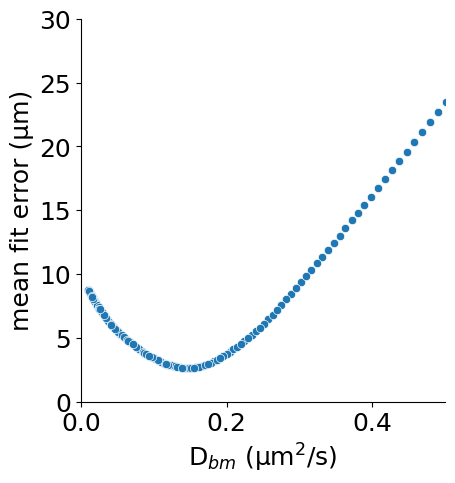

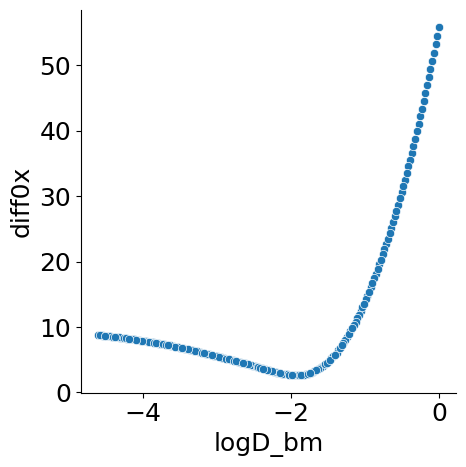

In [115]:
simDiffDfWynton=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_DbmOnly/outDf.csv')
rbfDf=simDiffDfWynton.copy()
rbfDf['logKprod_bla']=np.log(rbfDf.Kprod_bla)
rbfDf['logKdif']=np.log(rbfDf.Kdif)
rbfDf['logD_bm']=np.log(rbfDf.D_bm)
# rbfDf=rbfDf[['logD_bm','diff0x']].drop_duplicates()
# rbfDf['D_bm']=np.power(10,rbfDf['logD_bm'])
g=sns.relplot(x='D_bm',y='diff0x',data=rbfDf.reset_index(drop=True))
g.ax.set_ylabel('mean fit error (µm)')
g.ax.set_xlabel('D$_{bm}$ (µm$^2$/s)')
g.ax.set_xlim([0,0.5])
g.ax.set_ylim([0,30])
sns.relplot(x='logD_bm',y='diff0x',data=rbfDf)
rbfFit=Rbf(rbfDf['logD_bm'],rbfDf['diff0x'],function='cubic')
print(np.exp(minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['logD_bm'].mean()]).x))

rbfFit=Rbf(rbfDf['D_bm'],rbfDf['diff0x'],function='cubic')
print(minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['D_bm'].mean()]).x)
rbfDf.sort_values(by='diff0x').head()


[0.14897901]
[0.14897006]


,logD_bm,diff0x,D_bm
38,-0.83,2.61731,0.147911
54,-0.82,2.62049,0.151356
14,-0.84,2.62714,0.144544
117,-0.81,2.63938,0.154882
15,-0.85,2.64701,0.141254


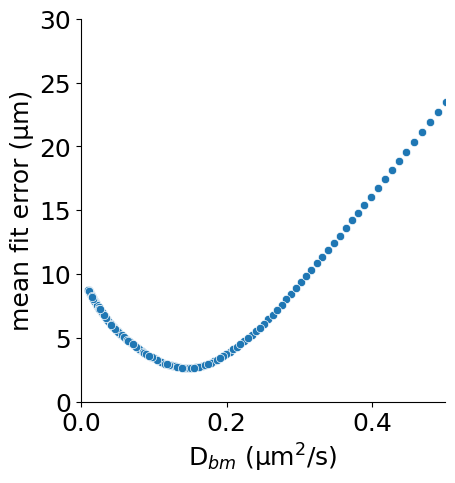

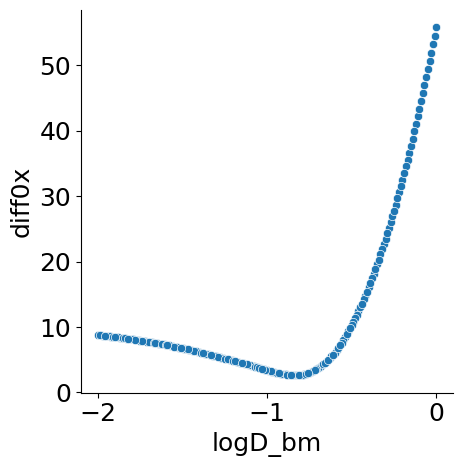

In [161]:
simDiffDfWynton=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_DbmOnly/outDf.csv')
rbfDf=simDiffDfWynton.copy()
rbfDf['logKprod_bla']=np.round(np.log10(rbfDf.Kprod_bla),2)
rbfDf['logKdif']=np.round(np.log10(rbfDf.Kdif),2)
rbfDf['logD_bm']=np.round(np.log10(rbfDf.D_bm),2)
rbfDf['diff0x']=np.round(rbfDf.diff0x,5)
rbfDf=rbfDf[['logD_bm','diff0x']].drop_duplicates()
rbfDf['D_bm']=np.power(10,rbfDf['logD_bm'])
g=sns.relplot(x='D_bm',y='diff0x',data=rbfDf.reset_index(drop=True))
g.ax.set_ylabel('mean fit error (µm)')
g.ax.set_xlabel('D$_{bm}$ (µm$^2$/s)')
g.ax.set_xlim([0,0.5])
g.ax.set_ylim([0,30])
g.savefig('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/DbmSearch.pdf')
g.savefig(os.path.join(savePath,'DbmSearch.pdf'))
sns.relplot(x='logD_bm',y='diff0x',data=rbfDf)
rbfFit=Rbf(rbfDf['logD_bm'],rbfDf['diff0x'],function='cubic')
print(np.power(10,minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['logD_bm'].mean()]).x))

rbfFit=Rbf(rbfDf['D_bm'],rbfDf['diff0x'],function='cubic')
print(minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['D_bm'].mean()]).x)
rbfDf.sort_values(by='diff0x').head()


In [41]:
noiseThreshold=df[df.cond=='0x'].groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std().mean().mean()
simDiffDfWynton[simDiffDfWynton.diff0x<simDiffDfWynton.diff0x.min()+noiseThreshold]['D_bm'].describe()

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_9904\1889171044.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  noiseThreshold=df[df.cond=='0x'].groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std().mean().mean()


count    69.000000
mean      0.127277
std       0.057612
min       0.052500
25%       0.077600
50%       0.115000
75%       0.170000
max       0.251000
Name: D_bm, dtype: float64

In [5]:
numDraws=1000
randSimParamsDf=df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].mean().join(df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std(),lsuffix='_mean',rsuffix='_std')
randSimGreenShiftDf=pd.DataFrame(np.broadcast_to(randSimParamsDf[['GFP shift (μm)_mean']],(len(randSimParamsDf),numDraws))+np.random.randn(len(randSimParamsDf),numDraws)*np.broadcast_to(randSimParamsDf[['GFP shift (μm)_std']],(len(randSimParamsDf),numDraws)))
randSimGreenShiftDf.index=randSimParamsDf.index
randSimGreenShiftDf=randSimGreenShiftDf.reset_index()
randSimGreenShiftDf=randSimGreenShiftDf[randSimGreenShiftDf.expt=='J4K5succ250_ampGrad'].drop('expt',axis=1)
randSimGreenShift0xDf=randSimGreenShiftDf[randSimGreenShiftDf.cond=='0x']
randSimGreenShiftDf=randSimGreenShiftDf.sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])
randSimGreenShift0xDf=randSimGreenShift0xDf.sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])

randSimRedShiftDf=pd.DataFrame(np.broadcast_to(randSimParamsDf[['RFP shift (μm)_mean']],(len(randSimParamsDf),numDraws))+np.random.randn(len(randSimParamsDf),numDraws)*np.broadcast_to(randSimParamsDf[['RFP shift (μm)_std']],(len(randSimParamsDf),numDraws)))
randSimRedShiftDf.index=randSimParamsDf.index
randSimRedShiftDf=randSimRedShiftDf.reset_index()
randSimRedShiftDf=randSimRedShiftDf[randSimRedShiftDf.expt=='J4K5succ250_ampGrad'].drop('expt',axis=1)
randSimRedShift0xDf=randSimRedShiftDf[randSimRedShiftDf.cond=='0x']
randSimRedShiftDf=randSimRedShiftDf.sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])
randSimRedShift0xDf=randSimRedShift0xDf.sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])
randSimRedShift0xDf

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\333371063.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  randSimParamsDf=df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].mean().join(df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std(),lsuffix='_mean',rsuffix='_std')
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\333371063.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  randSimParamsDf=df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].mean().join(df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std(),lsuffix='_mean',rsuffix='_std')


0          1          2          3    \
cond time (h) position (μm)                                               
0x   0        -150            0.000000   0.000000   0.000000   0.000000   
              -100            0.000000   0.000000   0.000000   0.000000   
              -50             0.000000   0.000000   0.000000   0.000000   
               0              0.000000   0.000000   0.000000   0.000000   
               50             0.000000   0.000000   0.000000   0.000000   
...                                ...        ...        ...        ...   
     10        250           26.879084  40.148370  21.550391  14.983133   
               300           47.733667  37.522594  32.450475  35.365733   
               350           54.871453  37.129921  12.707199  36.940048   
               400           42.475364  39.304820  42.485946  42.484287   
               450           40.204434  47.174643  42.171988  50.484106   

                                   4          5          6          7    \
cond time (h) position (μm)                                               
0x   0        -150            0.000000   0.000000   0.000000   0.000000   
              -100            0.000000   0.000000   0.000000   0.000000   
              -50             0.000000   0.000000   0.000000   0.000000   
               0              0.000000   0.000000   0.000000   0.000000   
               50             0.000000   0.000000   0.000000   0.000000   
...                                ...        ...        ...        ...   
     10        250           28.848634  27.202295   9.864334  36.933889   
               300           22.659492  61.623446  29.595429  42.993529   
               350           41.160434  36.347268  38.084625  45.932518   
               400           42.036346  39.888369  41.634640  41.342259   
               450           48.385642  41.688493  44.093176  42.698979   

                                   8          9    ...        990        991  \
cond time (h) position (μm)                        ...                         
0x   0        -150            0.000000   0.000000  ...   0.000000   0.000000   
              -100            0.000000   0.000000  ...   0.000000   0.000000   
              -50             0.000000   0.000000  ...   0.000000   0.000000   
               0              0.000000   0.000000  ...   0.000000   0.000000   
               50             0.000000   0.000000  ...   0.000000   0.000000   
...                                ...        ...  ...        ...        ...   
     10        250           33.794978  24.164208  ...  36.444364  59.639194   
               300           42.430519  33.612548  ...  43.748282  38.102830   
               350           34.249798  11.301132  ...  22.512126 -16.245693   
               400           40.780463  40.148559  ...  40.451953  42.292618   
               450           42.813542  44.560871  ...  46.539122  52.727284   

                                   992        993        994        995  \
cond time (h) position (μm)                                               
0x   0        -150            0.000000   0.000000   0.000000   0.000000   
              -100            0.000000   0.000000   0.000000   0.000000   
              -50             0.000000   0.000000   0.000000   0.000000   
               0              0.000000   0.000000   0.000000   0.000000   
               50             0.000000   0.000000   0.000000   0.000000   
...                                ...        ...        ...        ...   
     10        250           17.084400  27.174209  42.592845  41.364705   
               300           38.048839  28.654575  24.321161  62.515933   
               350           49.818400   8.497271  70.184237  70.275966   
               400           39.853541  40.466638  42.315589  43.497948   
               450           40.548305  46.345198  40.808961  43.300684   

                                   996        997        998      

In [390]:
simParamSearchDfFiles=glob('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/fullDfs_DbmOnly/*.csv')

simParamSearchMetaDf=pd.DataFrame([[string for string in re.split('_|=',os.path.basename(simParamSearchDfFile)) if re.match('^[0-9]',string)] for simParamSearchDfFile in simParamSearchDfFiles],
                                 columns=['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla'])
simParamSearchMetaDf['filename']=simParamSearchDfFiles
simParamSearchMetaDfNonRand=simParamSearchMetaDf.copy()
simParamSearchMetaDfNonRand2=simParamSearchMetaDf.copy()
simParamSearchDfFile=simParamSearchDfFiles[0]

def getDiffs(simParamSearchDfFile,simRedShift0xDf=randSimRedShift0xDf,simGreenShift0xDf=randSimGreenShift0xDf,simRedShiftDf=randSimRedShiftDf,simGreenShiftDf=randSimGreenShiftDf):
    simParamSearchDf=pd.read_csv(simParamSearchDfFile,index_col=0)
    simParamSearchDf=simParamSearchDf[simParamSearchDf.expt=='simulation']
    
    gfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    gfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    
    rfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    rfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    
    diff0x=.5*(pd.DataFrame(np.abs(simRedShift0xDf.values-rfpShifts0x.values)).mean()+pd.DataFrame(np.abs(simGreenShift0xDf.values-gfpShifts0x.values)).mean()).values
    diff=.5*(pd.DataFrame(np.abs(simRedShiftDf.values-rfpShifts.values)).mean()+pd.DataFrame(np.abs(simGreenShiftDf.values-gfpShifts.values)).mean()).values
    return np.concatenate((diff,diff0x))


simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
simParamSearchMetaDf=simParamSearchMetaDf.set_index(['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla','filename'])
simParamSearchMinsDf=(simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' in col]]==simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' in col]].min()).sum(axis=1)
simParamSearchMinsDf=simParamSearchMinsDf[simParamSearchMinsDf>0].reset_index().rename(columns={0:'count'})

simParamSearchMinsDf

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\1654895072.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\1654895072.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[ge

,muMax,Dbm,bmMax,initIllumBmMean,KprodBla,Kdif,Dbla,filename,count
0,4.8e-05,0.123,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,1
1,4.8e-05,0.126,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,6
2,4.8e-05,0.129,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,6
3,4.8e-05,0.12,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,1
4,4.8e-05,0.132,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,17
5,4.8e-05,0.135,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,38
6,4.8e-05,0.138,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,61
7,4.8e-05,0.141,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,122
8,4.8e-05,0.145,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,145
9,4.8e-05,0.148,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,155


In [8]:
simParamSearchMinsHistData=[int(count)*[float(Dbm)] for Dbm,count in zip(simParamSearchMinsDf.Dbm,simParamSearchMinsDf['count'])]
simParamSearchMinsHistData=np.asarray([a for b in simParamSearchMinsHistData for a in b])
print(np.quantile(simParamSearchMinsHistData,[0.025,0.975]))

[0.132 0.166]


In [391]:
simParamSearchMetaDf=simParamSearchMetaDf.reset_index()
simParamRbfMinsDf=pd.DataFrame([(ind,getRbfMin(simParamSearchMetaDf['Dbm'].astype(float),y=simParamSearchMetaDf[f"{ind}_diff0x"].astype(float))[0]) for ind in range(numDraws)],
                              columns=['ind','Dbm'])
print(np.quantile(simParamRbfMinsDf['Dbm'],[0.025,0.975]))
simParamRbfMinsDf

[0.13216066 0.16411829]


,ind,Dbm
0,0,0.145222
1,1,0.142561
2,2,0.149560
3,3,0.152590
4,4,0.152766
...,...,...
995,995,0.165587
996,996,0.139571
997,997,0.156529
998,998,0.151764


In [392]:
simParamRbfMinsDf.describe()

,ind,Dbm
count,1000.000000,1000.000000
mean,499.500000,0.148511
std,288.819436,0.008143
min,0.000000,0.120535
25%,249.750000,0.143003
50%,499.500000,0.148428
75%,749.250000,0.154228
max,999.000000,0.180971


In [11]:
simParamSearchMetaDfNonRand2[['diff','diff0x']]=[getAmpGradDiffs(pd.read_csv(simParamSearchDfFile,index_col=0)) for simParamSearchDfFile in simParamSearchDfFiles]
aa=simParamSearchMetaDfNonRand2.set_index(['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla','filename'])['diff0x']
aa[aa==aa.min()]

muMax    Dbm    bmMax  initIllumBmMean  KprodBla  Kdif      Dbla  filename                                                                                                                                                                                                                                               
4.8e-05  0.148  6.0    3.0              1.13e-09  2.36e-05  0.0   C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/fullDfs_DbmOnly\muMax=4.8e-05_D_bm=0.148_bmMax=6.0_initIllumBmMean=3.0_Kprod_bla=1.13e-09_Kdif=2.36e-05_D_bla=0.0_fullDf.csv    2.617315
Name: diff0x, dtype: float64

In [410]:
simDiffDfWynton3=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_Kprodbla_Kdif_highRes/data.csv')
# simDiffDfWynton2=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDfSearchKprodblaKdif.csv')
simDiffDfWynton3['Kprod_bla']=2*simDiffDfWynton3['Kprod_bla']
simDiffDfWynton3=simDiffDfWynton3.sort_values(by=['Kprod_bla','Kdif'])
#mat2=simDiffDfWynton3.groupby(['Kdif','Kprod_bla'])['diff'].min().unstack()

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h
0,0.000048,0.149,6.0,3.0,7.096200e-10,0.000052,0.0,3.955126,2.616844,6.001965
1,0.000048,0.149,6.0,3.0,9.354800e-10,0.000933,0.0,3.956441,2.616844,5.784960
2,0.000048,0.149,6.0,3.0,1.702280e-09,0.000013,0.0,3.174309,2.616844,4.304277
3,0.000048,0.149,6.0,3.0,3.990600e-11,0.000015,0.0,3.975546,2.616844,6.153583
4,0.000048,0.149,6.0,3.0,1.383660e-08,0.000195,0.0,3.495107,2.616844,4.678700
...,...,...,...,...,...,...,...,...,...,...
90596,0.000048,0.149,6.0,3.0,4.797600e-10,0.000245,0.0,4.261043,2.616844,6.500318
90597,0.000048,0.149,6.0,3.0,1.517160e-10,0.000027,0.0,4.024806,2.616844,6.162054
90598,0.000048,0.149,6.0,3.0,7.603800e-10,0.000087,0.0,4.051332,2.616844,6.123926
90599,0.000048,0.149,6.0,3.0,1.352160e-09,0.000071,0.0,3.801349,2.616844,5.845040


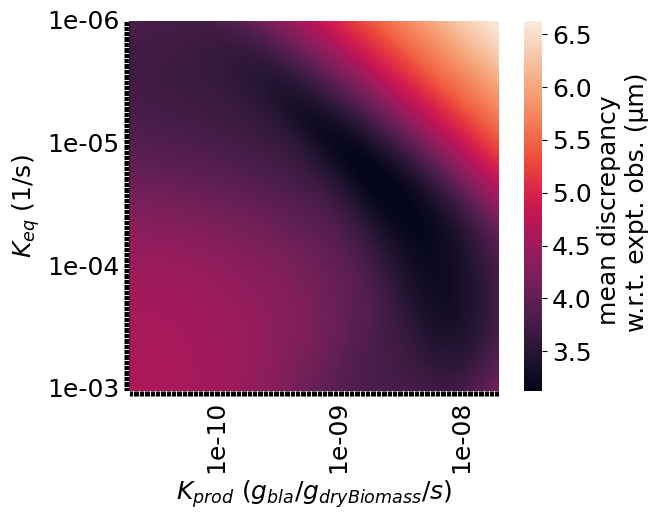

In [411]:
%matplotlib inline
simDiffDfWynton3=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_Kprodbla_Kdif_highRes/data.csv')
# simDiffDfWynton2=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDfSearchKprodblaKdif.csv')
simDiffDfWynton3['Kprod_bla']=2*simDiffDfWynton3['Kprod_bla']
simDiffDfWynton3=simDiffDfWynton3.sort_values(by=['Kprod_bla','Kdif'])
mat2=simDiffDfWynton3.groupby(['Kdif','Kprod_bla'])['diff'].min().unstack()
fig,ax=plt.subplots()
sns.heatmap(mat2,xticklabels=True,yticklabels=True,cbar_kws={'label': 'mean discrepancy \n w.r.t. expt. obs. (µm)'},ax=ax,square=True)
# g.set_yticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_yticklabels()])
# g.set_xticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_xticklabels()])
ax.set_xticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in ax.get_xticklabels()])
ax.set_yticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in ax.get_yticklabels()])
ax.set_ylabel('$K_{eq}$ (1/s)')
ax.set_xlabel('$K_{prodBla}$ (mg/mL)/(pg/µm$^2$)/s')
ax.set_xlabel('$K_{prod}$ ($g_{bla}/g_{dryBiomass}/s$)')
# [3.14244522e-09, 3.02015697e-05]
# ax.plot([3.14244522e-09], [3.02015697e-05], 'yo')

fig.savefig('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/KprodblaKdifSearchHighRes.pdf')
fig.savefig(os.path.join(savePath,'KprodblaKdifSearchHighRes.pdf'))

# mat2Df=simDiffDfWynton2.groupby(['Kdif','Kprod_bla'])['diff'].min()
# mat2Df[mat2Df<=mat2Df.min()*1.1].reset_index().describe()

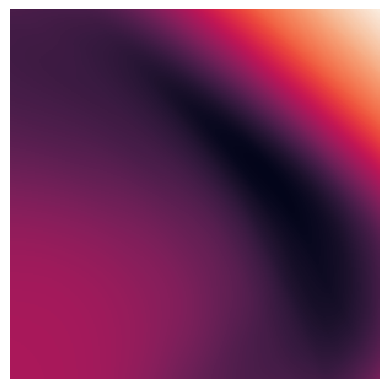

In [479]:
fig,ax=plt.subplots()
sns.heatmap(mat2,xticklabels=True,yticklabels=True,cbar=False,ax=ax,square=True)
# g.set_yticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_yticklabels()])
# g.set_xticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_xticklabels()])
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

fig.savefig(os.path.join(savePath,'KprodblaKdifSearchHighRes_mapOnly.png'), bbox_inches='tight', pad_inches=0)


,Kdif,Kprod_bla,diff
count,115.000000,1.150000e+02,115.000000
mean,0.000075,3.984035e-09,3.297784
std,0.000090,2.964046e-09,0.086417
min,0.000004,3.160000e-10,3.131102
25%,0.000014,1.425000e-09,3.231870
50%,0.000040,3.160000e-09,3.299545
75%,0.000100,6.320000e-09,3.364637
max,0.000398,1.262000e-08,3.443695


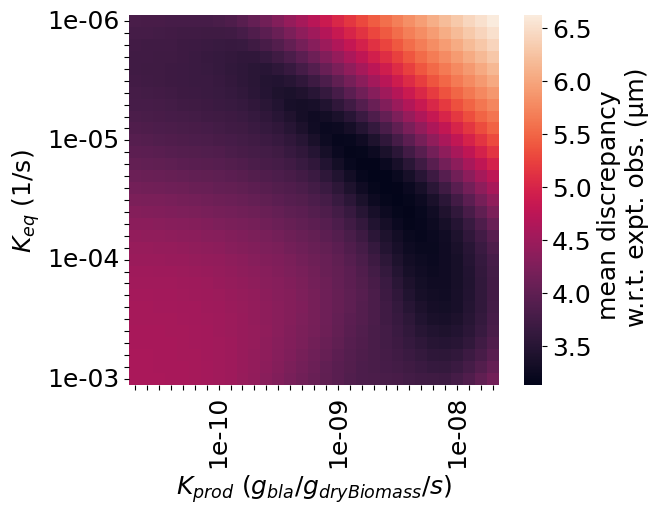

In [168]:
%matplotlib inline
simDiffDfWynton2=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_Kprodbla_Kdif/outDf.csv')
# simDiffDfWynton2=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDfSearchKprodblaKdif.csv')
simDiffDfWynton2['Kprod_bla']=2*simDiffDfWynton2['Kprod_bla']
mat2=simDiffDfWynton2.groupby(['Kdif','Kprod_bla'])['diff'].min().unstack()
fig,ax=plt.subplots()
sns.heatmap(mat2,xticklabels=True,yticklabels=True,cbar_kws={'label': 'mean discrepancy \n w.r.t. expt. obs. (µm)'},ax=ax,square=True)
# g.set_yticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_yticklabels()])
# g.set_xticklabels([label.get_text() if label.get_text().startswith('1e') else '' for label in g.get_xticklabels()])
ax.set_xticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in ax.get_xticklabels()])
ax.set_yticklabels(["%.0e" % float(label.get_text()) if ("%.2e" % float(label.get_text())).startswith('1.00e') else '' for label in ax.get_yticklabels()])
ax.set_ylabel('$K_{eq}$ (1/s)')
ax.set_xlabel('$K_{prodBla}$ (mg/mL)/(pg/µm$^2$)/s')
ax.set_xlabel('$K_{prod}$ ($g_{bla}/g_{dryBiomass}/s$)')
# [3.14244522e-09, 3.02015697e-05]
# ax.plot([3.14244522e-09], [3.02015697e-05], 'yo')

fig.savefig('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/KprodblaKdifSearch.pdf')
fig.savefig(os.path.join(savePath,'KprodblaKdifSearch.pdf'))

mat2Df=simDiffDfWynton2.groupby(['Kdif','Kprod_bla'])['diff'].min()
mat2Df[mat2Df<=mat2Df.min()*1.1].reset_index().describe()

In [210]:
simDiffDfWynton2[simDiffDfWynton2['diff']<=simDiffDfWynton2['diff'].min()+.02]

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h
5,0.000048,0.149,6.0,3.0,2.520000e-09,0.000025,0.0,3.136660,2.616844,4.181543
6,0.000048,0.149,6.0,3.0,2.520000e-09,0.000020,0.0,3.142006,2.616844,4.226182
111,0.000048,0.149,6.0,3.0,3.160000e-09,0.000025,0.0,3.150150,2.616844,4.217453
115,0.000048,0.149,6.0,3.0,3.160000e-09,0.000032,0.0,3.131102,2.616844,4.180216
236,0.000048,0.149,6.0,3.0,2.000000e-09,0.000020,0.0,3.144467,2.616844,4.195971
426,0.000048,0.149,6.0,3.0,4.000000e-09,0.000040,0.0,3.150798,2.616844,4.174516


In [203]:
np.sort(simDiffDfWynton2.Kprod_bla.unique())

array([2.000e-11, 2.520e-11, 3.160e-11, 4.000e-11, 5.020e-11, 6.320e-11,
       7.960e-11, 1.002e-10, 1.262e-10, 1.588e-10, 2.000e-10, 2.520e-10,
       3.160e-10, 4.000e-10, 5.020e-10, 6.320e-10, 7.960e-10, 1.002e-09,
       1.262e-09, 1.588e-09, 2.000e-09, 2.520e-09, 3.160e-09, 4.000e-09,
       5.020e-09, 6.320e-09, 7.960e-09, 1.002e-08, 1.262e-08, 1.588e-08,
       2.000e-08])

In [412]:
simParamSearchMetaDf

,muMax,Dbm,bmMax,initIllumBmMean,KprodBla,Kdif,Dbla,filename,0_diff,1_diff,...,990_diff0x,991_diff0x,992_diff0x,993_diff0x,994_diff0x,995_diff0x,996_diff0x,997_diff0x,998_diff0x,999_diff0x
0,4.8e-05,0.149,6.0,3.0,1.26e-09,0.000126,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.905088,4.667988,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
1,4.8e-05,0.149,6.0,3.0,1.26e-09,0.000158,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.950167,4.714194,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
2,4.8e-05,0.149,6.0,3.0,1.26e-09,0.0001,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.842370,4.601359,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
3,4.8e-05,0.149,6.0,3.0,1.26e-09,0.000251,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,5.007528,4.759648,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
4,4.8e-05,0.149,6.0,3.0,1.26e-09,0.0002,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.984806,4.744003,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
956,4.8e-05,0.149,6.0,3.0,7.94e-11,5.01e-06,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.931580,4.697943,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
957,4.8e-05,0.149,6.0,3.0,7.94e-11,6.31e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,5.350908,5.208829,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
958,4.8e-05,0.149,6.0,3.0,7.94e-11,6.31e-06,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4.930089,4.729795,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215
959,4.8e-05,0.149,6.0,3.0,7.94e-11,7.94e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,5.391401,5.247913,...,4.080707,4.228334,4.234155,3.879308,4.083117,3.896754,4.133962,4.037841,3.769457,3.967215


In [427]:
simParamSearchDfFiles=glob('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs/*.csv.gz')

simParamSearchMetaDf=pd.DataFrame([[string for string in re.split('_|=',os.path.basename(simParamSearchDfFile)) if re.match('^[0-9]',string)] for simParamSearchDfFile in simParamSearchDfFiles],
                                 columns=['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla'])
simParamSearchMetaDf['filename']=simParamSearchDfFiles
simParamSearchMetaDfNonRand=simParamSearchMetaDf.copy()
simParamSearchMetaDfNonRand2=simParamSearchMetaDf.copy()
simParamSearchDfFile=simParamSearchDfFiles[0]

def getDiffs(simParamSearchDfFile,simRedShift0xDf=randSimRedShift0xDf,simGreenShift0xDf=randSimGreenShift0xDf,simRedShiftDf=randSimRedShiftDf,simGreenShiftDf=randSimGreenShiftDf):
    simParamSearchDf=pd.read_csv(simParamSearchDfFile,index_col=0)
    simParamSearchDf=simParamSearchDf[simParamSearchDf.expt=='simulation']
    
    gfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    gfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    
    rfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    rfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    
    diff0x=.5*(pd.DataFrame(np.abs(simRedShift0xDf.values-rfpShifts0x.values)).mean()+pd.DataFrame(np.abs(simGreenShift0xDf.values-gfpShifts0x.values)).mean()).values
    diff=.5*(pd.DataFrame(np.abs(simRedShiftDf.values-rfpShifts.values)).mean()+pd.DataFrame(np.abs(simGreenShiftDf.values-gfpShifts.values)).mean()).values
    return np.concatenate((diff,diff0x))


simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
simParamSearchMetaDf=simParamSearchMetaDf.set_index(['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla','filename'])
simParamSearchMinsDf=(simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' not in col]]==simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' not in col]].min()).sum(axis=1)
simParamSearchMinsDf=simParamSearchMinsDf[simParamSearchMinsDf>0].reset_index().rename(columns={0:'count'})

simParamSearchMinsDf

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4262851071.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4262851071.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[ge

,muMax,Dbm,bmMax,initIllumBmMean,KprodBla,Kdif,Dbla,filename,count
0,4.8e-05,0.149,6.0,3.0,1.0233e-09,1.8621e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
1,4.8e-05,0.149,6.0,3.0,1.0233e-09,1.9055e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
2,4.8e-05,0.149,6.0,3.0,1.0233e-09,2.0893e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
3,4.8e-05,0.149,6.0,3.0,1.0233e-09,2.1878e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
4,4.8e-05,0.149,6.0,3.0,1.0233e-09,2.2909e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,2
...,...,...,...,...,...,...,...,...,...
226,4.8e-05,0.149,6.0,3.0,9.5499e-10,1.9953e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,2
227,4.8e-05,0.149,6.0,3.0,9.5499e-10,2.0417e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
228,4.8e-05,0.149,6.0,3.0,9.5499e-10,2.1878e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1
229,4.8e-05,0.149,6.0,3.0,9.7724e-10,2.0417e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmM...,1


In [430]:
simParamSearchMetaDf.to_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_Kprodbla_Kdif_highRes/simParamSearchMetaDf.csv.gz')

In [439]:
simParamSearchMetaDf

0_diff  \
muMax   Dbm   bmMax initIllumBmMean KprodBla   Kdif       Dbla filename                                                                                                         
4.8e-05 0.149 6.0   3.0             1.0233e-09 0.00010233 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.943960   
                                               0.00010471 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.949096   
                                               0.00010715 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.954111   
                                               0.00010965 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.959125   
                                               0.0001122  0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.963990   
...                                                                                                                                                                       ...   
                                    9.7724e-11 9.3325e-06 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.930288   
                                               9.5499e-05 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  5.399990   
                                               9.5499e-06 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.931844   
                                               9.7724e-05 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  5.403126   
                                               9.7724e-06 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.933281   

                                                                                                                                                                       1_diff  \
muMax   Dbm   bmMax initIllumBmMean KprodBla   Kdif       Dbla filename                                                                                                         
4.8e-05 0.149 6.0   3.0             1.0233e-09 0.00010233 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.733166   
                                               0.00010471 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.738769   
                                               0.00010715 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.744245   
                                               0.00010965 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.749663   
                                               0.0001122  0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.754898   
...                                                                                                                                                                       ...   
                                    9.7724e-11 9.3325e-06 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  4.771198   
                                               9.5499e-05 0.0  C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/dfs\muMax=4.8e-05_D_bm=0.149_bmMa...  5.259792   
                                               9.5499e-06 0.0  C:/Users/Xiaofan/Google Drive/St

In [413]:
simParamSearchDfFiles=glob('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/search_Kprodbla_Kdif/dfs/*.csv')

simParamSearchMetaDf=pd.DataFrame([[string for string in re.split('_|=',os.path.basename(simParamSearchDfFile)) if re.match('^[0-9]',string)] for simParamSearchDfFile in simParamSearchDfFiles],
                                 columns=['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla'])
simParamSearchMetaDf['filename']=simParamSearchDfFiles
simParamSearchMetaDfNonRand=simParamSearchMetaDf.copy()
simParamSearchMetaDfNonRand2=simParamSearchMetaDf.copy()
simParamSearchDfFile=simParamSearchDfFiles[0]

def getDiffs(simParamSearchDfFile,simRedShift0xDf=randSimRedShift0xDf,simGreenShift0xDf=randSimGreenShift0xDf,simRedShiftDf=randSimRedShiftDf,simGreenShiftDf=randSimGreenShiftDf):
    simParamSearchDf=pd.read_csv(simParamSearchDfFile,index_col=0)
    simParamSearchDf=simParamSearchDf[simParamSearchDf.expt=='simulation']
    
    gfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    gfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['GFP shift (μm)']]
    
    rfpShifts=simParamSearchDf.sort_values(by=['cond','rep','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    rfpShifts0x=simParamSearchDf[simParamSearchDf.cond=='0x'].sort_values(by=['cond','time (h)','position (μm)']).set_index(['cond','time (h)','position (μm)'])[['RFP shift (μm)']]
    
    diff0x=.5*(pd.DataFrame(np.abs(simRedShift0xDf.values-rfpShifts0x.values)).mean()+pd.DataFrame(np.abs(simGreenShift0xDf.values-gfpShifts0x.values)).mean()).values
    diff=.5*(pd.DataFrame(np.abs(simRedShiftDf.values-rfpShifts.values)).mean()+pd.DataFrame(np.abs(simGreenShiftDf.values-gfpShifts.values)).mean()).values
    return np.concatenate((diff,diff0x))


simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
simParamSearchMetaDf=simParamSearchMetaDf.set_index(['muMax','Dbm','bmMax','initIllumBmMean','KprodBla','Kdif','Dbla','filename'])
simParamSearchMinsDf=(simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' not in col]]==simParamSearchMetaDf[[col for col in simParamSearchMetaDf.columns if 'diff0x' not in col]].min()).sum(axis=1)
simParamSearchMinsDf=simParamSearchMinsDf[simParamSearchMinsDf>0].reset_index().rename(columns={0:'count'})

simParamSearchMinsDf

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4055738729.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[getDiffs(simParamSearchDfFile) for simParamSearchDfFile in simParamSearchDfFiles]
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4055738729.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  simParamSearchMetaDf[[f'{col}_{suff}' for suff in ['diff','diff0x'] for col in randSimRedShift0xDf.columns]]=[ge

,muMax,Dbm,bmMax,initIllumBmMean,KprodBla,Kdif,Dbla,filename,count
0,4.8e-05,0.149,6.0,3.0,1.26e-09,2.51e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,359
1,4.8e-05,0.149,6.0,3.0,1.26e-09,2e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,93
2,4.8e-05,0.149,6.0,3.0,1.26e-09,3.16e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,1
3,4.8e-05,0.149,6.0,3.0,1.58e-09,2.51e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,32
4,4.8e-05,0.149,6.0,3.0,1.58e-09,3.16e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,462
5,4.8e-05,0.149,6.0,3.0,1e-09,1.58e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,1
6,4.8e-05,0.149,6.0,3.0,1e-09,2.51e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,4
7,4.8e-05,0.149,6.0,3.0,1e-09,2e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,39
8,4.8e-05,0.149,6.0,3.0,2e-09,3.98e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,3
9,4.8e-05,0.149,6.0,3.0,2e-09,5.01e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,1


In [39]:
simParamSearchMetaDf=simParamSearchMetaDf.reset_index()
np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[f"0_diff"].astype(float)))

array([2.26273013e-05, 1.14907355e-09])

In [393]:
simParamSearchMetaDf

,muMax,Dbm,bmMax,initIllumBmMean,KprodBla,Kdif,Dbla,filename,0_diff,1_diff,...,990_diff0x,991_diff0x,992_diff0x,993_diff0x,994_diff0x,995_diff0x,996_diff0x,997_diff0x,998_diff0x,999_diff0x
0,4.8e-05,0.0102,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,7.025314,7.031054,...,9.448041,9.821845,9.100960,8.968141,9.172839,9.510384,8.474070,8.837273,9.290916,9.475484
1,4.8e-05,0.0105,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,7.008483,7.013736,...,9.415609,9.791044,9.070111,8.936551,9.140334,9.478234,8.442814,8.805437,9.259329,9.443617
2,4.8e-05,0.0107,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,6.997327,7.002253,...,9.394058,9.770587,9.049615,8.915570,9.118730,9.456875,8.422049,8.784288,9.238342,9.422440
3,4.8e-05,0.0112,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,6.969776,6.973804,...,9.340819,9.719936,8.998866,8.863613,9.065251,9.404211,8.370626,8.731915,9.186397,9.370032
4,4.8e-05,0.0115,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,6.953440,6.956939,...,9.309307,9.689849,8.968724,8.832750,9.033495,9.373045,8.340080,8.700806,9.155550,9.338916
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,4.8e-05,0.912,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,51.043885,50.908084,...,50.200286,50.372015,50.479377,50.759777,50.319339,50.179986,51.135191,50.823873,50.332833,50.278132
197,4.8e-05,0.933,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,52.324200,52.185218,...,51.452787,51.624517,51.731878,52.012279,51.571841,51.432488,52.387692,52.076375,51.585334,51.530633
198,4.8e-05,0.955,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,53.646146,53.504672,...,52.748459,52.920189,53.027550,53.307951,52.867513,52.728160,53.683364,53.372047,52.881006,52.826305
199,4.8e-05,0.977,6.0,3.0,1.13e-09,2.36e-05,0.0,C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantificatio...,54.951012,54.807011,...,54.027265,54.198994,54.306356,54.586756,54.146318,54.006965,54.962170,54.650852,54.159812,54.105111


In [250]:
# for function in ['multiquadric','inverse','gaussian','linear','cubic','quintic','thin_plate']:
for function in ['cubic']:
    print(function)
    for ind in range(10):
        diff=f"{ind}_diff"
        print(ind)
        print(np.power(10,getRbfMin(np.round(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),2),np.round(np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),2),y=simParamSearchMetaDf[diff].astype(float),function=function)))
        print(np.power(10,getRbfMin(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))
        print(np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))

# 'multiquadric': sqrt((r/self.epsilon)**2 + 1)
# 'inverse': 1.0/sqrt((r/self.epsilon)**2 + 1)
# 'gaussian': exp(-(r/self.epsilon)**2)
# 'linear': r
# 'cubic': r**3
# 'quintic': r**5
# 'thin_plate': r**2 * log(r)

multiquadric
0
[2.93399182e-05 1.51092980e-09]
[2.93651706e-05 1.51367854e-09]
[2.26142348e-05 1.15110034e-09]
1
[2.37474732e-05 1.18896012e-09]
[2.38604630e-05 1.19175882e-09]
[2.38604867e-05 1.19175962e-09]
2
[1.90622117e-05 8.52077635e-10]
[1.89786702e-05 8.47558592e-10]
[1.55245116e-05 6.83504797e-10]
3
[2.40628357e-05 1.18703942e-09]
[2.41398002e-05 1.18801649e-09]
[1.89586631e-05 9.41254240e-10]
4
[2.24012248e-05 1.19992003e-09]
[2.23941959e-05 1.19705943e-09]
[3.03582020e-05 1.55874646e-09]
5
[2.99330181e-05 1.57290003e-09]
[2.99469571e-05 1.57571013e-09]
[2.99469821e-05 1.57570909e-09]
6
[2.27557124e-05 1.20897544e-09]
[2.27634670e-05 1.20590301e-09]
[1.80725457e-05 9.56465912e-10]
7
[1.77128594e-05 9.43938120e-10]
[2.20241509e-05 1.19174648e-09]
[1.77246430e-05 9.45949563e-10]
8
[2.21526196e-05 1.19769243e-09]
[2.21069497e-05 1.19288011e-09]
[2.21069761e-05 1.19288255e-09]
9
[2.91871066e-05 1.56796589e-09]
[2.92983114e-05 1.57475741e-09]
[2.92980752e-05 1.57475321e-09]
inverse

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4052100368.py:6: RuntimeWarning: overflow encountered in power
  print(np.power(10,getRbfMin(np.round(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),2),np.round(np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),2),y=simParamSearchMetaDf[diff].astype(float),function=function)))
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4052100368.py:7: RuntimeWarning: overflow encountered in power
  print(np.power(10,getRbfMin(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\4052100368.py:8: RuntimeWarning: overflow encountered in exp
  print(np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))


[2.21191648e-05 1.19966568e-09]
[2.20954185e-05 1.19674820e-09]
[2.20954197e-05 1.19674830e-09]
9
[2.95656653e-05 1.57904561e-09]
[2.96266006e-05 1.58175552e-09]
[2.96266387e-05 1.58175487e-09]
gaussian
0
[2.24102070e-05 1.13650389e-09]
[1.18970212e-05 5.80252814e-10]
[1.18970431e-05 5.80253773e-10]
1
[1.86184557e-05 9.12137100e-10]
[1.79279976e-05 8.80195801e-10]
[6.54358668e-03 1.04551153e-05]
2
[1.86435581e-05 8.67772165e-10]
[1.1762605e-05 5.4937555e-10]
[1.17626190e-05 5.49377437e-10]
3
[1.82674313e-05 9.08306953e-10]
[1.17858695e-05 5.93568599e-10]
[1.17858652e-05 5.93568795e-10]
4
[1.78847281e-05 9.39398609e-10]
[2.80575530e-11 2.86901447e-03]
[1.23548769e-05 6.70914678e-10]
5
[1.78963027e-05 9.06564300e-10]
[1.77497203e-05 8.88520627e-10]
[1.17713508e-05 5.72196701e-10]
6
[1.78057902e-05 9.31510569e-10]
[1.23126124e-05 6.76522096e-10]
[1.23126115e-05 6.76521967e-10]
7
[2.72423794e-07 4.23960112e-09]
[3.84777352e-07 1.60072237e-09]
[1.16297918e-05 6.03166834e-10]
8
[1.78686111e-

In [440]:
# for function in ['multiquadric','inverse','gaussian','linear','cubic','quintic','thin_plate']:
for function in ['cubic']:
    print(function)
    for ind in range(10):
        diff=f"{ind}_diff"
        print(ind)
        print(np.power(10,getRbfMin(np.round(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),2),np.round(np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),2),y=simParamSearchMetaDf[diff].astype(float),function=function)))
        print(np.power(10,getRbfMin(np.log10(simParamSearchMetaDf['Kdif'].astype(float)),np.log10(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))
        print(np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[diff].astype(float),function=function)))

# 'multiquadric': sqrt((r/self.epsilon)**2 + 1)
# 'inverse': 1.0/sqrt((r/self.epsilon)**2 + 1)
# 'gaussian': exp(-(r/self.epsilon)**2)
# 'linear': r
# 'cubic': r**3
# 'quintic': r**5
# 'thin_plate': r**2 * log(r)

cubic
0


KeyError: 'Kdif'

In [118]:
np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['Kprod_bla'].astype(float)),y=simDiffDfWynton2["diff"].astype(float)))

0      -8.979229
1      -8.752916
2      -9.210340
3      -8.290058
4      -8.517193
         ...    
956   -12.204075
957    -9.670790
958   -11.973375
959    -9.441012
960   -11.743597
Name: Kdif, Length: 961, dtype: float64

In [395]:
if 'Kdif' not in simParamSearchMetaDf.columns:
    simParamSearchMetaDf=simParamSearchMetaDf.reset_index()
simParamRbfMinsDf=pd.DataFrame([np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[f"{ind}_diff"].astype(float))) for ind in range(numDraws)],
                              columns=['Kdif','KprodBla'])
print(np.quantile(simParamRbfMinsDf['Kdif'],[0.025,0.975]))
print(np.quantile(simParamRbfMinsDf['KprodBla'],[0.025,0.975]))
simParamRbfMinsDf

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\2357817748.py:3: RuntimeWarning: overflow encountered in exp
  simParamRbfMinsDf=pd.DataFrame([np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[f"{ind}_diff"].astype(float))) for ind in range(numDraws)],
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\2357817748.py:3: RuntimeWarning: overflow encountered in exp
  simParamRbfMinsDf=pd.DataFrame([np.exp(getRbfMin(np.log(simParamSearchMetaDf['Kdif'].astype(float)),np.log(simParamSearchMetaDf['KprodBla'].astype(float)),y=simParamSearchMetaDf[f"{ind}_diff"].astype(float))) for ind in range(numDraws)],


[1.68693290e-05 3.17346279e-05]
[8.78876629e-10 1.60569099e-09]


,Kdif,KprodBla
0,0.000023,1.149074e-09
1,0.000024,1.201274e-09
2,0.000015,6.846760e-10
3,0.000019,9.442760e-10
4,0.000022,1.196076e-09
...,...,...
995,0.000023,1.261207e-09
996,0.000031,1.565694e-09
997,0.000015,7.179142e-10
998,0.000024,1.341590e-09


In [459]:
def getRGImin(xcols,ycol,data):
    df=data.copy()
    for xcol in xcols:
        df[f"log_{xcol}"]=np.log(df[xcol])
    dfmat=df.sort_values(by=[f"log_{xcol}" for xcol in xcols]).set_index([f"log_{xcol}" for xcol in xcols])[ycol].unstack()
    interp=RegularGridInterpolator((np.asarray(dfmat.index),np.asarray(dfmat.columns)),dfmat.values,method='cubic', bounds_error=False,fill_value=None)
    try:
        return np.exp(minimize(lambda x: interp(x),x0=df[[f"log_{xcol}" for xcol in xcols]].mean()).x)
    except:
        return np.full(len(xcols), np.nan)
getRGImin(xcols=['Kprod_bla','Kdif'],ycol='diff',data=simDiffDfWynton3)

array([3.06988570e-09, 2.85586068e-05])

In [460]:
if 'Kdif' not in simParamSearchMetaDf.columns:
    simParamSearchMetaDf=simParamSearchMetaDf.reset_index()
simParamRbfMinsDf=pd.DataFrame([getRGImin(xcols=['Kdif','KprodBla'],ycol=f"{ind}_diff",data=simParamSearchMetaDf[['Kdif','KprodBla',f"{ind}_diff"]].astype(float)) for ind in range(numDraws)],
                              columns=['Kdif','KprodBla'])
print(np.nanquantile(simParamRbfMinsDf['Kdif'],[0.025,0.975]))
print(2*np.nanquantile(simParamRbfMinsDf['KprodBla'],[0.025,0.975]))
simParamRbfMinsDf

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\scipy\optimize\_numdiff.py:576: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\1837130055.py:8: RuntimeWarning: overflow encountered in exp
  return np.exp(minimize(lambda x: interp(x),x0=df[[f"log_{xcol}" for xcol in xcols]].mean()).x)


[1.95456126e-05 3.29875024e-05]
[1.92031931e-09 3.31708197e-09]


,Kdif,KprodBla
0,0.000021,1.022146e-09
1,0.000029,1.475739e-09
2,0.000020,8.754201e-10
3,0.000025,1.306468e-09
4,0.000027,1.464531e-09
...,...,...
995,0.000024,1.346339e-09
996,0.000027,1.446493e-09
997,0.000026,1.320514e-09
998,0.000024,1.380215e-09


In [396]:
simParamRbfMinsDf.describe()

,Kdif,KprodBla
count,1000.000000,1.000000e+03
mean,inf,inf
std,NaN,NaN
min,0.000014,6.846760e-10
25%,0.000022,1.172991e-09
50%,0.000023,1.223398e-09
75%,0.000028,1.511078e-09
max,inf,inf


In [44]:
g=sns.jointplot(x='Kdif',y='KprodBla',data=simParamRbfMinsDf,kind='hist')
g.savefig('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/KprodblaKdifMinRbfSearch.pdf')


In [456]:
simParamSearchMinsHistData=[int(count)*[float(KprodBla)] for KprodBla,count in zip(simParamSearchMinsDf.KprodBla,simParamSearchMinsDf['count'])]
simParamSearchMinsHistData=np.asarray([a for b in simParamSearchMinsHistData for a in b])
print(2*np.quantile(simParamSearchMinsHistData,[0.025,0.975]))

simParamSearchMinsHistData=[int(count)*[float(Kdif)] for Kdif,count in zip(simParamSearchMinsDf.Kdif,simParamSearchMinsDf['count'])]
simParamSearchMinsHistData=np.asarray([a for b in simParamSearchMinsHistData for a in b])
print(np.quantile(simParamSearchMinsHistData,[0.025,0.975]))

[2.0000e-09 3.3192e-09]
[1.9953e-05 3.3113e-05]


In [58]:
noiseThreshold=df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std().mean().mean()*1
simDiffDfWynton2[simDiffDfWynton2['diff']<simDiffDfWynton2['diff'].min()+noiseThreshold][['Kdif','Kprod_bla']].describe()

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_9904\2766523845.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  noiseThreshold=df.groupby(['expt','cond','time (h)','position (μm)'])['GFP shift (μm)','RFP shift (μm)'].std().mean().mean()*1


,Kdif,Kprod_bla
count,961.000000,9.610000e+02
mean,0.000157,3.133710e-09
std,0.000251,5.015786e-09
min,0.000001,2.000000e-11
25%,0.000005,1.002000e-10
50%,0.000032,6.320000e-10
75%,0.000200,4.000000e-09
max,0.001000,2.000000e-08


In [48]:
np.quantile(mat2,[.05,.95])

array([ 7.93334566, 12.92247432])

In [438]:
simDiffDfWynton3[simDiffDfWynton3['diff']==simDiffDfWynton3['diff'].min()]


,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h
1706,0.000048,0.149,6.0,3.0,3.097600e-09,0.000029,0.0,3.127058,2.616844,4.174643


In [433]:
def evalRbf(x,rbfFit):
    if x.ndim==1:
        x=np.expand_dims(x,axis=1)
    return rbfFit(x.T)
def getRbfMin2(x,y,function='cubic'):
    if x.ndim==1:
        x=np.expand_dims(x,axis=1)
    rbfFit=RBFInterpolator(x,y,kernel=function)

    # [:, np.newaxis]
    return minimize(lambda x: evalRbf(x,rbfFit=rbfFit),x0=np.mean(x,axis=0)).x


# aa=RBFInterpolator(np.expand_dims(simDiffDfWynton['D_bm'],axis=1),simDiffDfWynton['diff0x'],kernel='cubic')
# aa([[0.150],[.160]])
# minimize(lambda x: aa([x]),x0=[.15]).x
print(getRbfMin2(simDiffDfWynton['D_bm'],y=simDiffDfWynton['diff0x'],function='cubic'))


print(np.exp(getRbfMin2(np.log(simDiffDfWynton2[['Kdif','Kprod_bla']].astype(float)),y=simDiffDfWynton2['diff'].astype(float),function='cubic')))
print(np.exp(getRbfMin2(np.round(np.log(simDiffDfWynton2[['Kdif','Kprod_bla']].astype(float)),2),y=simDiffDfWynton2['diff'].astype(float),function='cubic')))
print(np.power(10,getRbfMin2(np.round(np.log10(simDiffDfWynton2[['Kdif','Kprod_bla']].astype(float)),2),y=simDiffDfWynton2['diff'].astype(float),function='cubic')))

print(np.exp(getRbfMin2(np.log(simDiffDfWynton3[['Kdif','Kprod_bla']].astype(float)),y=simDiffDfWynton3['diff'].astype(float),function='cubic')))
print(np.exp(getRbfMin2(np.round(np.log(simDiffDfWynton3[['Kdif','Kprod_bla']].astype(float)),2),y=simDiffDfWynton3['diff'].astype(float),function='cubic')))
print(np.power(10,getRbfMin2(np.round(np.log10(simDiffDfWynton3[['Kdif','Kprod_bla']].astype(float)),2),y=simDiffDfWynton3['diff'].astype(float),function='cubic')))


[0.14867334]
[2.19973198e-05 2.42637211e-09]
[2.21028561e-05 2.43378329e-09]
[3.02013339e-05 3.14242677e-09]


MemoryError: (unable to allocate 18446744073328701840 bytes)

In [448]:
aa=simDiffDfWynton3.copy()
aa['logKprod_bla']=np.log10(aa.Kprod_bla)
aa['logKdif']=np.log10(aa.Kdif)
# aa['logKprod_bla']=np.log(aa.Kprod_bla)
# aa['logKdif']=np.log(aa.Kdif)
aamat=aa.sort_values(by=['Kprod_bla','Kdif']).set_index(['logKprod_bla','logKdif'])['diff'].unstack()
aa
interp=RegularGridInterpolator((np.asarray(aamat.index),np.asarray(aamat.columns)),aamat.values,method='cubic', bounds_error=False,fill_value=None)
print(minimize(lambda x: interp(x),x0=aa[['logKprod_bla','logKdif']].mean()).x)
np.power(10,minimize(lambda x: interp(x),x0=aa[['logKprod_bla','logKdif']].mean()).x)
# np.exp(minimize(lambda x: interp(x),x0=aa[['logKprod_bla','logKdif']].mean()).x)



[-8.50218926 -4.52568073]


array([3.06988570e-09, 2.85586068e-05])

In [437]:
aamat

logKdif,-6.000000,-5.989997,-5.980012,-5.970008,-5.959991,-5.950007,-5.939982,-5.929999,-5.919987,-5.909989,...,-3.090000,-3.080002,-3.069999,-3.060002,-3.050000,-3.040000,-3.030002,-3.020001,-3.009999,-3.000000
logKprod_bla,,,,,,,,,,,,,,,,,,,,,
-10.698970,3.801960,3.797520,3.793118,3.788921,3.785016,3.781286,3.777496,3.773604,3.769691,3.765693,...,4.596873,4.597160,4.597452,4.597724,4.597993,4.598242,4.598489,4.598717,4.598937,4.599167
-10.688967,3.801649,3.797240,3.792929,3.788792,3.784941,3.781250,3.777496,3.773646,3.769776,3.765826,...,4.596596,4.596878,4.597169,4.597440,4.597706,4.597951,4.598198,4.598426,4.598644,4.598875
-10.678982,3.801264,3.796913,3.792682,3.788619,3.784822,3.781169,3.777447,3.773644,3.769823,3.765918,...,4.596310,4.596590,4.596876,4.597142,4.597409,4.597656,4.597899,4.598126,4.598342,4.598565
-10.668978,3.800827,3.796519,3.792393,3.788398,3.784645,3.781039,3.777353,3.773590,3.769819,3.765965,...,4.596007,4.596288,4.596571,4.596836,4.597098,4.597343,4.597588,4.597814,4.598034,4.598256
-10.658961,3.800331,3.796068,3.792038,3.788126,3.784420,3.780864,3.777214,3.773487,3.769762,3.765956,...,4.595701,4.595976,4.596256,4.596521,4.596787,4.597034,4.597275,4.597503,4.597721,4.597946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
-7.738970,6.581132,6.570601,6.560027,6.549443,6.538763,6.528084,6.517317,6.506562,6.495722,6.484812,...,3.980619,3.990733,4.001314,4.012069,4.022968,4.033941,4.045137,4.056612,4.068246,4.079907
-7.728972,6.590914,6.580339,6.569804,6.559224,6.548596,6.537955,6.527232,6.516522,6.505720,6.494883,...,3.996417,4.006957,4.017670,4.028519,4.039472,4.050704,4.062226,4.073706,4.085170,4.096700
-7.718971,6.600716,6.590133,6.579576,6.568988,6.558403,6.547815,6.537117,6.526440,6.515697,6.504906,...,4.012842,4.023481,4.034288,4.045274,4.056632,4.068112,4.079552,4.090992,4.102435,4.113934


In [294]:
rbfDf=simDiffDfWynton2.copy()
rbfDf['logKprod_bla']=np.log10(rbfDf.Kprod_bla)
rbfDf['logKdif']=np.log10(rbfDf.Kdif)
rbfDf['logKprod_bla']=np.log10(rbfDf.Kprod_bla)
rbfDf['logKdif']=np.log10(rbfDf.Kdif)
rbfDf['logKprod_bla2']=np.round(np.log10(rbfDf.Kprod_bla),2)
rbfDf['logKdif2']=np.round(np.log10(rbfDf.Kdif),2)
rbfDf['logKprod_bla20']=np.round(np.log10(rbfDf.Kprod_bla),20)
rbfDf['logKdif20']=np.round(np.log10(rbfDf.Kdif),20)
rbfDf.sort_values(by='diff').head()
rbfFit2=Rbf(rbfDf.logKprod_bla2,rbfDf.logKdif2,rbfDf['diff'],function='cubic')
rbfFit20=Rbf(rbfDf.logKprod_bla20,rbfDf.logKdif20,rbfDf['diff'],function='cubic')
print(minimize(lambda xy: rbfFit2(*xy),x0=[rbfDf.logKprod_bla2.mean(),rbfDf.logKdif2.mean()]).x)
print(minimize(lambda xy: rbfFit20(*xy),x0=[rbfDf.logKprod_bla20.mean(),rbfDf.logKdif20.mean()]).x)
print(np.power(10,minimize(lambda xy: rbfFit2(*xy),x0=[rbfDf.logKprod_bla2.mean(),rbfDf.logKdif2.mean()]).x))
print(np.power(10,minimize(lambda xy: rbfFit20(*xy),x0=[rbfDf.logKprod_bla2.mean(),rbfDf.logKdif2.mean()]).x))
# # np.power(10,minimize(lambda xy: rbfFit(*xy),x0=[rbfDf.logKprod_bla.mean(),rbfDf.logKdif.mean()]).x)

[-8.50273228 -4.51997048]
[-8.61503728 -4.65762502]
[3.14244522e-09 3.02015697e-05]
[2.42637328e-09 2.19973871e-05]


In [305]:
aa[aa.diff20<=aa.diff20.min()+.001]

,0,1,diff2,diff20
62742,-8.62,-4.66,3.129933,3.130249
63043,-8.61,-4.66,3.130019,3.130361
63044,-8.61,-4.65,3.129939,3.130307
66066,-8.51,-4.53,3.129763,3.129761
66067,-8.51,-4.52,3.129799,3.129870
66367,-8.50,-4.53,3.130055,3.129848
66368,-8.50,-4.52,3.129496,3.129368
66369,-8.50,-4.51,3.129792,3.129746
66669,-8.49,-4.52,3.130553,3.130208
66670,-8.49,-4.51,3.130336,3.130083


<Axes: xlabel='0', ylabel='1'>

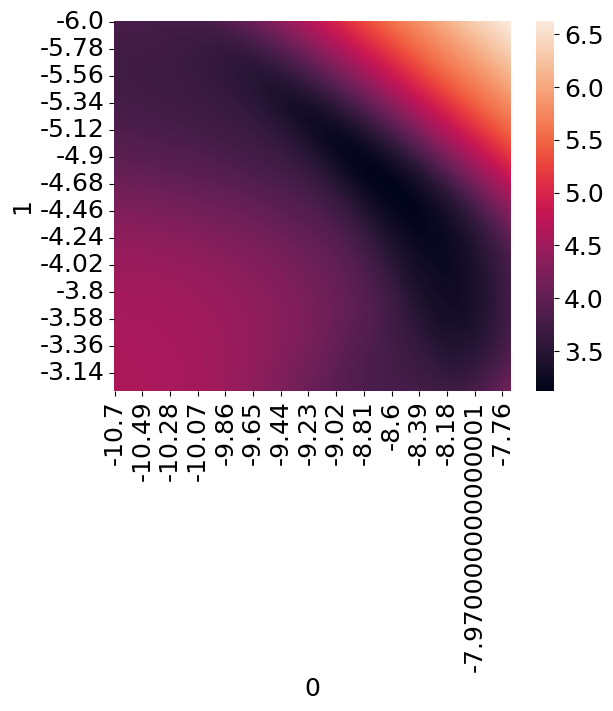

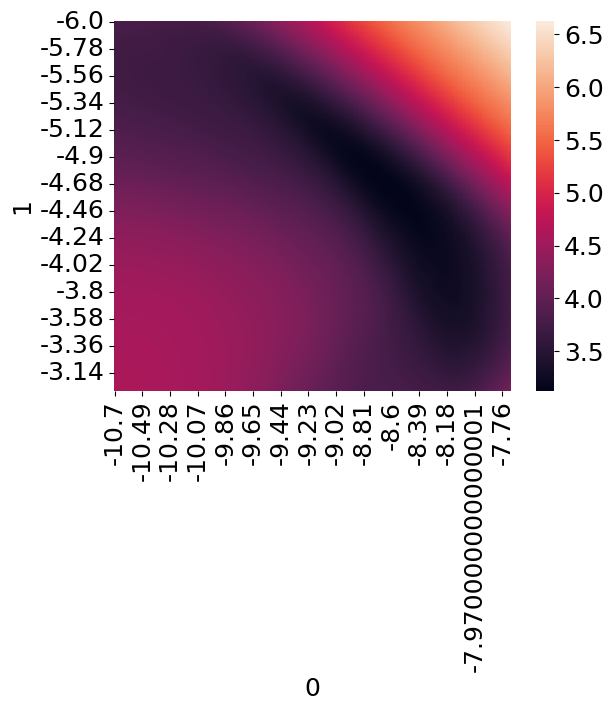

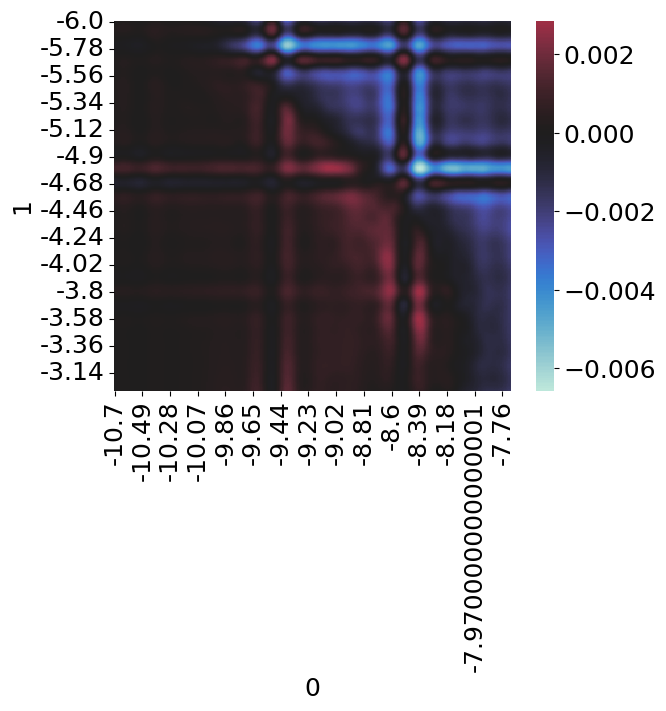

In [296]:
aa=pd.DataFrame([(a,b) for a in np.linspace(-10.7,-7.7,301) for b in np.linspace(-6,-3,301)])

aa['diff2']=rbfFit2(aa[0],aa[1])
aa['diff20']=rbfFit20(aa[0],aa[1])
plt.figure()
sns.heatmap(aa.set_index([0,1])['diff20'].unstack().T)
plt.figure()
sns.heatmap(aa.set_index([0,1])['diff2'].unstack().T)
plt.figure()

sns.heatmap(aa.set_index([0,1])['diff20'].unstack().T-aa.set_index([0,1])['diff2'].unstack().T,center=0)

<Axes: xlabel='0', ylabel='1'>

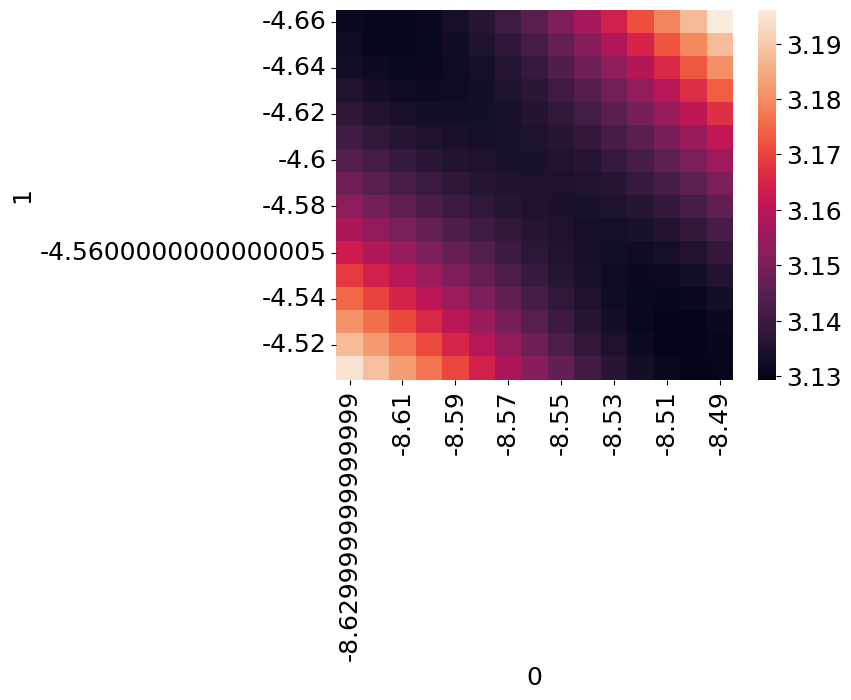

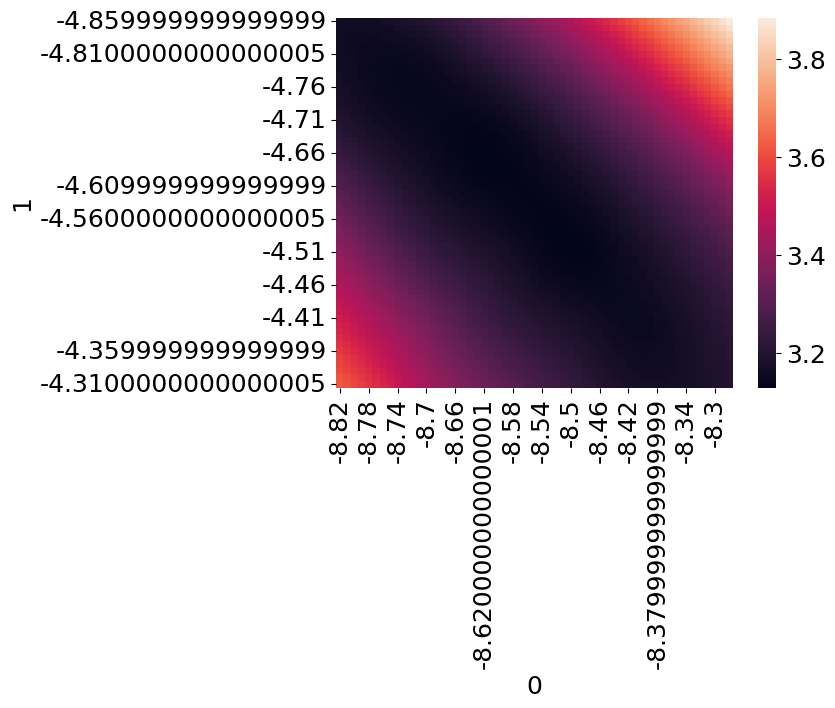

In [307]:
plt.figure()
sns.heatmap(aa[(aa[0]>-8.63)&(aa[0]<-8.48)&(aa[1]<-4.5)&(aa[1]>-4.67)].set_index([0,1])['diff20'].unstack().T)
plt.figure()
sns.heatmap(aa[(aa[0]>-8.83)&(aa[0]<-8.28)&(aa[1]<-4.3)&(aa[1]>-4.87)].set_index([0,1])['diff20'].unstack().T)

In [212]:
np.exp(getRbfMin(np.log(simDiffDfWynton2['Kdif'].astype(float)),np.log(simDiffDfWynton2['Kprod_bla'].astype(float)),y=simDiffDfWynton2["diff"].astype(float)))

array([2.19972063e-05, 2.42636303e-09])

In [213]:
np.power(10,getRbfMin(np.log10(simDiffDfWynton2['Kdif'].astype(float)),np.log10(simDiffDfWynton2['Kprod_bla'].astype(float)),y=simDiffDfWynton2["diff"].astype(float)))

array([2.19973557e-05, 2.42637876e-09])

In [216]:
np.power(10,getRbfMin(np.round(np.log10(simDiffDfWynton2['Kdif'].astype(float)),2),np.round(np.log10(simDiffDfWynton2['Kprod_bla'].astype(float)),2),y=simDiffDfWynton2["diff"].astype(float)))

array([3.02015697e-05, 3.14244522e-09])

In [154]:
np.round(np.log10(simDiffDfWynton2['Kdif'].astype(float)),1)

0     -3.3
1     -3.1
2     -4.9
3     -4.8
4     -5.0
      ... 
956   -5.3
957   -4.2
958   -5.2
959   -4.1
960   -5.1
Name: Kdif, Length: 961, dtype: float64

In [59]:
simDiffDfWynton2.head()
rbfDf=simDiffDfWynton2.copy()
rbfDf['logKprod_bla']=np.round(np.log10(rbfDf.Kprod_bla),2)
rbfDf['logKdif']=np.round(np.log10(rbfDf.Kdif),2)
rbfDf['logKprod_bla2']=np.log10(rbfDf.Kprod_bla)
rbfDf['logKdif2']=np.log10(rbfDf.Kdif)
rbfDf.sort_values(by='diff').head(50)

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x,diff8h,logKprod_bla,logKdif,logKprod_bla2,logKdif2
115,0.000048,0.149,6.0,3.0,3.160000e-09,0.000032,0.0,3.131102,2.616844,4.180216,-8.5,-4.5,-8.500313,-4.500313
5,0.000048,0.149,6.0,3.0,2.520000e-09,0.000025,0.0,3.136660,2.616844,4.181543,-8.6,-4.6,-8.598599,-4.600326
6,0.000048,0.149,6.0,3.0,2.520000e-09,0.000020,0.0,3.142006,2.616844,4.226182,-8.6,-4.7,-8.598599,-4.698970
236,0.000048,0.149,6.0,3.0,2.000000e-09,0.000020,0.0,3.144467,2.616844,4.195971,-8.7,-4.7,-8.698970,-4.698970
111,0.000048,0.149,6.0,3.0,3.160000e-09,0.000025,0.0,3.150150,2.616844,4.217453,-8.5,-4.6,-8.500313,-4.600326
426,0.000048,0.149,6.0,3.0,4.000000e-09,0.000040,0.0,3.150798,2.616844,4.174516,-8.4,-4.4,-8.397940,-4.400117
912,0.000048,0.149,6.0,3.0,1.588000e-09,0.000016,0.0,3.154002,2.616844,4.218496,-8.8,-4.8,-8.799150,-4.801343
230,0.000048,0.149,6.0,3.0,2.000000e-09,0.000016,0.0,3.154198,2.616844,4.256100,-8.7,-4.8,-8.698970,-4.801343
428,0.000048,0.149,6.0,3.0,4.000000e-09,0.000050,0.0,3.170826,2.616844,4.229533,-8.4,-4.3,-8.397940,-4.300162
817,0.000048,0.149,6.0,3.0,1.262000e-09,0.000013,0.0,3.171533,2.616844,4.265626,-8.9,-4.9,-8.898941,-4.899629


In [50]:
rbfFit=Rbf(rbfDf.logKprod_bla,rbfDf.logKdif,rbfDf['diff'],function='cubic')
print(minimize(lambda xy: rbfFit(*xy),x0=[rbfDf.logKprod_bla.mean(),rbfDf.logKdif.mean()]).x)
np.power(10,minimize(lambda xy: rbfFit(*xy),x0=[rbfDf.logKprod_bla.mean(),rbfDf.logKdif.mean()]).x)

[-8.50273228 -4.51997048]


array([3.14244522e-09, 3.02015697e-05])

In [51]:
rbfFit=Rbf(rbfDf.logKprod_bla,rbfDf.logKdif,rbfDf['diff'],function='cubic')
np.power(10,minimize(lambda xy: rbfFit(*xy),x0=[rbfDf.logKprod_bla.mean(),rbfDf.logKdif.mean()]).x)

array([3.14244522e-09, 3.02015697e-05])

In [52]:
rbfFit=Rbf(rbfDf.Kprod_bla,rbfDf.Kdif,rbfDf['diff'],function='cubic')
minimize(lambda xy: rbfFit(*xy),x0=[rbfDf.Kprod_bla.mean(),rbfDf.Kdif.mean()]).x

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\scipy\interpolate\_rbf.py:268: LinAlgWarning: Ill-conditioned matrix (rcond=9.68485e-26): result may not be accurate.
  self.nodes = linalg.solve(self.A, self.di)


array([-19.49506608,  -8.35487164])

In [346]:
simDiffDfWynton.sort_values(by=['diff0x','diff']).drop_duplicates(subset='diff0x')

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x
16438,0.000048,0.15,6.0,3.0,2.200000e-09,0.000032,0.000,3403.094219,505.420702
29649,0.000048,0.15,6.0,3.0,2.200000e-09,0.000100,0.010,3419.305005,505.420702
8797,0.000048,0.15,6.0,3.0,2.200000e-09,0.000100,0.000,3418.761685,505.420702
59387,0.000048,0.20,6.0,2.4,7.000000e-11,0.000032,0.010,3963.362071,512.285171
17400,0.000048,0.20,6.0,2.4,7.000000e-11,0.000032,0.000,3961.552151,512.285171
2881,0.000048,0.20,6.0,2.4,7.000000e-11,0.000032,0.100,3974.877910,512.285172
56109,0.000048,0.15,3.0,1.4,2.200000e-09,0.000032,0.032,3305.591156,516.153732
76338,0.000048,0.15,3.0,1.4,2.200000e-09,0.000032,0.100,3317.251330,516.153732
39373,0.000048,0.15,3.0,1.4,2.200000e-09,0.000032,0.010,3306.203643,516.153732
6444,0.000048,0.15,4.0,1.8,7.000000e-09,0.000100,0.000,3370.743240,517.978553


In [345]:
simDiffDfWynton[(simDiffDfWynton['D_bla']==0)&(simDiffDfWynton['diff']<3100)].sort_values(by=['diff0x','diff']).drop_duplicates(subset='diff0x')

,muMax,D_bm,bmMax,initIllumBmMean,Kprod_bla,Kdif,D_bla,diff,diff0x
12345,0.000048,0.125,2.0,1.0,7.000000e-09,0.000032,0.0,3065.043584,523.832984
7698,0.000048,0.125,4.0,2.0,2.200000e-09,0.000032,0.0,3074.734187,524.133345
53192,0.000048,0.125,5.0,2.5,2.200000e-09,0.000032,0.0,3048.399849,524.373087
36889,0.000048,0.125,6.0,3.0,2.200000e-09,0.000032,0.0,3083.698373,552.244265
98365,0.000066,0.050,2.0,0.9,7.000000e-09,0.000032,0.0,3043.561127,560.028825
161439,0.000066,0.075,3.0,1.0,2.200000e-09,0.000010,0.0,3089.099860,564.173677
60354,0.000048,0.125,2.0,0.9,2.200000e-09,0.000010,0.0,3015.642820,565.051346
21495,0.000048,0.125,5.0,2.2,7.000000e-10,0.000010,0.0,3079.428640,577.984697
9419,0.000048,0.100,2.0,1.0,2.200000e-09,0.000010,0.0,3035.326705,593.214870
9036,0.000048,0.100,2.0,1.0,7.000000e-09,0.000032,0.0,3003.865667,593.214870


In [66]:
np.power(10,(np.linspace(-5.5,-3.5,101)))

array([3.16227766e-06, 3.31131121e-06, 3.46736850e-06, 3.63078055e-06,
       3.80189396e-06, 3.98107171e-06, 4.16869383e-06, 4.36515832e-06,
       4.57088190e-06, 4.78630092e-06, 5.01187234e-06, 5.24807460e-06,
       5.49540874e-06, 5.75439937e-06, 6.02559586e-06, 6.30957344e-06,
       6.60693448e-06, 6.91830971e-06, 7.24435960e-06, 7.58577575e-06,
       7.94328235e-06, 8.31763771e-06, 8.70963590e-06, 9.12010839e-06,
       9.54992586e-06, 1.00000000e-05, 1.04712855e-05, 1.09647820e-05,
       1.14815362e-05, 1.20226443e-05, 1.25892541e-05, 1.31825674e-05,
       1.38038426e-05, 1.44543977e-05, 1.51356125e-05, 1.58489319e-05,
       1.65958691e-05, 1.73780083e-05, 1.81970086e-05, 1.90546072e-05,
       1.99526231e-05, 2.08929613e-05, 2.18776162e-05, 2.29086765e-05,
       2.39883292e-05, 2.51188643e-05, 2.63026799e-05, 2.75422870e-05,
       2.88403150e-05, 3.01995172e-05, 3.16227766e-05, 3.31131121e-05,
       3.46736850e-05, 3.63078055e-05, 3.80189396e-05, 3.98107171e-05,
      

,logD_bm,diff0x,D_bm
0,-2.0,1446.36366,0.010000
756,-1.9,1402.03186,0.012589
1531,-1.8,1350.78711,0.015849
2621,-1.7,1289.86613,0.019953
3709,-1.6,1221.76956,0.025119
4513,-1.5,1142.35138,0.031623
5598,-1.4,1053.41710,0.039811
6394,-1.3,960.37599,0.050119
7505,-1.2,862.60590,0.063096
8533,-1.1,754.40495,0.079433


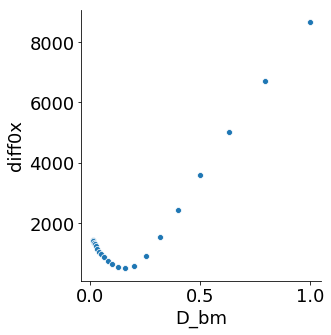

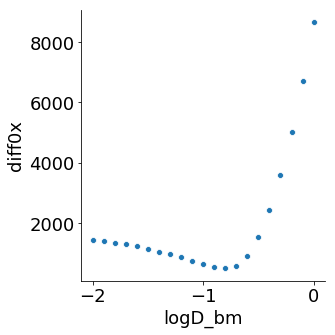

In [141]:
simDiffDfWynton3=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/outDfSearch3.csv')

rbfDf=simDiffDfWynton3.copy()
rbfDf['logKprod_bla']=np.round(np.log10(rbfDf.Kprod_bla),2)
rbfDf['logKdif']=np.round(np.log10(rbfDf.Kdif),2)
rbfDf['logD_bm']=np.round(np.log10(rbfDf.D_bm),2)
rbfDf['diff0x']=np.round(rbfDf.diff0x,5)
rbfDf=rbfDf[['logD_bm','diff0x']].drop_duplicates()
rbfDf['D_bm']=np.power(10,rbfDf['logD_bm'])
sns.relplot(x='D_bm',y='diff0x',data=rbfDf.reset_index(drop=True))
sns.relplot(x='logD_bm',y='diff0x',data=rbfDf.reset_index(drop=True))
rbfDf


In [28]:
rbfFit=Rbf(rbfDf['logD_bm'],rbfDf['diff0x'],function='cubic')
minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['logD_bm'].mean()])

rbfFit=Rbf(rbfDf['D_bm'],rbfDf['diff0x'],function='cubic')
minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['D_bm'].mean()])

      fun: 498.16518790874807
 hess_inv: array([[8.53023825e-05]])
      jac: array([6.10351562e-05])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 98
      nit: 8
     njev: 29
   status: 2
  success: False
        x: array([-0.78510427])

In [27]:
rbfFit=Rbf(rbfDf['D_bm'],rbfDf['diff0x'],function='cubic')
minimize(lambda xy: rbfFit(*xy),x0=[rbfDf['D_bm'].mean()])

      fun: 498.58617335279996
 hess_inv: array([[1.71540428e-05]])
      jac: array([0.00146484])
  message: 'Desired error not necessarily achieved due to precision loss.'
     nfev: 183
      nit: 6
     njev: 57
   status: 2
  success: False
        x: array([0.16287235])

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information. 

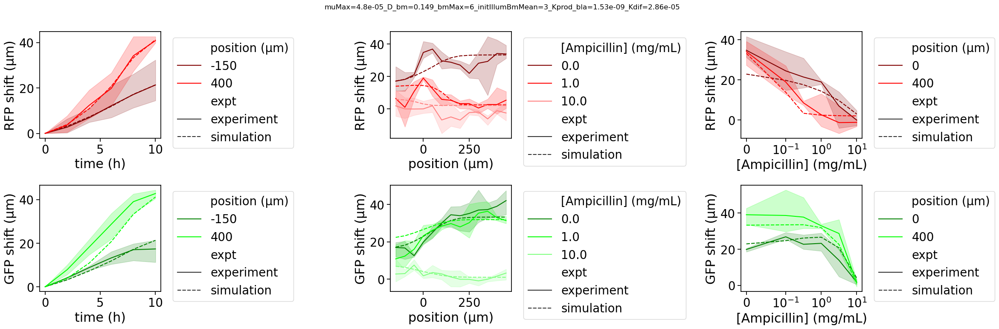

In [464]:
# fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.166,bmMax=6,initIllumBmMean=3,Kprod_bla=1.05e-09, Kdif=2.7e-05,
# fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.149,bmMax=6,initIllumBmMean=3,Kprod_bla=1.57e-09, Kdif=3.02e-05,
fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.149,bmMax=6,initIllumBmMean=3,Kprod_bla=1.53e-09, Kdif=2.86e-05,
           savePlots=True,includeLegend='brief',fontScale=1.8,
          # saveName='C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/communitiesPaper/latex/figures/subpanelPdfs/growthPlots.pdf')
          saveName=None)
fullDf.to_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/fullDf.csv',index=False)


C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\2520586433.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\2520586433.py:234: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\2520586433.py:249: SettingWithCopyWarni

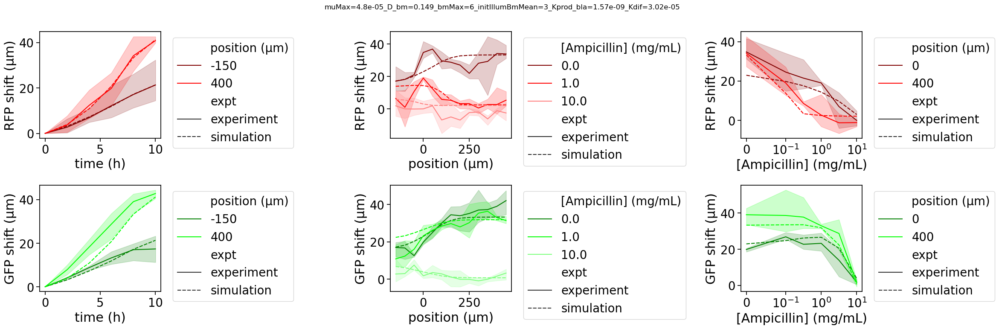

In [462]:
fullDf=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/fullDf.csv')
# fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.166,bmMax=6,initIllumBmMean=3,Kprod_bla=1.05e-09, Kdif=2.7e-05,
# fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.149,bmMax=6,initIllumBmMean=3,Kprod_bla=1.57e-09, Kdif=3.02e-05,
fullDf=simAmpGrad(muMax=4.8e-5,D_bm=.149,bmMax=6,initIllumBmMean=3,Kprod_bla=1.53e-09, Kdif=2.86e-05,
                  savePlots=True,includeLegend='brief',fontScale=1.8,fullDf=fullDf,
                  saveName='C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/communitiesPaper/latex/figures/subpanelPdfs/growthPlots.pdf')


C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_9904\4066936803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

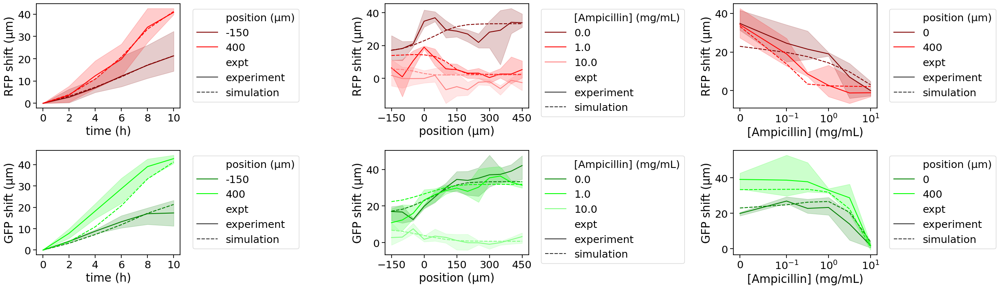

In [277]:
includeLegend='brief'
fontScale=1.666666666666667
saveName='C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/communitiesPaper/latex/figures/subpanelPdfs/growthPlots.pdf'
with sns.plotting_context("notebook",font_scale=fontScale):

    plotPositions=[-150,400]
    plotConds=['0x','10x','100x']

    gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
    rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]
    if includeLegend:
        # fig,axs=plt.subplots(2,3,figsize=(30,10))
        fig,axs=plt.subplots(2,3,figsize=(25,7.5))
    else:
        fig,axs=plt.subplots(2,3,figsize=(12,8))

    plotDf=fullDf[(fullDf.cond=='0x')&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.lineplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf.reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))
    g=sns.lineplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf.reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['cond'].isin(plotConds))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.lineplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
                data=plotDf.reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.lineplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
                data=plotDf.reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))


    plotPositions=[0,400]

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf.reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf.reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    fig.tight_layout()
    fig.savefig(saveName)


C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\1613598770.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

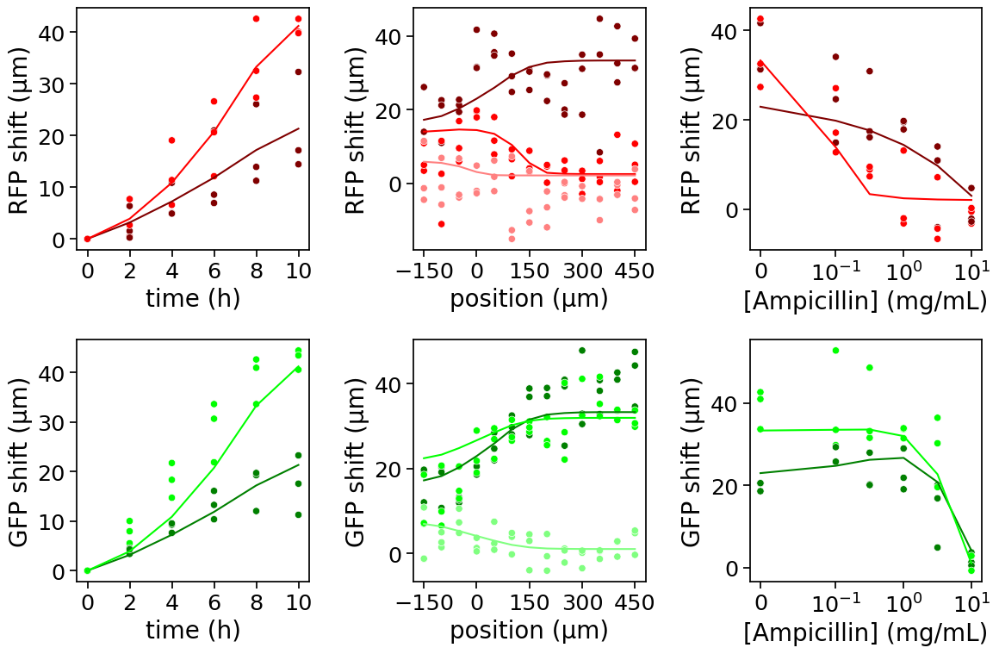

In [465]:
includeLegend='brief'
includeLegend=False
fontScale=1.666666666666666667
saveName='C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/communitiesPaper/latex/figures/subpanelPdfs/growthDotPlots.pdf'
with sns.plotting_context("notebook",font_scale=fontScale):

    plotPositions=[-150,400]
    plotConds=['0x','10x','100x']

    gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
    rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]
    if includeLegend:
        fig,axs=plt.subplots(2,3,figsize=(.9*28,.9*8))
    else:
        fig,axs=plt.subplots(2,3,figsize=(12,8))

    plotDf=fullDf[(fullDf.cond=='0x')&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
    g2=sns.lineplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))
    g=sns.scatterplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
    g=sns.lineplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['cond'].isin(plotConds))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
    g=sns.lineplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.scatterplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
    g=sns.lineplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))


    plotPositions=[0,400]

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.scatterplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    fig.tight_layout()
    fig.savefig(saveName)


In [485]:
fullDf[['GFP shift (μm)','RFP shift (μm)']].describe()

,GFP shift (μm),RFP shift (μm)
count,1872.000000,1872.000000
mean,13.560030,6.631938
std,14.670400,9.960312
min,-9.200913,-15.138076
25%,1.246145,0.000000
50%,8.584643,3.581948
75%,22.180811,10.256974
max,87.201019,54.229738


C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\setuptools\_distutils\version.py:345: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\algorithms.py:522: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  common = np.find_common_type([values.dtype, comps_array.dtype], [])
C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_7608\1754522587.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

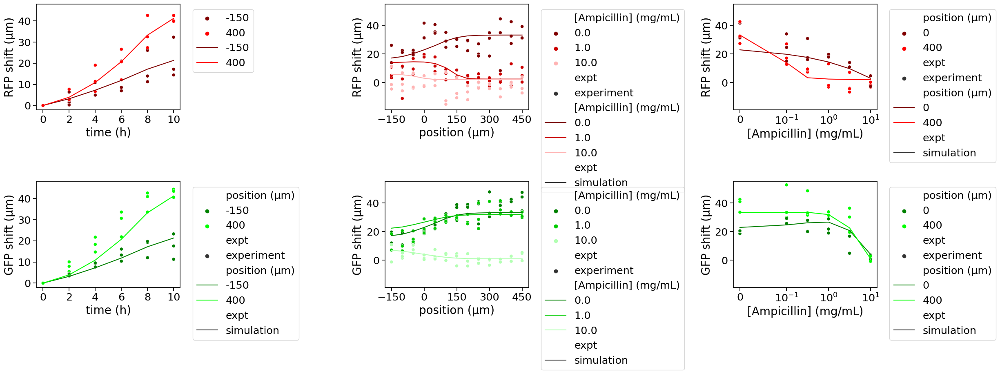

In [489]:
includeLegend='brief'
fontScale=1.666666666666666667
saveName='C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/communitiesPaper/latex/figures/subpanelPdfs/growthDotPlots.pdf'
with sns.plotting_context("notebook",font_scale=fontScale):

    plotPositions=[-150,400]
    plotConds=['0x','10x','100x']

    gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
    rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]
    if includeLegend:
        fig,axs=plt.subplots(2,3,figsize=(25,9))
    else:
        fig,axs=plt.subplots(2,3,figsize=(12,8))

    plotDf=fullDf[(fullDf.cond=='0x')&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
    g2=sns.lineplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    g.set_ylim([-2,48])

    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))
    g=sns.scatterplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
    g=sns.lineplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
    g.set_xticks([0,2,4,6,8,10])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))
    g.set_ylim([-2,48])

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['cond'].isin(plotConds))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(.8,0,0),(1,.7,.7)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
    g=sns.lineplot(x='position (μm)',y='RFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(.5,0,0),(.8,0,0),(1,.7,.7)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    g.set_ylim([-19,55])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.scatterplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,.8,0),(.7,1,.7)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
    g=sns.lineplot(x='position (μm)',y='GFP shift (μm)',hue='[Ampicillin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,.8,0),(.7,1,.7)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
    g.set_xticks([-150,0,150,300,450])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))
    g.set_ylim([-19,55])


    plotPositions=[0,400]

    plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['position (μm)'].isin(plotPositions))]
    plotDf['expt']=plotDf.expt.map({'J4K5succ250_ampGrad':'experiment','simulation':'simulation'})
    g=sns.scatterplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    g.set_ylim([-19,55])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    g=sns.scatterplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='experiment'].reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
    g=sns.lineplot(x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                data=plotDf[plotDf.expt=='simulation'].reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
    g.set_xscale('symlog', linthresh=0.1)
    g.set_ylim([-19,55])
    if includeLegend:
        g.legend(bbox_to_anchor=(1.05, 1))

    fig.tight_layout()
    fig.savefig(saveName)


In [61]:
tiffDf.expt.unique()

array(['250standalone_ampGrad', '250standalone_kanGrad',
       'J4K5standalone_ampGrad', 'J4K5standalone_kanGrad',
       'J4K5succ250_ampGrad', 'J4K5succ250_kanGrad'], dtype=object)

In [62]:
df.head()

,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL)
0,J4K5succ250_ampGrad,0x,1,0,-150,25-48,17-40,272.399955,203.942488,0.0,0.0,0.0,NaN
1,J4K5succ250_ampGrad,0x,1,0,-100,40-63,32-55,274.871785,233.285372,0.0,0.0,0.0,NaN
2,J4K5succ250_ampGrad,0x,1,0,-50,55-78,47-70,272.168635,233.673312,0.0,0.0,0.0,NaN
3,J4K5succ250_ampGrad,0x,1,0,0,70-93,62-85,271.855968,256.421133,0.0,0.0,0.0,NaN
4,J4K5succ250_ampGrad,0x,1,0,50,85-108,77-100,273.929695,246.545603,0.0,0.0,0.0,NaN


In [97]:
def fitX0Standalone(y,x=None,bounds=None):
    if x is None:
        x=range(len(y))
    if bounds is None:
        bounds=([0,0,0,min(x)],[np.max(y),max(x)-min(x),np.max(y),max(x)])
    params,_=curve_fit(f=logisticFunc,
          xdata=x,ydata=y,
          method='trf',bounds=bounds,loss='soft_l1',max_nfev=1e8)
    return params

def fitSliceStandalone(imgZsum,lim1,lim2,frame,channel,xlims=None,umPerPixel=850/256):
    imgSlice=imgZsum[frame,:,lim1:lim2,channel].T
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    xlims[0]=np.max([0,xlims[0]])
    xlims[1]=np.min([imgSlice.shape[1],xlims[1]])
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
    return params


expts=[expt for expt in tiffDf.expt.unique() if 'standalone' in expt]
# expts=[expt for expt in tiffDf.expt.unique() if 'standalone' in expt and 'ampGrad' in expt]

reps=[1,2,3]
conds=['0x','1x','3x','10x','30x','100x']

# reps=[1]
# conds=['0x']

numFrames=6
umPerPixel=850/256

slicePosInPixels=[116,140] #take the middle 80um slice for each image
halfSliceLengthInPixels=256

tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds),:]
standaloneDf=pd.DataFrame([])
for row in tiffDfSubset.iterrows():
    img=readTiff(row[1].filename)
    expt=row[1].expt
    cond=row[1].cond
    rep=row[1].rep
    imgZsum=np.mean(img,axis=1)

    if '250' in expt:
        channel=1 #gfp
    else:
        channel=0 #rfp
    print(expt,cond,rep)

    newDf=pd.DataFrame({'expt':expt,
                        'cond':cond,
                        'rep':rep,
                        'time (h)':2*np.arange(numFrames),
                        'pixelRange':f"{slicePosInPixels[0]}-{slicePosInPixels[1]}",
                        'X0':[fitSliceStandalone(imgZsum,slicePosInPixels[0],slicePosInPixels[1],frameNum,channel=channel)[-1] for frameNum in range(numFrames)]
                       })
    newDf['shift (μm)']=newDf.X0-newDf.loc[newDf['time (h)']==0,'X0'].values[0]
    standaloneDf=pd.concat([standaloneDf,newDf])


standaloneDf=standaloneDf.reset_index(drop=True)
standaloneDf['redPixelRange']=[pixelRange if 'J4K5' in expt else '' for pixelRange,expt in zip(standaloneDf.pixelRange,standaloneDf.expt)]
standaloneDf['greenPixelRange']=[pixelRange if 'J4K5' not in expt else '' for pixelRange,expt in zip(standaloneDf.pixelRange,standaloneDf.expt)]
standaloneDf['redX0']=[X0 if 'J4K5' in expt else np.nan for X0,expt in zip(standaloneDf.X0,standaloneDf.expt)]
standaloneDf['greenX0']=[X0 if 'J4K5' not in expt else np.nan for X0,expt in zip(standaloneDf.X0,standaloneDf.expt)]
standaloneDf['RFP shift (μm)']=[shift if 'J4K5' in expt else np.nan for shift,expt in zip(standaloneDf['shift (μm)'],standaloneDf.expt)]
standaloneDf['GFP shift (μm)']=[shift if 'J4K5' not in expt else np.nan for shift,expt in zip(standaloneDf['shift (μm)'],standaloneDf.expt)]

ampCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in standaloneDf.cond.unique()])],
                     [0]+list(np.power(10,np.arange(-1,1.5,.5)))))
kanCondDict=dict(zip([f"{intCond}x" for intCond in np.sort([int(cond.strip('x')) for cond in standaloneDf.cond.unique()])],
                     [0]+list(0.5*np.power(10,np.arange(-1,1.5,.5)))))
standaloneDf['[Ampicillin] (mg/mL)']=standaloneDf.cond.map(ampCondDict)
standaloneDf['[Kanamycin] (mg/mL)']=standaloneDf.cond.map(kanCondDict)
standaloneDf.loc[standaloneDf.expt.str.contains('kanGrad'),'[Ampicillin] (mg/mL)']=np.nan
standaloneDf.loc[standaloneDf.expt.str.contains('ampGrad'),'[Kanamycin] (mg/mL)']=np.nan

standaloneDf['position (μm)']=np.nan
standaloneDf.to_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/standaloneDf.csv',index=False)

standaloneDf.head()

250standalone_ampGrad 0x 1
250standalone_ampGrad 0x 2
250standalone_ampGrad 0x 3
250standalone_ampGrad 1x 1
250standalone_ampGrad 1x 2
250standalone_ampGrad 1x 3
250standalone_ampGrad 3x 1
250standalone_ampGrad 3x 2
250standalone_ampGrad 3x 3
250standalone_ampGrad 10x 1
250standalone_ampGrad 10x 2
250standalone_ampGrad 10x 3
250standalone_ampGrad 30x 1
250standalone_ampGrad 30x 2
250standalone_ampGrad 30x 3
250standalone_ampGrad 100x 1
250standalone_ampGrad 100x 2
250standalone_ampGrad 100x 3
250standalone_kanGrad 0x 1
250standalone_kanGrad 0x 2
250standalone_kanGrad 0x 3
250standalone_kanGrad 1x 1
250standalone_kanGrad 1x 2
250standalone_kanGrad 1x 3
250standalone_kanGrad 3x 1
250standalone_kanGrad 3x 2
250standalone_kanGrad 3x 3
250standalone_kanGrad 10x 1
250standalone_kanGrad 10x 2
250standalone_kanGrad 10x 3
250standalone_kanGrad 30x 1
250standalone_kanGrad 30x 2
250standalone_kanGrad 30x 3
250standalone_kanGrad 100x 1
250standalone_kanGrad 100x 2
250standalone_kanGrad 100x 3
J4K5

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:33: RuntimeWarning: overflow encountered in exp
  return a/(1+np.exp((x-x0)/b))+c


J4K5standalone_kanGrad 30x 1
J4K5standalone_kanGrad 30x 2
J4K5standalone_kanGrad 30x 3
J4K5standalone_kanGrad 100x 1
J4K5standalone_kanGrad 100x 2
J4K5standalone_kanGrad 100x 3


,expt,cond,rep,time (h),pixelRange,X0,shift (μm),redPixelRange,greenPixelRange,redX0,greenX0,RFP shift (μm),GFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),position (μm)
0,250standalone_ampGrad,0x,1,0,116-140,307.329122,0.000000,,116-140,NaN,307.329122,NaN,0.000000,0.0,NaN,NaN
1,250standalone_ampGrad,0x,1,2,116-140,326.448107,19.118984,,116-140,NaN,326.448107,NaN,19.118984,0.0,NaN,NaN
2,250standalone_ampGrad,0x,1,4,116-140,379.081050,71.751928,,116-140,NaN,379.081050,NaN,71.751928,0.0,NaN,NaN
3,250standalone_ampGrad,0x,1,6,116-140,441.215215,133.886093,,116-140,NaN,441.215215,NaN,133.886093,0.0,NaN,NaN
4,250standalone_ampGrad,0x,1,8,116-140,538.635006,231.305884,,116-140,NaN,538.635006,NaN,231.305884,0.0,NaN,NaN


In [88]:

standaloneDf=pd.read_csv('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simData/standaloneDf.csv')
standaloneDf.head()

,expt,cond,rep,time (h),pixelRange,X0,shift (μm),redPixelRange,greenPixelRange,redX0,greenX0,RFP shift (μm),GFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),position (μm)
0,250standalone_ampGrad,0x,1,0,116-140,307.329122,0.000000,NaN,116-140,NaN,307.329122,NaN,0.000000,0.0,NaN,NaN
1,250standalone_ampGrad,0x,1,2,116-140,326.448107,19.118984,NaN,116-140,NaN,326.448107,NaN,19.118984,0.0,NaN,NaN
2,250standalone_ampGrad,0x,1,4,116-140,379.081050,71.751928,NaN,116-140,NaN,379.081050,NaN,71.751928,0.0,NaN,NaN
3,250standalone_ampGrad,0x,1,6,116-140,441.215215,133.886093,NaN,116-140,NaN,441.215215,NaN,133.886093,0.0,NaN,NaN
4,250standalone_ampGrad,0x,1,8,116-140,538.635006,231.305884,NaN,116-140,NaN,538.635006,NaN,231.305884,0.0,NaN,NaN


In [96]:
standaloneDf[(standaloneDf['[Ampicillin] (mg/mL)']==0)&(standaloneDf['time (h)']==10)]


,expt,cond,rep,time (h),pixelRange,X0,shift (μm),redPixelRange,greenPixelRange,redX0,greenX0,RFP shift (μm),GFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),position (μm)
5,250standalone_ampGrad,0x,1,10,116-140,291.529594,-30.423941,,116-140,NaN,291.529594,NaN,-30.423941,0.0,NaN,NaN
11,250standalone_ampGrad,0x,2,10,116-140,438.628729,121.754609,,116-140,NaN,438.628729,NaN,121.754609,0.0,NaN,NaN
17,250standalone_ampGrad,0x,3,10,116-140,376.747847,50.299211,,116-140,NaN,376.747847,NaN,50.299211,0.0,NaN,NaN
23,J4K5standalone_ampGrad,0x,1,10,116-140,256.692816,44.823863,116-140,,256.692816,NaN,44.823863,NaN,0.0,NaN,NaN
29,J4K5standalone_ampGrad,0x,2,10,116-140,319.054693,56.867715,116-140,,319.054693,NaN,56.867715,NaN,0.0,NaN,NaN
35,J4K5standalone_ampGrad,0x,3,10,116-140,292.317725,56.952256,116-140,,292.317725,NaN,56.952256,NaN,0.0,NaN,NaN


In [93]:
standaloneDf[(standaloneDf['[Ampicillin] (mg/mL)']==0)&(standaloneDf['time (h)']==10)]


,expt,cond,rep,time (h),pixelRange,X0,shift (μm),redPixelRange,greenPixelRange,redX0,greenX0,RFP shift (μm),GFP shift (μm),[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),position (μm)
5,250standalone_ampGrad,0x,1,10,116-140,266.256909,-41.072213,NaN,116-140,NaN,266.256909,NaN,-41.072213,0.0,NaN,NaN
11,250standalone_ampGrad,0x,2,10,116-140,481.694027,169.865210,NaN,116-140,NaN,481.694027,NaN,169.865210,0.0,NaN,NaN
17,250standalone_ampGrad,0x,3,10,116-140,399.501441,72.789069,NaN,116-140,NaN,399.501441,NaN,72.789069,0.0,NaN,NaN
221,J4K5standalone_ampGrad,0x,1,10,116-140,260.010288,46.734332,116-140,NaN,260.010288,NaN,46.734332,NaN,0.0,NaN,NaN
227,J4K5standalone_ampGrad,0x,2,10,116-140,321.126491,59.865182,116-140,NaN,321.126491,NaN,59.865182,NaN,0.0,NaN,NaN
233,J4K5standalone_ampGrad,0x,3,10,116-140,288.911243,57.877501,116-140,NaN,288.911243,NaN,57.877501,NaN,0.0,NaN,NaN


(0.0, 10.0)

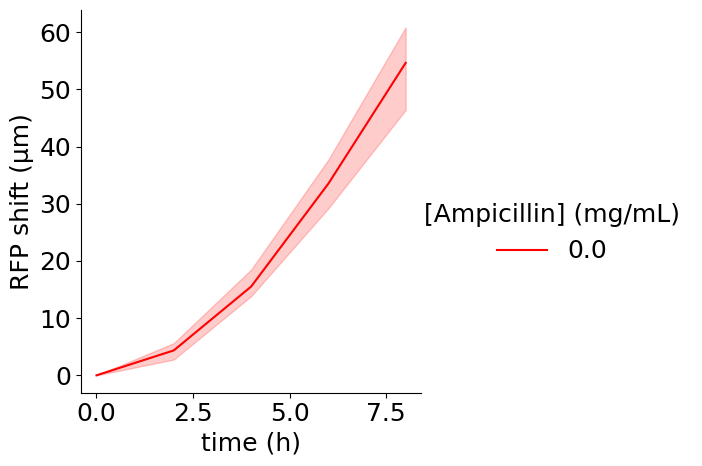

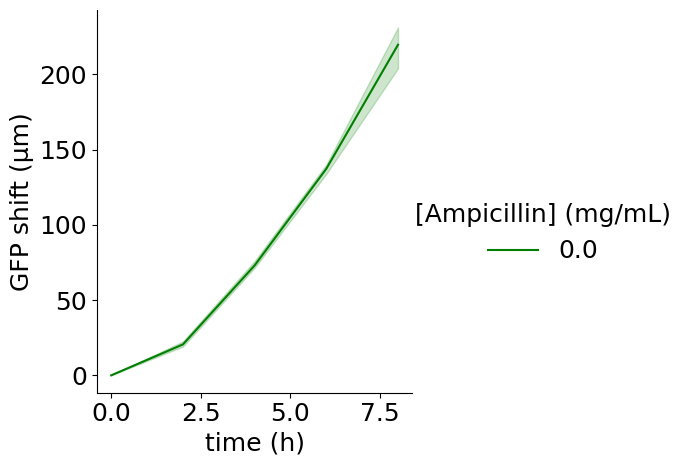

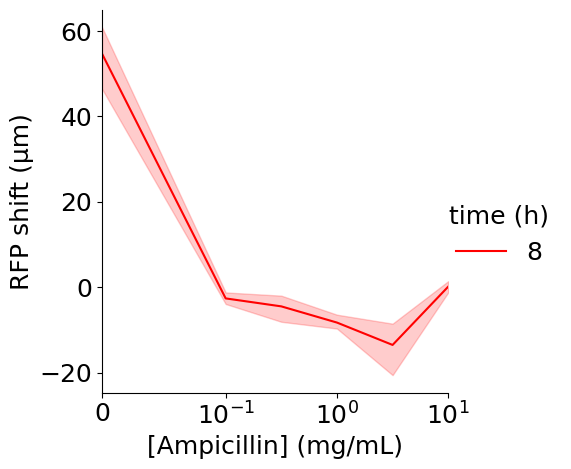

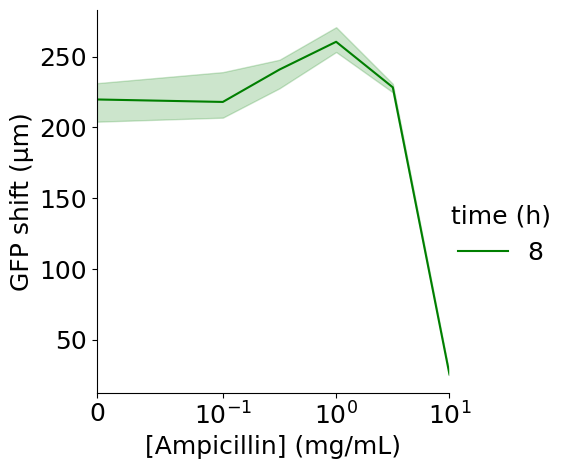

In [111]:
standalonePlotDf=standaloneDf[(standaloneDf['[Ampicillin] (mg/mL)']==0)&(standaloneDf['time (h)']<10)]
sns.relplot(kind='line',x='time (h)',hue='[Ampicillin] (mg/mL)',y='RFP shift (μm)',data=standalonePlotDf,palette=["#FF0000"])
sns.relplot(kind='line',x='time (h)',hue='[Ampicillin] (mg/mL)',y='GFP shift (μm)',data=standalonePlotDf,palette=["#007F00"])

standalonePlotDf=standaloneDf[(standaloneDf['time (h)']==8)]
sns.relplot(kind='line',hue='time (h)',x='[Ampicillin] (mg/mL)',y='RFP shift (μm)',data=standalonePlotDf,palette=["#FF0000"])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])
sns.relplot(kind='line',hue='time (h)',x='[Ampicillin] (mg/mL)',y='GFP shift (μm)',data=standalonePlotDf,palette=["#007F00"])
plt.xscale('symlog', linthresh=0.1)
plt.xlim([0,10])


In [134]:
timetotest=8

outerDf=df.loc[(df['[Ampicillin] (mg/mL)']==0)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerDf.mean(),
           outerDf.std()]).round(1))

outerAmp0p1Df=df.loc[(df['[Ampicillin] (mg/mL)']==0.1)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp0p1Df.mean(),
           outerAmp0p1Df.std()]).round(1))

outerAmp1Df=df.loc[(df['[Ampicillin] (mg/mL)']==1)&
    (df['position (μm)']==400)&
    (df['expt']=='J4K5succ250_ampGrad')&
  (df['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([outerAmp1Df.mean(),
           outerAmp1Df.std()]).round(1))

J4K5standaloneNoAmpDf=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==0)&
    (standaloneDf['expt']=='J4K5standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([J4K5standaloneNoAmpDf.mean(),
           J4K5standaloneNoAmpDf.std()]).round(1))

J4K5standaloneAmp0p1Df=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==0.1)&
    (standaloneDf['expt']=='J4K5standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([J4K5standaloneAmp0p1Df.mean(),
           J4K5standaloneAmp0p1Df.std()]).round(1))

J4K5standaloneAmp1Df=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==1)&
    (standaloneDf['expt']=='J4K5standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([J4K5standaloneAmp1Df.mean(),
           J4K5standaloneAmp1Df.std()]).round(1))

G250standaloneNoAmpDf=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==0)&
    (standaloneDf['expt']=='250standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([G250standaloneNoAmpDf.mean(),
           G250standaloneNoAmpDf.std()]).round(1))

G250standaloneAmp0p1Df=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==0.1)&
    (standaloneDf['expt']=='250standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([G250standaloneAmp0p1Df.mean(),
           G250standaloneAmp0p1Df.std()]).round(1))

G250standaloneAmp1Df=standaloneDf.loc[(standaloneDf['[Ampicillin] (mg/mL)']==1)&
    (standaloneDf['expt']=='250standalone_ampGrad')&
  (standaloneDf['time (h)']==timetotest),
      ['GFP shift (μm)','RFP shift (μm)']]
print(pd.concat([G250standaloneAmp1Df.mean(),
           G250standaloneAmp1Df.std()]).round(1))
# print(ttest_1samp(outerDf['GFP shift (μm)'],0))
# print(ttest_1samp(outerDf['RFP shift (μm)'],0))

print(ttest_ind(outerDf['RFP shift (μm)'],J4K5standaloneNoAmpDf['RFP shift (μm)']))
print(ttest_ind(outerDf['GFP shift (μm)'],G250standaloneNoAmpDf['GFP shift (μm)']))
print(ttest_ind(outerAmp0p1Df['RFP shift (μm)'],J4K5standaloneAmp0p1Df['RFP shift (μm)']))
print(ttest_ind(outerAmp1Df['RFP shift (μm)'],J4K5standaloneAmp1Df['RFP shift (μm)']))


# tukey_hsd(innerAmp1Df['RFP shift (μm)'],outerAmp1Df['RFP shift (μm)'],boundaryAmp1Df['RFP shift (μm)']).pvalue

GFP shift (μm)    39.1
RFP shift (μm)    34.2
GFP shift (μm)     4.8
RFP shift (μm)     7.8
dtype: float64
GFP shift (μm)    38.6
RFP shift (μm)    19.0
GFP shift (μm)    12.3
RFP shift (μm)     7.3
dtype: float64
GFP shift (μm)    33.0
RFP shift (μm)     2.7
GFP shift (μm)     1.4
RFP shift (μm)     9.1
dtype: float64
GFP shift (μm)     NaN
RFP shift (μm)    54.7
GFP shift (μm)     NaN
RFP shift (μm)     7.4
dtype: float64
GFP shift (μm)    NaN
RFP shift (μm)   -2.6
GFP shift (μm)    NaN
RFP shift (μm)    1.4
dtype: float64
GFP shift (μm)    NaN
RFP shift (μm)   -8.3
GFP shift (μm)    NaN
RFP shift (μm)    1.7
dtype: float64
GFP shift (μm)    219.8
RFP shift (μm)      NaN
GFP shift (μm)     14.1
RFP shift (μm)      NaN
dtype: float64
GFP shift (μm)    218.0
RFP shift (μm)      NaN
GFP shift (μm)     18.3
RFP shift (μm)      NaN
dtype: float64
GFP shift (μm)    260.6
RFP shift (μm)      NaN
GFP shift (μm)     10.9
RFP shift (μm)      NaN
dtype: float64
TtestResult(statistic=-3.30617738

C:\Users\Xiaofan\AppData\Local\Temp\ipykernel_15180\2028635064.py:13: RuntimeWarning: invalid value encountered in divide
  return plt.imshow((img-vmin)/(vmax-vmin),**kwargs)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\250standalone_ampGrad_withReplicates_tif\shifted\250standalone_ampGrad_withReplicates_shifted_p03.tif
(18, 61, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


C:\Users\Xiaofan/Desktop\confocal data\timelapseProcessed\J4K5standalone_ampGrad37_withReplicates_tiff\shifted\J4K5standalone_ampGrad37_withReplicates_shifted_p03.tif
(18, 46, 256, 256, 3)


Text(0, 0.5, 'vertical axis (μm)')

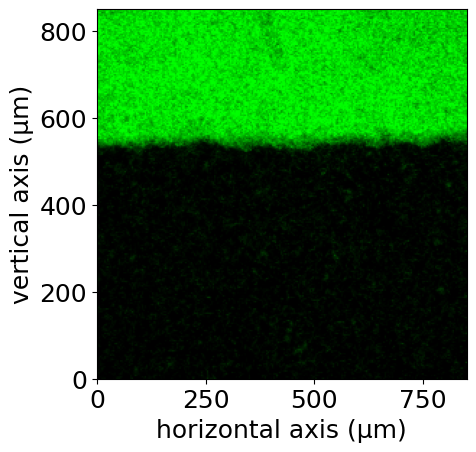

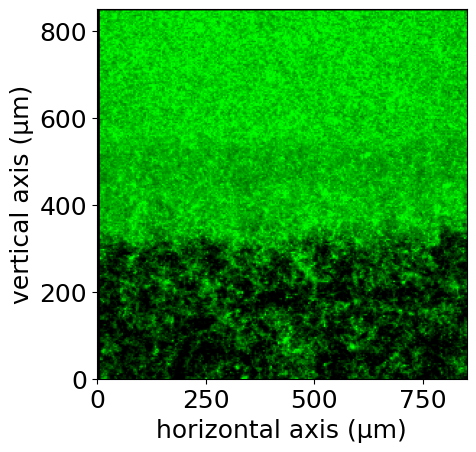

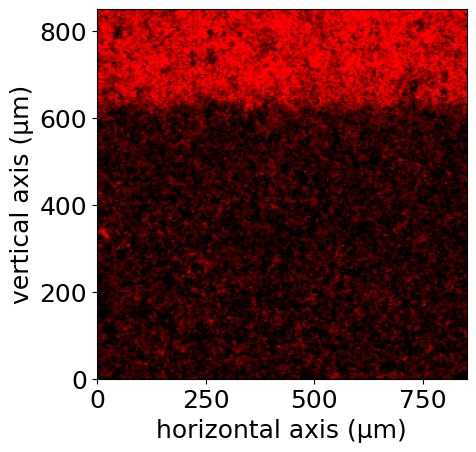

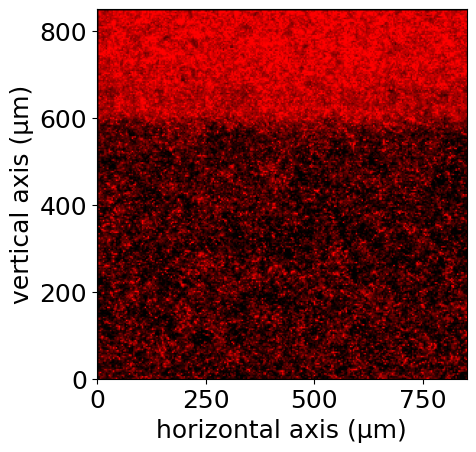

In [131]:
expts=['250standalone_ampGrad']
reps=[1]
conds=['0x']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
print(tiffDfSubset.filename.values[0])
print(img.shape)
img[:,:,:,:,[0,2]]=0
plt.figure()
imagesc(np.mean(img[0,:,:,:,:],axis=0),extent=[0,850,0,850])
plt.xlabel('horizontal axis (μm)')
plt.ylabel('vertical axis (μm)')
plt.figure()
imagesc(np.mean(img[4,:,:,:,:],axis=0),extent=[0,850,0,850])
plt.xlabel('horizontal axis (μm)')
plt.ylabel('vertical axis (μm)')

expts=['J4K5standalone_ampGrad']
reps=[1]
conds=['0x']
tiffDfSubset=tiffDf.loc[tiffDf.expt.isin(expts)&tiffDf.rep.isin(reps)&tiffDf.cond.isin(conds)&tiffDf.cond.isin(conds),:]
img=readTiff(tiffDfSubset.filename.values[0])
print(tiffDfSubset.filename.values[0])
print(img.shape)
img[:,:,:,:,[1,2]]=0
plt.figure()
imagesc(np.mean(img[0,:,:,:,:],axis=0),extent=[0,850,0,850])
plt.xlabel('horizontal axis (μm)')
plt.ylabel('vertical axis (μm)')
plt.figure()
imagesc(np.mean(img[4,:,:,:,:],axis=0),extent=[0,850,0,850])
plt.xlabel('horizontal axis (μm)')
plt.ylabel('vertical axis (μm)')


In [289]:
def fitSimSlice(img,lim1,lim2,channel,xlims=None,umPerPixel=850/64):
    if channel==1:
        imgSlice=img[lim1:lim2,:]
    elif channel==0:
        imgSlice=img[:,lim1:lim2].T
    else:
        return None
    if xlims is None:
        xlims=[0,imgSlice.shape[1]]
    y=np.sum(imgSlice[:,xlims[0]:xlims[1]],axis=0)
    x=umPerPixel*np.arange(*xlims)
    x=x[y>0]
    y=y[y>0]
    ymin=np.min(y)
    ymax=np.max(y)
    params=fitX0(x=x,y=y)
    return params
def minZero(mat):
    mat[mat<0]=0
    return mat
class biofilmKanSimulate:
    def __init__(self,
                exptName="simulation",
                xSize=64,
                dt=6,
                simTimeInSeconds=36000,
                simSizeInMicrons=850,
                initKan=0.5,#initial ampicillin concentration in mg/mL
                initNutr=2,#initial nutrients in mg/mL
                bmMax=6,#carrying capacity of biomass density, in pg/um^2 (dry biomass, 1 cell~0.3pg)
                initDarkBmMean=None,#how much biomass density to initialize unilluminated regions in pg/um^2 (dry biomass, 1 cell~0.3pg)
                initIllumBmMean=3,#how much biomass to initialize illuminated regions in pg/um^2 (dry biomass, 1 cell~0.3pg)
                fractionIllum=0.25,#what fraction of simulation area is illuminated for each strain

                gammaBm=5.6e-6,#death rate of biomass in s^-1
                gammaKan=0,#inherent decay rate of kanamycin in s^-1 

                D_nutr=600,#diffusivity of nutrients in um^2/s
                D_bm=0.149,#diffusivity of biomass in um^2/s
                D_kan=400,#diffusivity of kanamycin in um^2/s
                 
                muMax=4.8e-5, #max growth rate in s^-1
                 
                K_nutr=0.004,#nutrient concentration at half max growth rate in mg/mL glucose
                yield_nutr=0.632,#nutrient to biomass conversion yield in (pg/um^2 biomass density)/(mg/mL nutrient)
                K_kanR=0.512,#hill constant for ampicillin inhibition of red cells
                K_kanG=0.002,#hill constant for ampicillin inhibition of green cells
                h_kan=1.9,#hill coefficient for aminoglyocoside inhibition of red and green cells (using streptomycin value from regoes 2004)
                Kdif=2.7e-5,#rate constant of diffusion of kanamycin into biofilm, in s^-1

                ):
        if initDarkBmMean is None:
            initDarkBmMean=initIllumBmMean/100
        warnings.filterwarnings('ignore')
        self.params=locals()
        self.params.pop('self')
        self.params['nSteps']=int(simTimeInSeconds/dt)
        self.params['cond']=f"{int(float('%.1g' % (initKan*20)))}x"
        self.params['dx']=simSizeInMicrons/xSize
        self.Dmat=-2*np.diag(np.ones(xSize))+np.diag(np.ones(xSize-1),1)+np.diag(np.ones(xSize-1),-1)
        self.Dmat[0,0]=-1
        self.Dmat[-1,-1]=-1
        initBm1d=initDarkBmMean+(initIllumBmMean-initDarkBmMean)*np.exp(-(np.arange(xSize)-xSize*fractionIllum))/(1+np.exp(-(np.arange(xSize)-xSize*fractionIllum)))

        self.Gbm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.Gbm[:,:,0]=np.tile(initBm1d,(xSize,1))
        self.Rbm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.Rbm[:,:,0]=np.tile(initBm1d,(xSize,1)).T
        self.mu_R=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.mu_G=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.kanMedia=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.kanMedia[:,:,0]=initKan
        self.kanBiofilm=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.bla=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32) 
        self.nutr=np.zeros([self.params['xSize'],
                           self.params['xSize'],
                           self.params['nSteps']+1],
                         dtype=np.float32)
        self.nutr[:,:,0]=initNutr
        self.greenCmap=LinearSegmentedColormap.from_list("greenCmap",[[0,0,0],[0,1,0]])
        self.redCmap=LinearSegmentedColormap.from_list("redCmap",[[0,0,0],[1,0,0]])
        warnings.filterwarnings('default')
        
    def simulate(self,nSteps=None):
        warnings.filterwarnings('ignore')
        if nSteps is None:
            nSteps=self.params['nSteps']
        for step in np.arange(nSteps):
            self.mu_R[:,:,step]=self.params['muMax']*np.divide(self.nutr[:,:,step],(self.nutr[:,:,step]+self.params['K_nutr']))*(1-(self.Rbm[:,:,step]+self.Gbm[:,:,step])/self.params['bmMax'])*np.divide(np.power(self.params['K_kanR'],self.params['h_kan']),(np.power(self.kanBiofilm[:,:,step],self.params['h_kan'])+np.power(self.params['K_kanR'],self.params['h_kan'])))
            self.mu_G[:,:,step]=self.params['muMax']*np.divide(self.nutr[:,:,step],(self.nutr[:,:,step]+self.params['K_nutr']))*(1-(self.Rbm[:,:,step]+self.Gbm[:,:,step])/self.params['bmMax'])*np.divide(np.power(self.params['K_kanG'],self.params['h_kan']),(np.power(self.kanBiofilm[:,:,step],self.params['h_kan'])+np.power(self.params['K_kanG'],self.params['h_kan'])))
            self.Rbm[:,:,step+1]=self.Rbm[:,:,step]*(1+self.params['dt']*(self.mu_R[:,:,step]-self.params['gammaBm']))+(self.params['dt']/np.power(self.params['dx'],2))*self.params['D_bm']*(np.matmul(self.Dmat,self.Rbm[:,:,step])+np.matmul(self.Rbm[:,:,step],self.Dmat));
            self.Gbm[:,:,step+1]=self.Gbm[:,:,step]*(1+self.params['dt']*(self.mu_G[:,:,step]-self.params['gammaBm']))+(self.params['dt']/np.power(self.params['dx'],2))*self.params['D_bm']*(np.matmul(self.Dmat,self.Gbm[:,:,step])+np.matmul(self.Gbm[:,:,step],self.Dmat));
            
            self.kanMedia[:,:,step+1]=self.kanMedia[:,:,step]+self.params['dt']*(-self.params['Kdif']*(self.kanMedia[:,:,step]-self.kanBiofilm[:,:,step])-self.params['gammaKan']*self.kanMedia[:,:,step])
            self.kanMedia[:,:,step+1]=np.mean(self.kanMedia[:,:,step+1]);
            self.kanBiofilm[:,:,step+1]=self.kanBiofilm[:,:,step]+self.params['dt']*(self.params['Kdif']*(self.kanMedia[:,:,step]-self.kanBiofilm[:,:,step])-self.params['gammaKan']*self.kanBiofilm[:,:,step])
            self.nutr[:,:,step+1]=self.nutr[:,:,step]-(self.params['dt']/self.params['yield_nutr'])*(self.Rbm[:,:,step]*self.mu_R[:,:,step]+self.Gbm[:,:,step]*self.mu_G[:,:,step])
            self.nutr[:,:,step+1]=np.mean(self.nutr[:,:,step+1]);

            self.kanMedia[:,:,step+1]=minZero(self.kanMedia[:,:,step+1]);
            self.kanBiofilm[:,:,step+1]=minZero(self.kanBiofilm[:,:,step+1]);
            self.nutr[:,:,step+1]=minZero(self.nutr[:,:,step+1]);
            self.Rbm[:,:,step+1]=minZero(self.Rbm[:,:,step+1]);
            self.Gbm[:,:,step+1]=minZero(self.Gbm[:,:,step+1]);
        warnings.filterwarnings('default')
    
    def showPlots(self,steps=None):
        warnings.filterwarnings('ignore')
        if steps is None:
            steps=(np.arange(0,self.params['simTimeInSeconds']+1,7200)/self.params['dt']).astype(int)
        fig,axs=plt.subplots(nrows=len(steps),ncols=8,figsize=(16,2*len(steps)),squeeze=False)
        for ind,step in enumerate(steps):
            imagesc(self.Rbm[:,:,step],ax=axs[ind,0],cmap=self.redCmap,lims=(0,np.max(self.Rbm)))
            imagesc(self.Gbm[:,:,step],ax=axs[ind,1],cmap=self.greenCmap,lims=(0,np.max(self.Gbm)))
            imagesc(self.mu_R[:,:,step],ax=axs[ind,2],cmap=self.redCmap,lims=(0,np.max(self.mu_R)))
            imagesc(self.mu_G[:,:,step],ax=axs[ind,3],cmap=self.greenCmap,lims=(0,np.max(self.mu_G)))
            imagesc(self.kanMedia[:,:,step],ax=axs[ind,5],cmap='gray',lims=(0,np.max(self.kanMedia)))
            imagesc(self.kanBiofilm[:,:,step],ax=axs[ind,6],cmap='gray',lims=(0,np.max(self.kanBiofilm)))
            imagesc(self.nutr[:,:,step],ax=axs[ind,7],cmap='gray',lims=(0,np.max(self.nutr)))
        axs[0,0].set_title('Rbm',fontdict={'fontsize': 12})
        axs[0,1].set_title('Gbm',fontdict={'fontsize': 12})
        axs[0,2].set_title('mu_R',fontdict={'fontsize': 12})
        axs[0,3].set_title('mu_G',fontdict={'fontsize': 12})
        axs[0,5].set_title('kanMedia',fontdict={'fontsize': 12})
        axs[0,6].set_title('kanBiofilm',fontdict={'fontsize': 12})
        axs[0,7].set_title('nutr',fontdict={'fontsize': 12})
        for axs2 in axs:
            for ax in axs2:
                ax.set_yticklabels([])
                ax.set_xticklabels([])
                ax.set_yticks([])
                ax.set_xticks([])
        warnings.filterwarnings('default')
        
    def getFits(self, steps=None,positions=np.arange(-150,500,50),sliceWidth=80):
        if steps is None:
            steps=(np.arange(0,self.params['simTimeInSeconds']+1,7200)/self.params['dt']).astype(int)
        initBoundary=self.params['simSizeInMicrons']*self.params['fractionIllum']
        slicePosListInPixels=list(zip(np.ceil((initBoundary+positions-sliceWidth/2)/self.params['dx']).astype(int),
                                           np.floor((initBoundary+positions+sliceWidth/2)/self.params['dx']).astype(int)))
        df=pd.DataFrame()
        for step in steps:
            newDf=pd.DataFrame({'expt':self.params['exptName'],
                                'cond':self.params['cond'],
                                'rep':1,
                                'time (h)':int(step*self.params['dt']/3600),
                                'position (μm)':positions,
                                'redPixelRange':[f"{xlim1}-{xlim2}" for xlim1,xlim2 in slicePosListInPixels],
                                'greenPixelRange':[f"{ylim1}-{ylim2}" for ylim1,ylim2 in slicePosListInPixels],
                                'greenX0':[fitSimSlice(self.Gbm[:,:,step],lim1,lim2,channel=1)[-1] for lim1,lim2 in slicePosListInPixels],
                                'redX0':[fitSimSlice(self.Rbm[:,:,step],lim1,lim2,channel=0)[-1] for lim1,lim2 in slicePosListInPixels]})
            if step==0:
                initGreenX0=newDf.greenX0
                initRedX0=newDf.redX0
                newDf['GFP shift (μm)']=0
                newDf['RFP shift (μm)']=0
            else:
                newDf['GFP shift (μm)']=newDf.greenX0-initGreenX0
                newDf['RFP shift (μm)']=newDf.redX0-initRedX0
            df=pd.concat([df,newDf])

        df=df.reset_index(drop=True)
        df['[Kanamycin] (mg/mL)']=self.params['initKan']
        df['[Ampicillin] (mg/mL)']=np.nan
        return df
    
def simKanGrad(makePlots=True,savePlots=False,saveName=None,includeLegend=False,fontScale=1.8,**kwargs):
    initKans=df['[Kanamycin] (mg/mL)'].dropna().unique()
    fullDf=df[df.expt.str.contains('kan')].copy()
    for initKan in initKans:
        testSim=biofilmKanSimulate(initKan=initKan,**kwargs)
        testSim.simulate()
        simDf=testSim.getFits()
        fullDf=pd.concat([fullDf,simDf])
        del testSim
        
    if makePlots:
        with sns.plotting_context("notebook",font_scale=fontScale):

            plotPositions=[-150,400]
            plotConds=['0x','10x','100x']

            gPalette=[(0,0.5,0),(0,1,0),(.5,1,.5)]
            rPalette=[(.5,0,0),(1,0,0),(1,.5,.5)]
            if includeLegend:
                fig,axs=plt.subplots(2,3,figsize=(24,8))
            else:
                fig,axs=plt.subplots(2,3,figsize=(12,8))

            plotDf=fullDf[(fullDf.cond=='0x')&(fullDf['position (μm)'].isin(plotPositions))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_kanGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='time (h)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,0],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))
            g=sns.lineplot(x='time (h)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,0],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['cond'].isin(plotConds))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_kanGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='position (μm)',y='RFP shift (μm)',hue='[Kanamycin] (mg/mL)',style='expt',palette=[(.5,0,0),(1,0,0),(1,.5,.5)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,1],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            g=sns.lineplot(x='position (μm)',y='GFP shift (μm)',hue='[Kanamycin] (mg/mL)',style='expt',palette=[(0,0.5,0),(0,1,0),(.5,1,.5)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,1],legend=includeLegend)
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))


            plotPositions=[0,400]

            plotDf=fullDf[(fullDf['time (h)']==8)&(fullDf['position (μm)'].isin(plotPositions))]
            plotDf['expt']=plotDf.expt.map({'J4K5succ250_kanGrad':'experiment','simulation':'simulation'})
            g=sns.lineplot(x='[Kanamycin] (mg/mL)',y='RFP shift (μm)',hue='position (μm)',style='expt',palette=rPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[0,2],legend=includeLegend)
            g.set_xscale('symlog', linthresh=0.1)
            g.set_xlim([0,5])
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            g=sns.lineplot(x='[Kanamycin] (mg/mL)',y='GFP shift (μm)',hue='position (μm)',style='expt',palette=gPalette[:len(plotPositions)],
                        data=plotDf.reset_index(drop=True),ax=axs[1,2],legend=includeLegend)
            g.set_xscale('symlog', linthresh=0.1)
            g.set_xlim([0,5])
            if includeLegend:
                g.legend(bbox_to_anchor=(1.05, 1))

            titleString='_'.join([f"{key}={value}" for key, value in kwargs.items()])
            fig.suptitle(titleString,fontsize=12)
            fig.tight_layout()
            if savePlots:
                if saveName is None:
                    fig.savefig(os.path.join('C:/Users/Xiaofan/Google Drive/Stanford/HIRK Lab/Biofilm project/biofilmFluorescenceQuantification/confocalAnalysis/simPlots/',f'{titleString}.pdf'))
                else:
                    fig.savefig(saveName)
def getKanGradDiffs(fullDf):
    compareDf=fullDf[fullDf.expt=='J4K5succ250_kanGrad'].groupby(['cond','time (h)','position (μm)'])[['GFP shift (μm)','RFP shift (μm)','[Kanamycin] (mg/mL)']].mean().reset_index().merge(fullDf.loc[fullDf.expt=='simulation',['cond','time (h)','position (μm)','GFP shift (μm)','RFP shift (μm)']],on=(['cond','time (h)','position (μm)',]),suffixes=(' - expt',' - sim'))
    diff=np.mean(np.concatenate((np.abs(compareDf['GFP shift (μm) - expt']-compareDf['GFP shift (μm) - sim']),np.abs(compareDf['RFP shift (μm) - expt']-compareDf['RFP shift (μm) - sim']))))
    diff0x=np.mean(np.concatenate((np.abs(compareDf.loc[compareDf.cond=='0x','GFP shift (μm) - expt']-compareDf.loc[compareDf.cond=='0x','GFP shift (μm) - sim']),np.abs(compareDf.loc[compareDf.cond=='0x','RFP shift (μm) - expt']-compareDf.loc[compareDf.cond=='0x','RFP shift (μm) - sim']))))
    return diff, diff0x

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


,expt,cond,rep,time (h),position (μm),redPixelRange,greenPixelRange,greenX0,redX0,GFP shift (μm),RFP shift (μm),[Kanamycin] (mg/mL),[Ampicillin] (mg/mL)
0,simulation,10x,1,0,-150,2-7,2-7,212.499999,212.499999,0.000000,0.000000,0.5,NaN
1,simulation,10x,1,0,-100,6-11,6-11,212.499999,212.499999,0.000000,0.000000,0.5,NaN
2,simulation,10x,1,0,-50,10-15,10-15,212.499999,212.499999,0.000000,0.000000,0.5,NaN
3,simulation,10x,1,0,0,13-19,13-19,212.500001,212.500001,0.000000,0.000000,0.5,NaN
4,simulation,10x,1,0,50,17-22,17-22,212.499999,212.499999,0.000000,0.000000,0.5,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,simulation,10x,1,10,250,32-37,32-37,217.348141,255.268405,4.848142,42.768405,0.5,NaN
74,simulation,10x,1,10,300,36-41,36-41,217.348047,255.397080,4.848048,42.897081,0.5,NaN
75,simulation,10x,1,10,350,40-45,40-45,217.347750,255.432699,4.847751,42.932699,0.5,NaN
76,simulation,10x,1,10,400,44-49,44-49,217.347605,255.440183,4.847606,42.940184,0.5,NaN


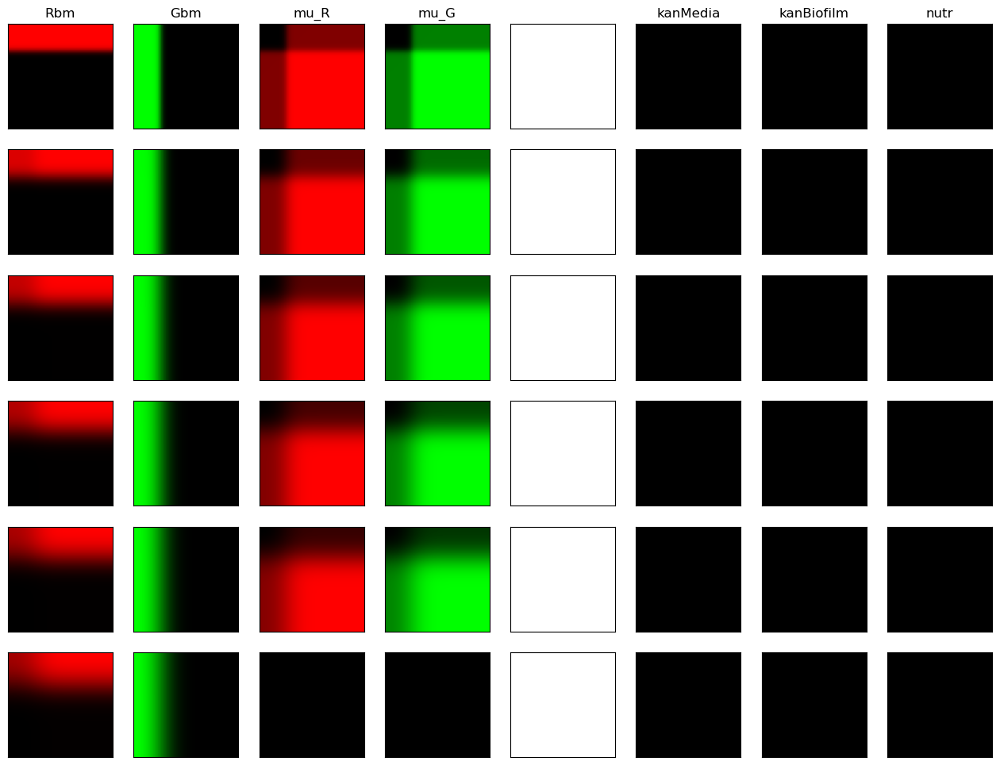

In [290]:
testSim=biofilmKanSimulate()
testSim.simulate()
testSim.showPlots()
simDf=testSim.getFits()
simDf

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information. 

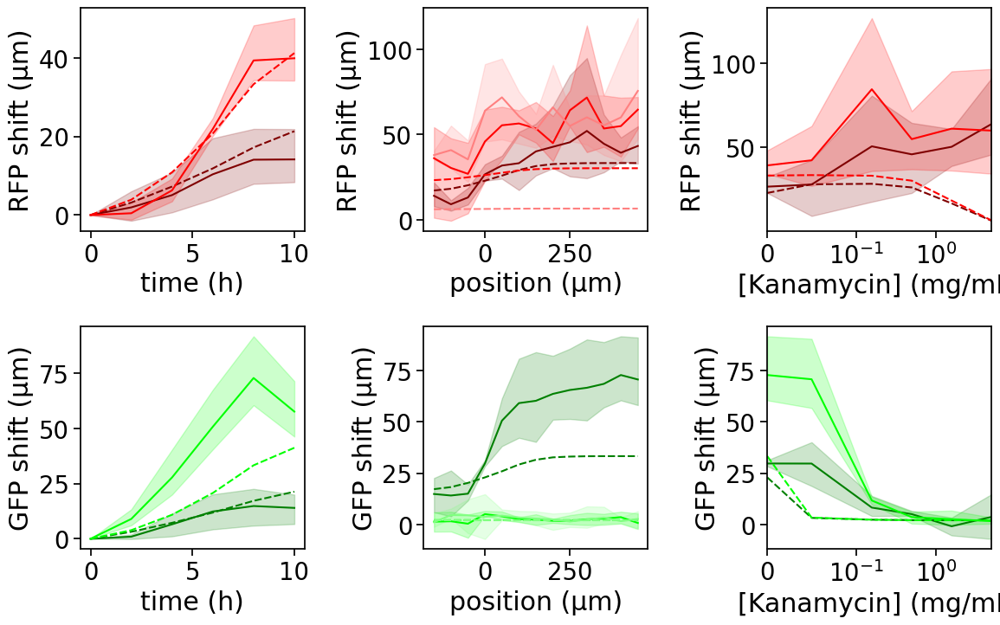

In [291]:
simKanGrad()

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information. 

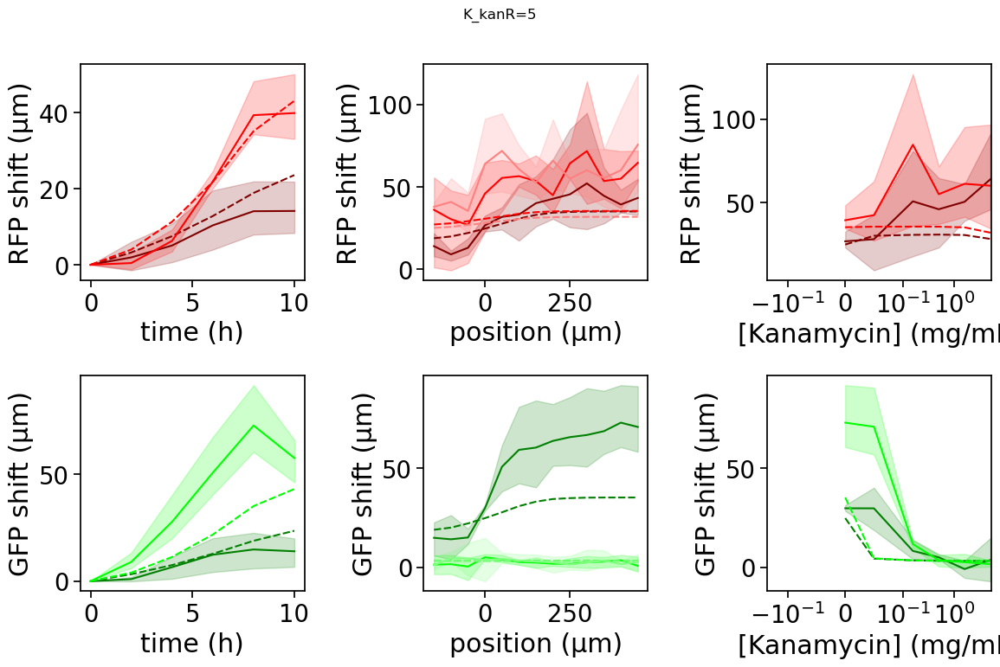

In [163]:
simKanGrad(K_kanR=5)

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information. 

CPU times: total: 7min 17s
Wall time: 2min 10s


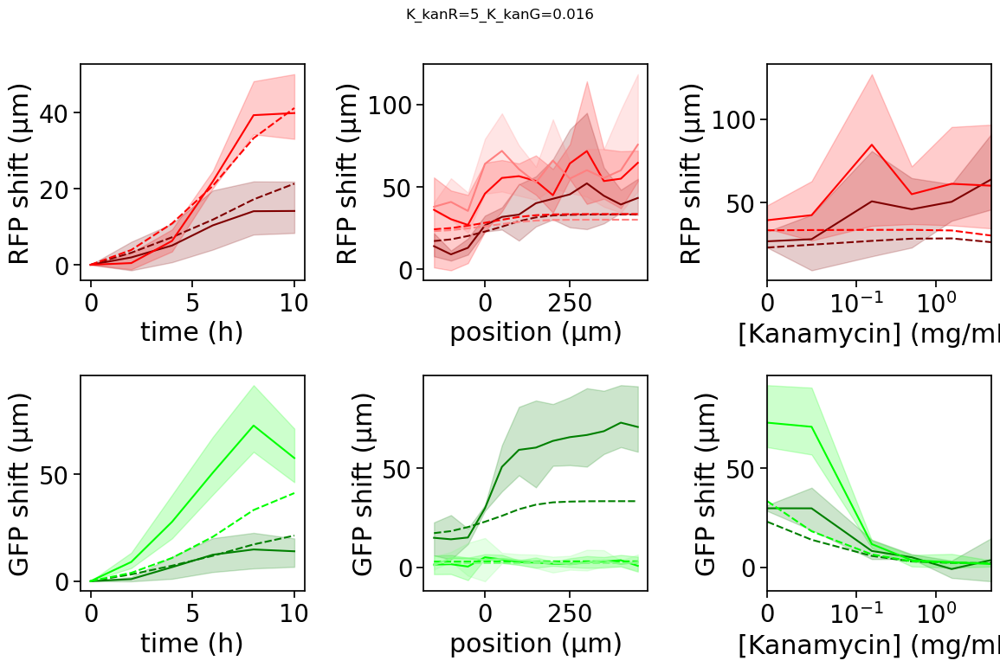

In [292]:
%%time
simKanGrad(K_kanR=5,K_kanG=0.016)

C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])
C:\Users\Xiaofan\miniconda3\envs\biofilm\Lib\site-packages\pandas\core\dtypes\cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information. 

CPU times: total: 13min 30s
Wall time: 3min 57s


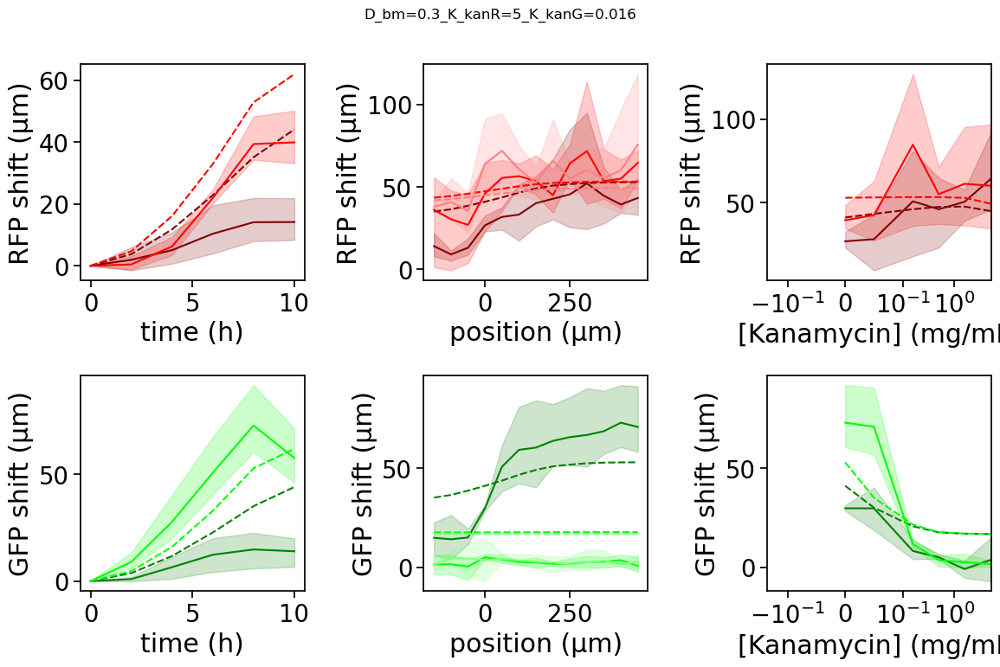

In [170]:
%%time
simKanGrad(D_bm=.3,K_kanR=5,K_kanG=0.016)

# following code uses matlab generated simulation data

In [465]:
#defining axes for loading data from experimental dataset
conds=['kan_0.00']+[f'kan_{conc:.2f}' for conc in [0.05*np.power(10,exp) for exp in np.arange(0,3.5,.5)]]+['amp_0.00']+[f'amp_{conc:.2f}' for conc in [0.1*np.power(10,exp) for exp in np.arange(0,3.5,.5)]]
times=2*np.arange(7)
positions=np.arange(-150,401,50)
reps=np.arange(1,4)

#load experimental data into pandas dataframe using defined axes as identifiers
data=loadmat(os.path.join(os.getcwd(),"extentsCondsFramesPosReps150_50_400logFit2window30x256"))
df=pd.DataFrame(np.column_stack(list(map(np.ravel,np.meshgrid(conds,times,positions,reps,indexing='ij')))+[np.ravel(data['greenWaveExtentsValsFull'])]+[np.ravel(data['redWaveExtentsValsFull'])]),
             columns=['cond','time (h)','position ($\mu$m)','rep','GFP growth ($\mu$m)','RFP growth ($\mu$m)'])

#split between ampicillin and kanamycin conditions
df[['ab','[Ampicillin] (mg/mL)']]=df.cond.str.split('_',expand=True)
df['[Kanamycin] (mg/mL)']=df['[Ampicillin] (mg/mL)']
df.loc[df.ab=='amp','[Kanamycin] (mg/mL)']=np.nan
df.loc[df.ab=='kan','[Ampicillin] (mg/mL)']=np.nan

#set datatypes, also label this dataset as experimental
df=df.astype({'cond':str,'time (h)':int,'position ($\mu$m)':int,'rep':int,'GFP growth ($\mu$m)':float,'RFP growth ($\mu$m)':float,'ab':str,'[Kanamycin] (mg/mL)':float,'[Ampicillin] (mg/mL)':float})
df['type']='experimental'
df.head()

,cond,time (h),position ($\mu$m),rep,GFP growth ($\mu$m),RFP growth ($\mu$m),ab,[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),type
0,kan_0.00,0,-150,1,0.0,0.0,kan,NaN,0.0,experimental
1,kan_0.00,0,-150,2,0.0,0.0,kan,NaN,0.0,experimental
2,kan_0.00,0,-150,3,0.0,0.0,kan,NaN,0.0,experimental
3,kan_0.00,0,-100,1,0.0,0.0,kan,NaN,0.0,experimental
4,kan_0.00,0,-100,2,0.0,0.0,kan,NaN,0.0,experimental


In [191]:
#load ampicillin simulated data
data=loadmat(os.path.join(os.getcwd(),"simExtents2022-04-04T01_59"))
conds=['amp_0.00']+[f'amp_{conc:.2f}' for conc in [0.1*np.power(10,exp) for exp in np.arange(0,2.5,.5)]]
times=2*np.arange(6)
positions=np.arange(-100,401,100)

df2=pd.DataFrame(np.column_stack(list(map(np.ravel,np.meshgrid(conds,times,positions,indexing='ij')))+[np.ravel(data['normGreenWaveSimExtents'])]+[np.ravel(data['normRedWaveSimExtents'])]),
             columns=['cond','time (h)','position ($\mu$m)','GFP growth ($\mu$m)','RFP growth ($\mu$m)'])
df2[['ab','[Ampicillin] (mg/mL)']]=df2.cond.str.split('_',expand=True)
df2['[Kanamycin] (mg/mL)']=np.nan
df2=df2.astype({'cond':str,'time (h)':int,'position ($\mu$m)':int,'GFP growth ($\mu$m)':float,'RFP growth ($\mu$m)':float,'ab':str,'[Kanamycin] (mg/mL)':float,'[Ampicillin] (mg/mL)':float})
df2['rep']=1
df2['type']='simulated'
df2.head()

C:\ProgramData\Anaconda3\lib\site-packages\scipy\io\matlab\mio.py:142: MatReadWarning: Duplicate variable name "None" in stream - replacing previous with new
Consider mio5.varmats_from_mat to split file into single variable files
  matfile_dict = MR.get_variables(variable_names)


,cond,time (h),position ($\mu$m),GFP growth ($\mu$m),RFP growth ($\mu$m),ab,[Ampicillin] (mg/mL),[Kanamycin] (mg/mL),rep,type
0,amp_0.00,0,-100,0.0,0.0,amp,0.0,NaN,1,simulated
1,amp_0.00,0,0,0.0,0.0,amp,0.0,NaN,1,simulated
2,amp_0.00,0,100,0.0,0.0,amp,0.0,NaN,1,simulated
3,amp_0.00,0,200,0.0,0.0,amp,0.0,NaN,1,simulated
4,amp_0.00,0,300,0.0,0.0,amp,0.0,NaN,1,simulated


In [192]:
#load kanamycin simulated data
data=loadmat(os.path.join(os.getcwd(),"simExtents2022-04-17T17_58"))
conds=['kan_0.00']+[f'kan_{conc:.2f}' for conc in [0.05*np.power(10,exp) for exp in np.arange(0,2.5,.5)]]
times=2*np.arange(6)
positions=np.arange(-100,401,100)

df3=pd.DataFrame(np.column_stack(list(map(np.ravel,np.meshgrid(conds,times,positions,indexing='ij')))+[np.ravel(data['normGreenWaveSimExtents'])]+[np.ravel(data['normRedWaveSimExtents'])]),
             columns=['cond','time (h)','position ($\mu$m)','GFP growth ($\mu$m)','RFP growth ($\mu$m)'])
df3[['ab','[Kanamycin] (mg/mL)']]=df3.cond.str.split('_',expand=True)
df3['[Ampicillin] (mg/mL)']=np.nan
df3=df3.astype({'cond':str,'time (h)':int,'position ($\mu$m)':int,'GFP growth ($\mu$m)':float,'RFP growth ($\mu$m)':float,'ab':str,'[Kanamycin] (mg/mL)':float,'[Ampicillin] (mg/mL)':float})
df3['rep']=1
df3['type']='simulated'
df3.head()

C:\ProgramData\Anaconda3\lib\site-packages\scipy\io\matlab\mio.py:142: MatReadWarning: Duplicate variable name "None" in stream - replacing previous with new
Consider mio5.varmats_from_mat to split file into single variable files
  matfile_dict = MR.get_variables(variable_names)


,cond,time (h),position ($\mu$m),GFP growth ($\mu$m),RFP growth ($\mu$m),ab,[Kanamycin] (mg/mL),[Ampicillin] (mg/mL),rep,type
0,kan_0.00,0,-100,0.0,0.0,kan,0.0,NaN,1,simulated
1,kan_0.00,0,0,0.0,0.0,kan,0.0,NaN,1,simulated
2,kan_0.00,0,100,0.0,0.0,kan,0.0,NaN,1,simulated
3,kan_0.00,0,200,0.0,0.0,kan,0.0,NaN,1,simulated
4,kan_0.00,0,300,0.0,0.0,kan,0.0,NaN,1,simulated


In [193]:
#concatenate experimental, simulated data into single dataframe
df=pd.concat([df,df2,df3])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [182]:
# define style of plot
# plotKind='scatter'
plotKind='line'

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


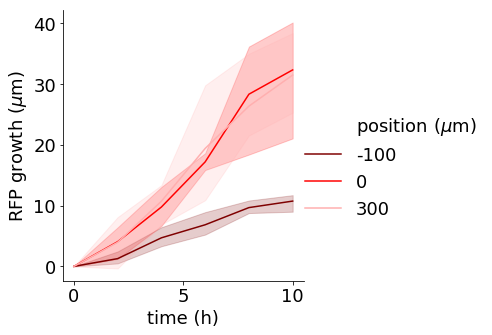

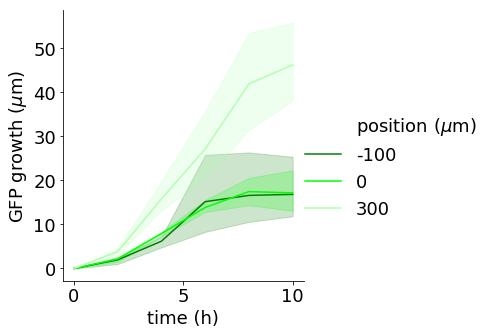

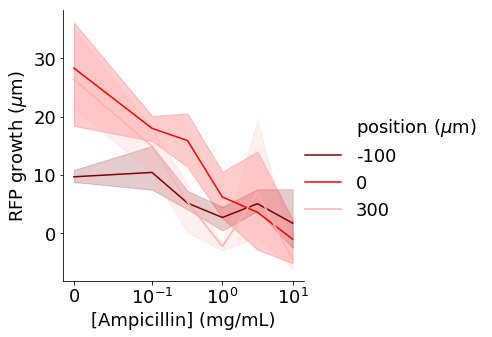

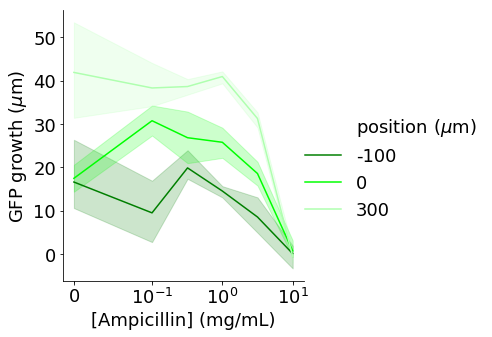

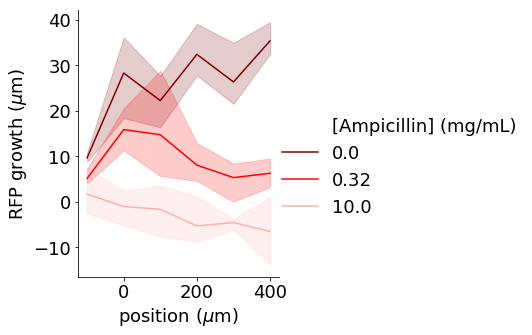

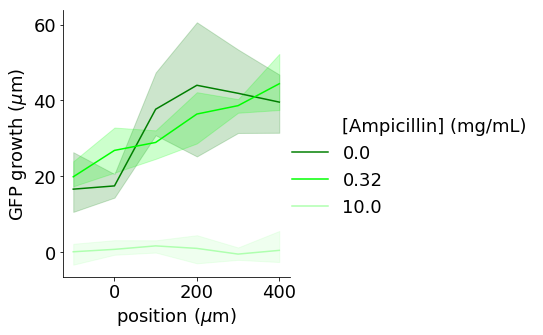

In [183]:
#make ampicillin plots with experimental datapoints only
plotDf=df[(df.type=='experimental')&(df['[Ampicillin] (mg/mL)']==0)&(df['time (h)']<12)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='time (h)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='time (h)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

plotDf=df[(df.type=='experimental')&(df['[Ampicillin] (mg/mL)']<=10)&(df['time (h)']==8)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='[Ampicillin] (mg/mL)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
plt.xscale('symlog', linthreshx=0.1)
sns.relplot(kind=plotKind,x='[Ampicillin] (mg/mL)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])
plt.xscale('symlog', linthreshx=0.1)

plotDf=df[(df.type=='experimental')&(df['[Ampicillin] (mg/mL)'].isin([0,.32,10]))&(df['time (h)']==8)&(df['position ($\mu$m)'].isin(np.arange(-100,500,100)))]
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='RFP growth ($\mu$m)',hue='[Ampicillin] (mg/mL)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='GFP growth ($\mu$m)',hue='[Ampicillin] (mg/mL)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


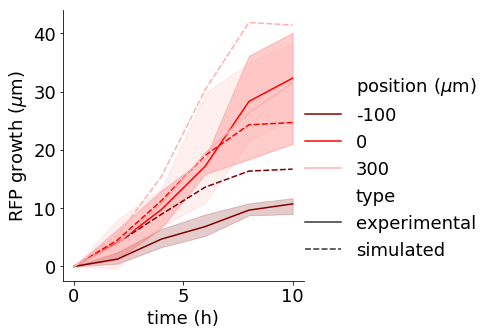

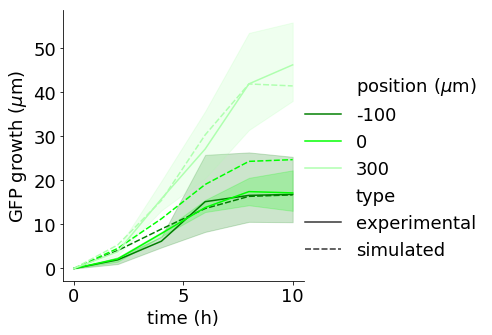

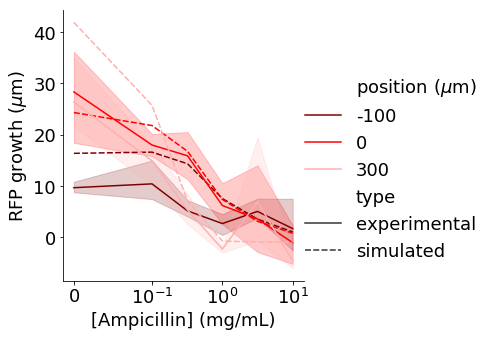

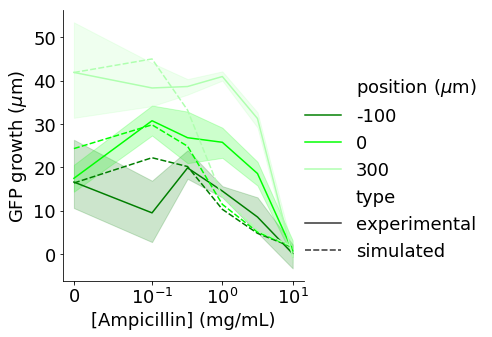

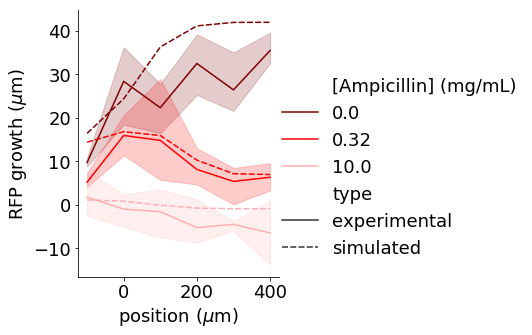

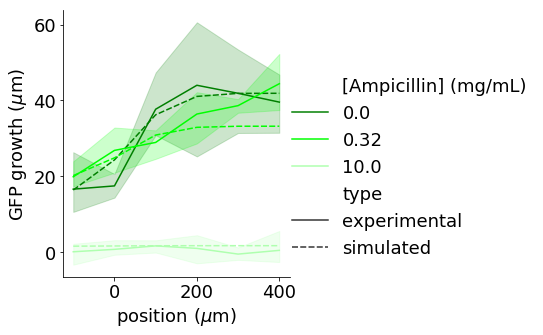

In [194]:
#make ampicillin plots superimposed with simulated data
plotDf=df[(df['[Ampicillin] (mg/mL)']==0)&(df['time (h)']<12)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='time (h)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='time (h)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

plotDf=df[(df['[Ampicillin] (mg/mL)']<=10)&(df['time (h)']==8)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='[Ampicillin] (mg/mL)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
plt.xscale('symlog', linthreshx=0.1)
sns.relplot(kind=plotKind,x='[Ampicillin] (mg/mL)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])
plt.xscale('symlog', linthreshx=0.1)

plotDf=df[(df['[Ampicillin] (mg/mL)'].isin([0,.32,10]))&(df['time (h)']==8)&(df['position ($\mu$m)'].isin(np.arange(-100,500,100)))]
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='RFP growth ($\mu$m)',hue='[Ampicillin] (mg/mL)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='GFP growth ($\mu$m)',hue='[Ampicillin] (mg/mL)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


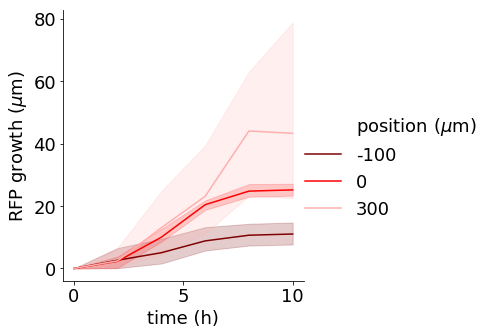

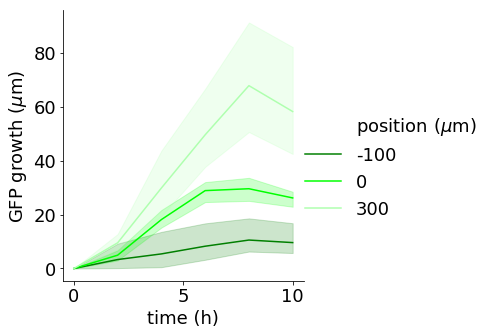

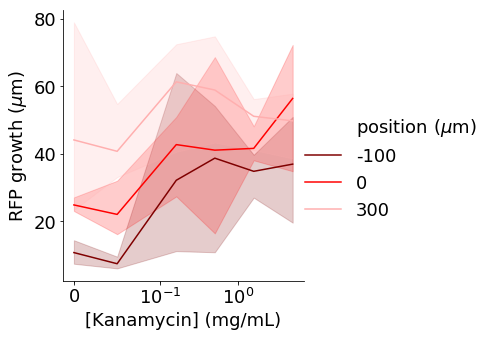

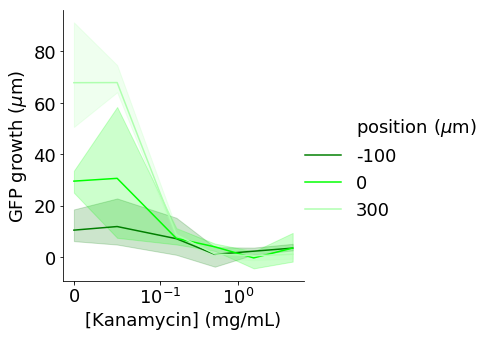

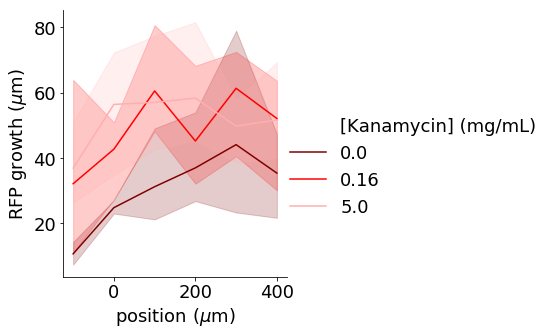

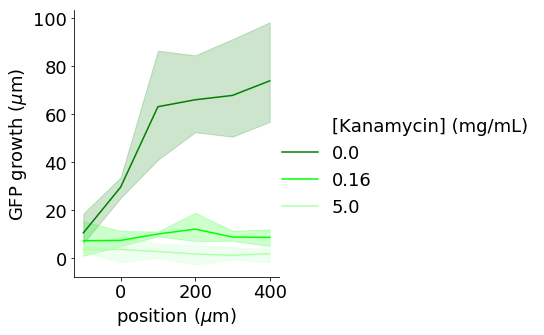

In [184]:
#make kanamycin plots with experimental datapoints only
plotDf=df[(df.type=='experimental')&(df['[Kanamycin] (mg/mL)']==0)&(df['time (h)']<12)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='time (h)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='time (h)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

plotDf=df[(df.type=='experimental')&(df['[Kanamycin] (mg/mL)']<=10)&(df['time (h)']==8)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='[Kanamycin] (mg/mL)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
plt.xscale('symlog', linthreshx=0.1)
sns.relplot(kind=plotKind,x='[Kanamycin] (mg/mL)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])
plt.xscale('symlog', linthreshx=0.1)

plotDf=df[(df.type=='experimental')&(df['[Kanamycin] (mg/mL)'].isin([0,.16,5]))&(df['time (h)']==8)&(df['position ($\mu$m)'].isin(np.arange(-100,500,100)))]
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='RFP growth ($\mu$m)',hue='[Kanamycin] (mg/mL)',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='GFP growth ($\mu$m)',hue='[Kanamycin] (mg/mL)',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


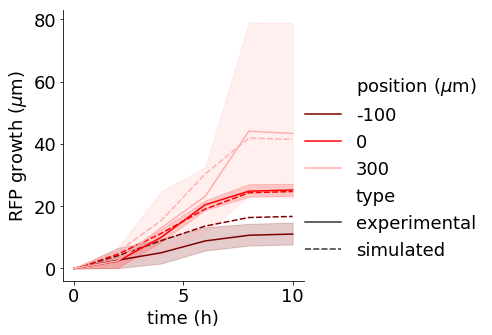

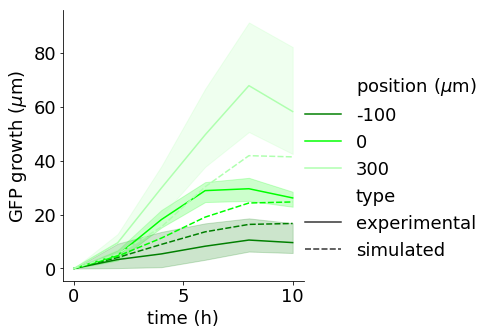

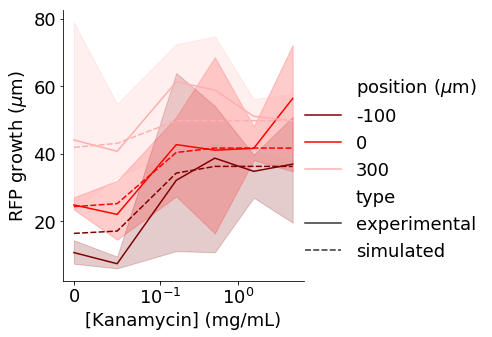

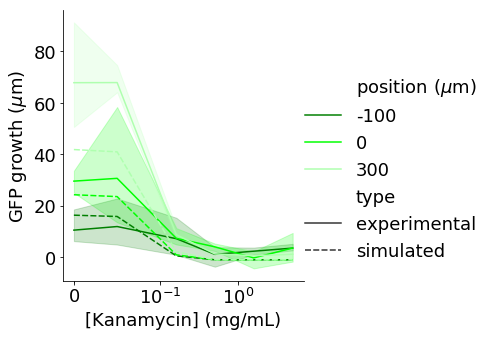

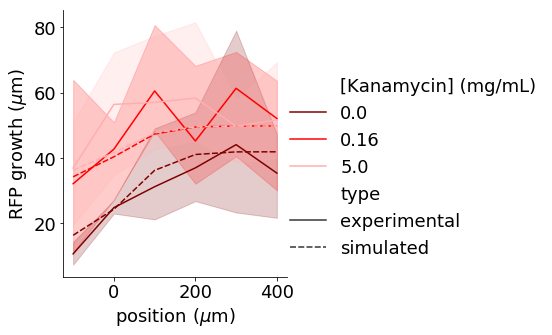

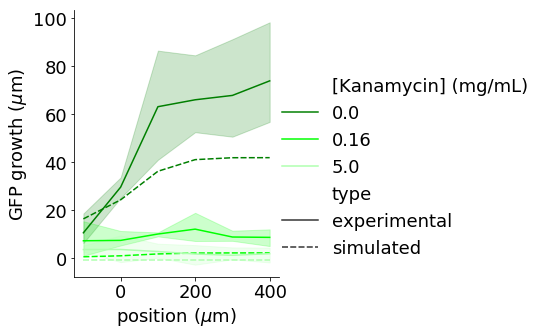

In [186]:
#make kanamycin plots superimposed with simulated data
plotDf=df[(df['[Kanamycin] (mg/mL)']==0)&(df['time (h)']<12)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='time (h)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='time (h)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])

plotDf=df[(df['[Kanamycin] (mg/mL)']<=10)&(df['time (h)']==8)&(df['position ($\mu$m)'].isin([-100,0,300]))]
sns.relplot(kind=plotKind,x='[Kanamycin] (mg/mL)',y='RFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
plt.xscale('symlog', linthreshx=0.1)
sns.relplot(kind=plotKind,x='[Kanamycin] (mg/mL)',y='GFP growth ($\mu$m)',hue='position ($\mu$m)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])
plt.xscale('symlog', linthreshx=0.1)

plotDf=df[(df['[Kanamycin] (mg/mL)'].isin([0,.16,5]))&(df['time (h)']==8)&(df['position ($\mu$m)'].isin(np.arange(-100,500,100)))]
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='RFP growth ($\mu$m)',hue='[Kanamycin] (mg/mL)',style='type',data=plotDf,palette=["#7F0000","#FF0000","#FFAFAF"])
sns.relplot(kind=plotKind,x='position ($\mu$m)',y='GFP growth ($\mu$m)',hue='[Kanamycin] (mg/mL)',style='type',data=plotDf,palette=["#007F00","#00FF00","#AFFFAF"])